In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [79]:
shots = pd.read_excel("/Users/sp/Downloads/Dissertation/Datasets/shots_combined/shots_all_combined_v4.xlsx")
shots = shots.iloc[:, 1:]

In [46]:
shots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257800 entries, 0 to 257799
Data columns (total 87 columns):
 #   Column                                Non-Null Count   Dtype         
---  ------                                --------------   -----         
 0   id                                    257800 non-null  int64         
 1   minute                                257800 non-null  int64         
 2   result                                257800 non-null  object        
 3   X                                     257800 non-null  float64       
 4   Y                                     257800 non-null  float64       
 5   xG                                    257800 non-null  float64       
 6   player_striker                        257800 non-null  object        
 7   h_a                                   257800 non-null  object        
 8   player_id_striker                     257800 non-null  int64         
 9   situation                             257800 non-null  obje

In [48]:
# Calculate goal-related statistics such as total goals, total penalties, penalties scored, and penalties missed
# The function takes in conditions for goals and penalties and computes the required counts.def calculate_counts(df, goal_condition, penalty_condition):
def calculate_counts(df, goal_condition, penalty_condition):
    total_goals = goal_condition.sum()
    total_penalties = penalty_condition.sum()
    penalties_scored = (goal_condition & penalty_condition).sum()
    penalties_missed = total_penalties - penalties_scored
    return total_goals, total_penalties, penalties_scored, penalties_missed

# Calculate the number of goals with and without an assist
# This function determines how many goals were assisted and how many were not.
def calculate_assists(df):
    goal_assist_count = ((df['player_assisted'].notna()) & (df['is_goal'] == 1)).sum()
    goal_noassist_count = ((df['player_assisted'].isna()) & (df['is_goal'] == 1)).sum()
    return goal_assist_count, goal_noassist_count

def plot_doughnut_chart(data, labels, title, ax, colors=None):
    if colors is None:
        colors = sns.color_palette('Set2')
    wedges, texts, autotexts = ax.pie(data, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.3))
    for w in wedges:
        w.set_linewidth(0)
    ax.set_title(title)

def plot_grouped_charts(grouped_df, value_columns, labels, title_template, colors):
    rows = int(np.ceil(len(grouped_df) / 3))
    fig, axes = plt.subplots(rows, 3, figsize=(20, 5 * rows))
    axes = axes.flatten()

    for i, (index, row) in enumerate(grouped_df.iterrows()):
        data = [row[col] for col in value_columns]
        title = title_template.format(**row)
        plot_doughnut_chart(data, labels, title, axes[i], colors)

    plt.tight_layout()
    plt.show()

# Calculate summary statistics such as total goals, penalties, and assists
def calculate_summary(df, groupby_columns=None):
    if groupby_columns:
        grouped = df.groupby(groupby_columns)
        summary = grouped.apply(lambda x: pd.Series({
            'Total_Goals_attempted': (x['is_goal'] == 1).sum() + (x['is_goal'] == 0).sum(),
            'Total_Goals_scored': (x['is_goal'] == 1).sum(),
            'Total_Goals_missed':(x['is_goal'] == 0).sum(),
            'Total_Penalties': (x['is_Penalty'] == 1).sum(),
            'Penalties_scored': ((x['is_goal'] == 1) & (x['is_Penalty'] == 1)).sum(),
            'Penalties_missed': ((x['is_Penalty'] == 1).sum() - ((x['is_goal'] == 1) & (x['is_Penalty'] == 1)).sum()),
            'goal_assist_count': ((x['player_assisted'].notna()) & (x['is_goal'] == 1)).sum(),
            'goal_noassist_count': ((x['player_assisted'].isna()) & (x['is_goal'] == 1)).sum()
        })).reset_index()
    else:
        summary = pd.DataFrame({
            'Total_Goals_attempted': (df['is_goal'] == 1).sum() + (df['is_goal'] == 0).sum(),
            'Total_Goals_scored': [(df['is_goal'] == 1).sum()],
            'Total_Goals_missed':(df['is_goal'] == 0).sum(),
            'Total_Penalties': [(df['is_Penalty'] == 1).sum()],
            'Penalties_scored': [((df['is_goal'] == 1) & (df['is_Penalty'] == 1)).sum()],
            'Penalties_missed': [(df['is_Penalty'] == 1).sum() - ((df['is_goal'] == 1) & (df['is_Penalty'] == 1)).sum()],
            'goal_assist_count': [((df['player_assisted'].notna()) & (df['is_goal'] == 1)).sum()],
            'goal_noassist_count': [((df['player_assisted'].isna()) & (df['is_goal'] == 1)).sum()]
        })

    return summary

In [49]:
# Overall summary
overall_summary = calculate_summary(shots)
print("Overall Summary of Goals, Penalties Attempted, and Penalties Scored")
overall_summary.transpose()

Overall Summary of Goals, Penalties Attempted, and Penalties Scored


,0
Total_Goals_attempted,257800
Total_Goals_scored,27030
Total_Goals_missed,230770
Total_Penalties,3200
Penalties_scored,2465
Penalties_missed,735
goal_assist_count,18908
goal_noassist_count,8122


In [50]:
# Per season summary
season_summary = calculate_summary(shots, 'season')
print("Summary per Season")
season_summary

Summary per Season


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/556713493.py:42: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,season,Total_Goals_attempted,Total_Goals_scored,Total_Goals_missed,Total_Penalties,Penalties_scored,Penalties_missed,goal_assist_count,goal_noassist_count
0,2014,29039,2912,26127,311,232,79,2046,866
1,2015,28750,2953,25797,309,236,73,2109,844
2,2016,29068,3221,25847,364,267,97,2226,995
3,2017,28254,2963,25291,319,226,93,2120,843
4,2018,29500,2977,26523,355,287,68,2057,920
5,2019,28929,3047,25882,427,348,79,2059,988
6,2020,26883,3037,23846,416,334,82,2104,933
7,2021,28684,3016,25668,377,293,84,2137,879
8,2022,28693,2904,25789,322,242,80,2050,854


In [51]:
# Per league summary
league_summary = calculate_summary(shots, 'league_name_striker')
print("Summary per League")
league_summary

Summary per League


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/556713493.py:42: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,league_name_striker,Total_Goals_attempted,Total_Goals_scored,Total_Goals_missed,Total_Penalties,Penalties_scored,Penalties_missed,goal_assist_count,goal_noassist_count
0,la liga,80824,8733,72091,1108,841,267,6114,2619
1,premier league,86501,9045,77456,882,690,192,6406,2639
2,serie a,90475,9252,81223,1210,934,276,6388,2864


In [52]:
# Per league per season summary
league_season_summary = calculate_summary(shots, ['season', 'league_name_striker'])
print("Summary per League per Season")
league_season_summary.set_index(['season','league_name_striker'], inplace=True)
league_season_summary

Summary per League per Season


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/556713493.py:42: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Total_Goals_attempted  Total_Goals_scored  \
season league_name_striker                                              
2014   la liga                               9046                 982   
       premier league                        9914                 942   
       serie a                              10079                 988   
2015   la liga                               9082                1014   
       premier league                        9819                 988   
       serie a                               9849                 951   
2016   la liga                               9162                1096   
       premier league                        9760                1029   
       serie a                              10146                1096   
2017   la liga                               9174                 994   
       premier league                        9287                 988   
       serie a                               9793                 981   
2018   la liga                               9273                 953   
       premier league                        9640                1036   
       serie a                              10587                 988   
2019   la liga                               8604                 924   
       premier league                        9427                1001   
       serie a                              10898                1122   
2020   la liga                               8132                 922   
       premier league                        9235                 986   
       serie a                               9516                1129   
2021   la liga                               8977                 926   
       premier league                        9775                1037   
       serie a                               9932                1053   
2022   la liga                               9374                 922   
       premier league                        9644                1038   
       serie a                               9675                 944   

                            Total_Goals_missed  Total_Penalties  \
season league_name_striker                                        
2014   la liga                            8064              110   
       premier league                     8972               83   
       serie a                            9091              118   
2015   la liga                            8068               97   
       premier league                     8831               91   
       serie a                            8898              121   
2016   la liga                            8066              121   
       premier league                     8731              106   
       serie a                            9050              137   
2017   la liga                            8180              113   
       premier league                     8299               80   
       serie a                            8812              126   
2018   la liga                            8320              130   
       premier league                     8604              103   
       serie a                            9599              122   
2019   la liga                            7680              149   
       premier league                     8426               92   
       serie a                            9776              186   
2020   la liga                            7210              141   
       premier league                     8249              125   
       serie a                            8387              150   
2021   la liga                            8051              132   
       premier league                     8738              103   
       serie a                            8879              142   
2022   la liga                            8452              115   
       premier league                     8606               99   
       serie a                    

In [53]:
league_season_summary.reset_index(inplace=True)

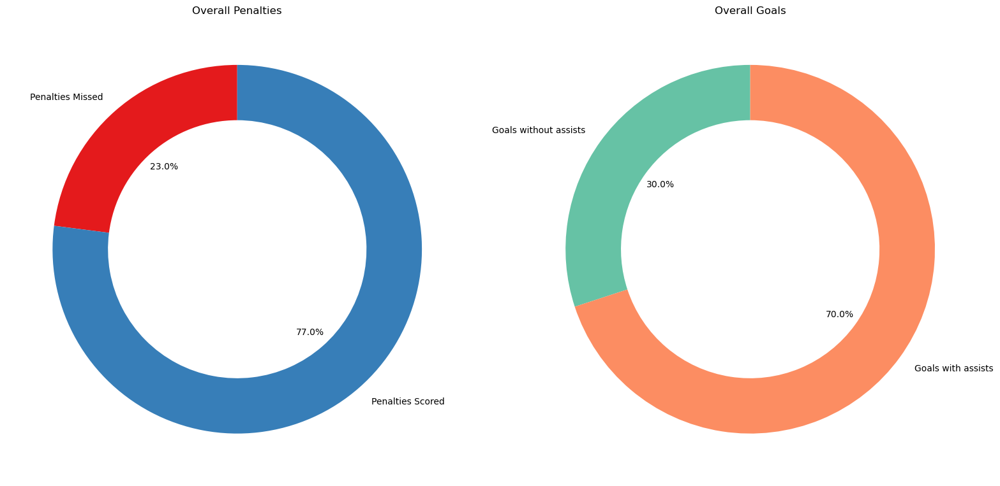

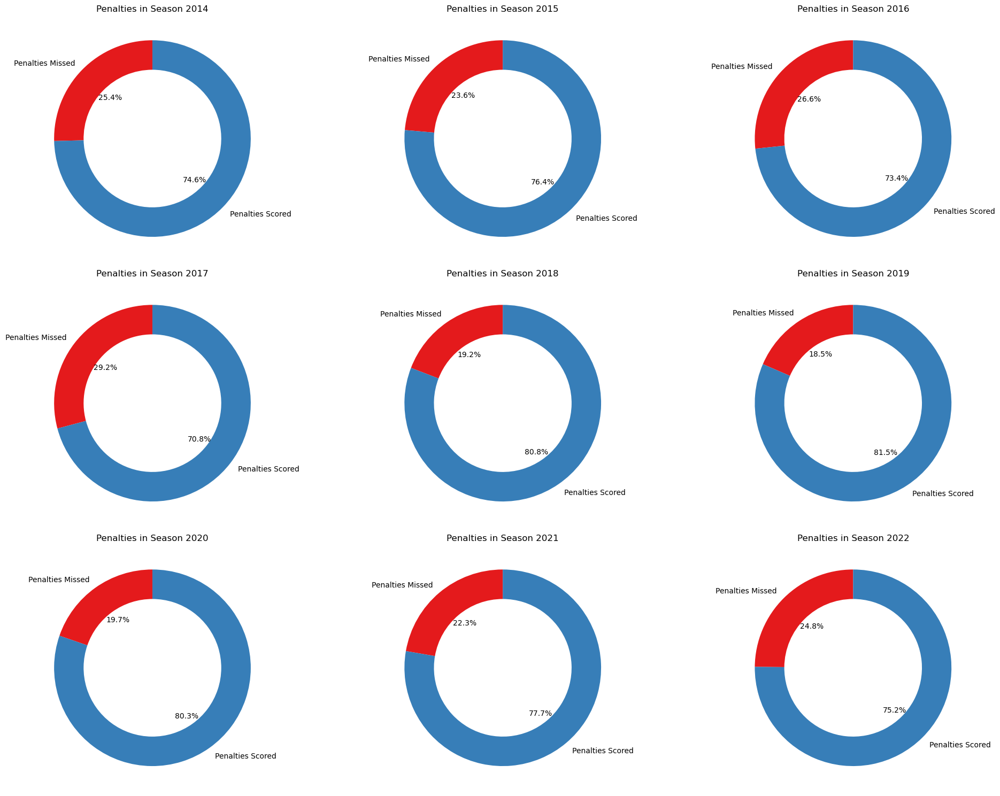

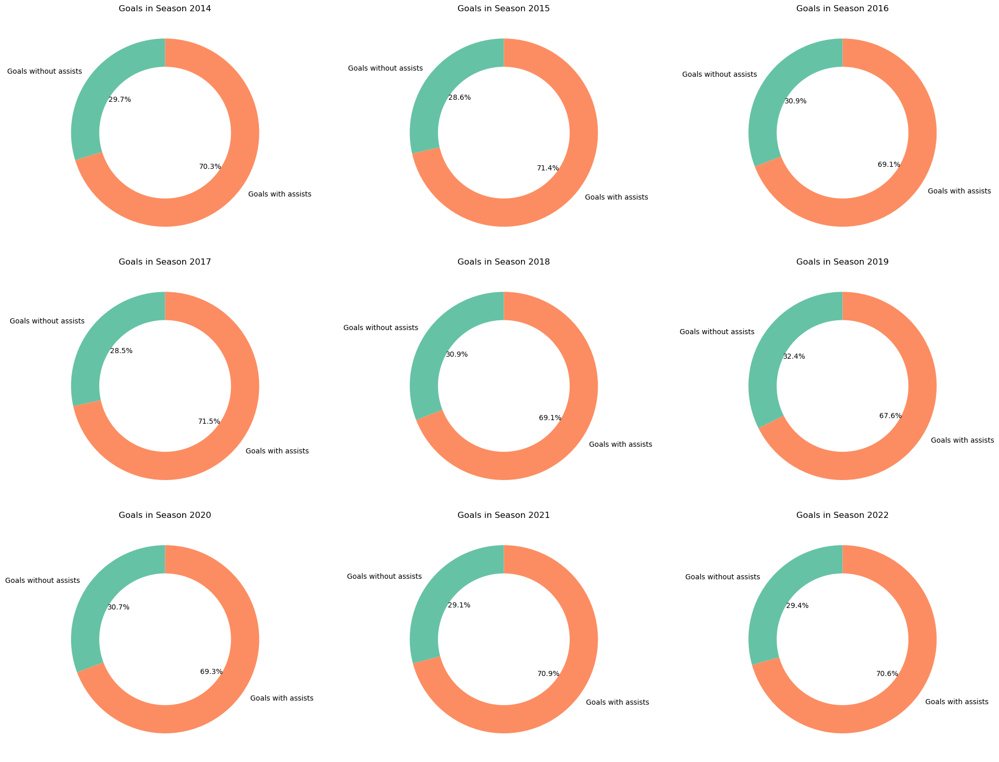

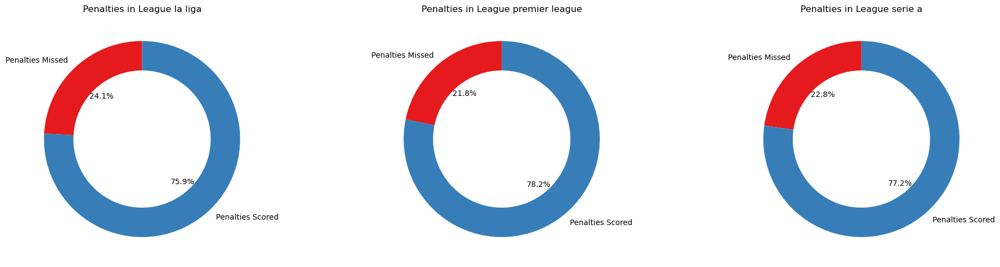

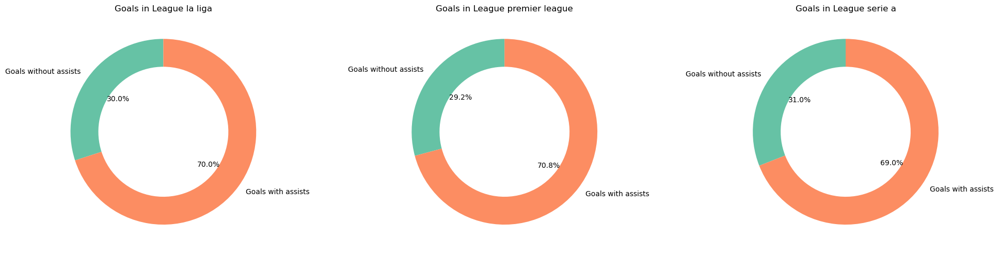

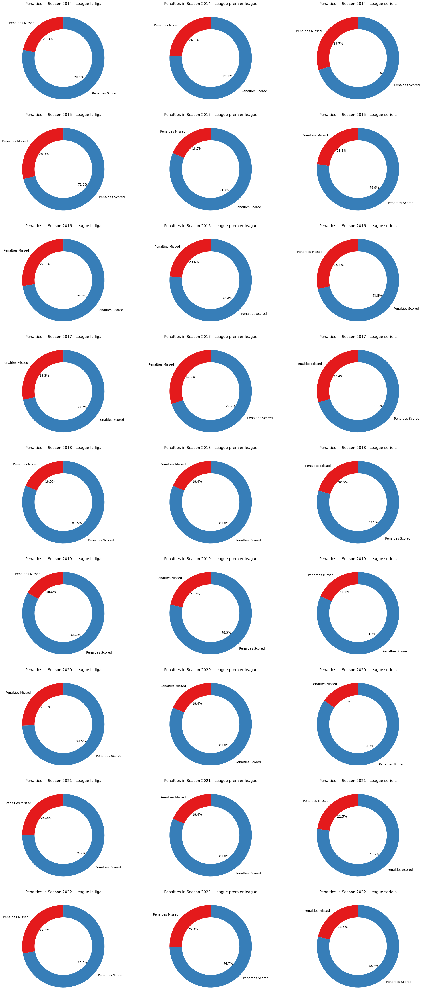

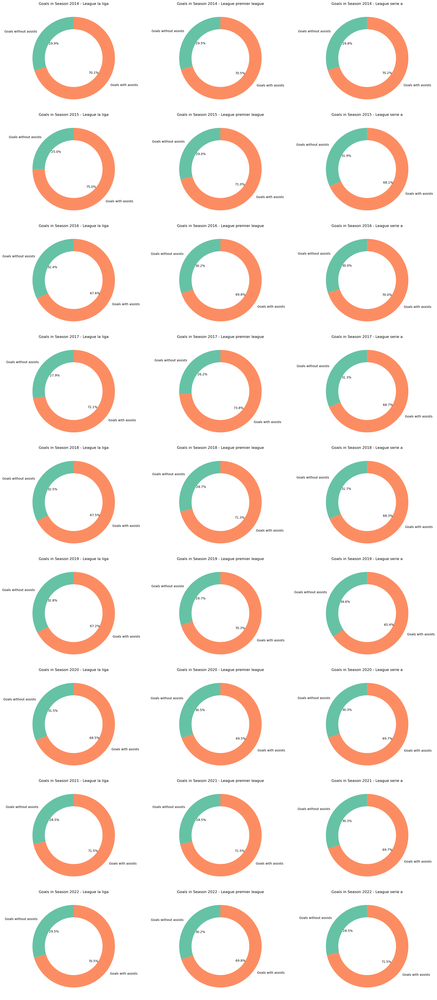

In [54]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
plot_doughnut_chart([overall_summary['Penalties_missed'][0], overall_summary['Penalties_scored'][0]], 
                    ['Penalties Missed', 'Penalties Scored'], "Overall Penalties", axes[0], colors=sns.color_palette('Set1'))
plot_doughnut_chart([overall_summary['goal_noassist_count'][0], overall_summary['goal_assist_count'][0]], 
                    ['Goals without assists', 'Goals with assists'], "Overall Goals", axes[1], colors=sns.color_palette('Set2'))
plt.tight_layout()
plt.show()

# Plot per season charts
plot_grouped_charts(season_summary, ['Penalties_missed', 'Penalties_scored'], ['Penalties Missed', 'Penalties Scored'], 
                    "Penalties in Season {season}", sns.color_palette('Set1'))
plot_grouped_charts(season_summary, ['goal_noassist_count', 'goal_assist_count'], ['Goals without assists', 'Goals with assists'], 
                    "Goals in Season {season}", sns.color_palette('Set2'))

# Plot per league charts
plot_grouped_charts(league_summary, ['Penalties_missed', 'Penalties_scored'], ['Penalties Missed', 'Penalties Scored'], 
                    "Penalties in League {league_name_striker}", sns.color_palette('Set1'))
plot_grouped_charts(league_summary, ['goal_noassist_count', 'goal_assist_count'], ['Goals without assists', 'Goals with assists'], 
                    "Goals in League {league_name_striker}", sns.color_palette('Set2'))

# Plot per league per season charts
plot_grouped_charts(league_season_summary, ['Penalties_missed', 'Penalties_scored'], ['Penalties Missed', 'Penalties Scored'], 
                    "Penalties in Season {season} - League {league_name_striker}", sns.color_palette('Set1'))
plot_grouped_charts(league_season_summary, ['goal_noassist_count', 'goal_assist_count'], ['Goals without assists', 'Goals with assists'], 
                    "Goals in Season {season} - League {league_name_striker}", sns.color_palette('Set2'))

In [59]:
# Calculate total goals scored by each player
player_goals = shots[shots['is_goal'] == 1].groupby('player_striker')['is_goal'].count().reset_index()
player_goals.columns = ['player_striker', 'total_goals']

# Calculate total chances (goals + misses) by each player
player_chances = shots.groupby('player_striker')['is_goal'].count().reset_index()
player_chances.columns = ['player_striker', 'total_chances']

# Merge the dataframes
player_metrics = pd.merge(player_goals, player_chances, on='player_striker', how='right')

# Fill NaN values in total_goals with 0
player_metrics['total_goals'] = player_metrics['total_goals'].fillna(0)

# Calculate goal scoring percentage
player_metrics['goal_scoring_percentage'] = player_metrics['total_goals'] / player_metrics['total_chances'] * 100

# Filter players with at least 500 total attempts
filtered_player_metrics = player_metrics[player_metrics['total_chances'] >= 500]

In [60]:
top_goal_scorers = player_metrics.nlargest(10, 'total_goals')

# Top 10 Chance Creators
top_chance_creators = player_metrics.nlargest(10, 'total_chances')

# Top 10 with the highest goal scoring percentage among players with at least 500 attempts
top_goal_scoring_percentage = filtered_player_metrics.nlargest(10, 'goal_scoring_percentage')

# Top 10 with the lowest goal scoring percentage among players with at least 500 attempts
lowest_goal_scoring_percentage = filtered_player_metrics.nsmallest(10, 'goal_scoring_percentage')

# Display the top 10 players for each metric
print("Top 10 Goal Scorers")
print(top_goal_scorers)

print("Top 10 Chance Creators")
print(top_chance_creators)

# Display the top 10 players for each metric
print("Top 10 with Highest Goal Scoring Percentage (min 500 attempts)")
print(top_goal_scoring_percentage)

print("Top 10 with Lowest Goal Scoring Percentage (min 500 attempts)")
print(lowest_goal_scoring_percentage)

Top 10 Goal Scorers
         player_striker  total_goals  total_chances  goal_scoring_percentage
725   Cristiano Ronaldo        234.0           1478                15.832206
2269       Lionel Messi        231.0           1244                18.569132
1515         Harry Kane        210.0           1154                18.197574
2377        Luis Suárez        196.0            974                20.123203
2801      Mohamed Salah        172.0            985                17.461929
672       Ciro Immobile        169.0            878                19.248292
2085      Karim Benzema        166.0            885                18.757062
3345      Romelu Lukaku        146.0            765                19.084967
1729        Jamie Vardy        136.0            619                21.970921
325   Antoine Griezmann        134.0            727                18.431912
Top 10 Chance Creators
         player_striker  total_goals  total_chances  goal_scoring_percentage
725   Cristiano Ronaldo        23

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2773233176.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




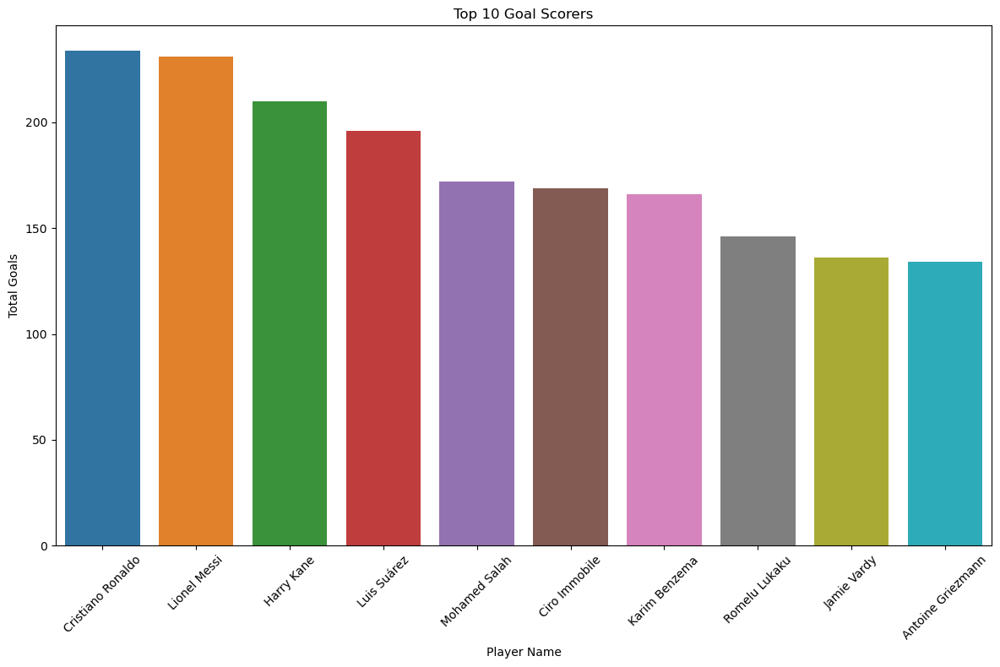

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2773233176.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




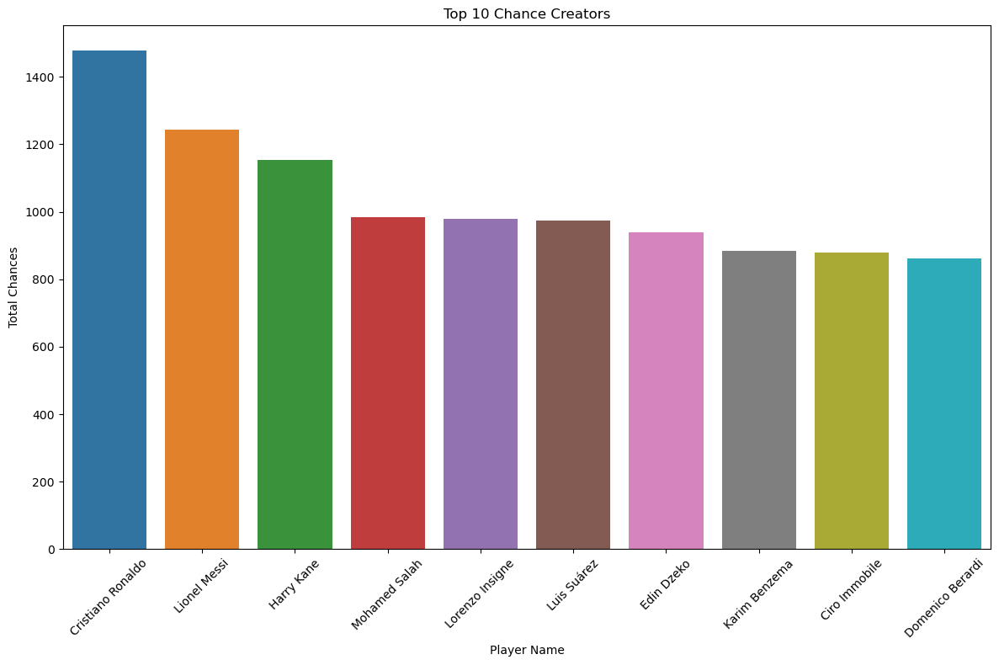

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2773233176.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




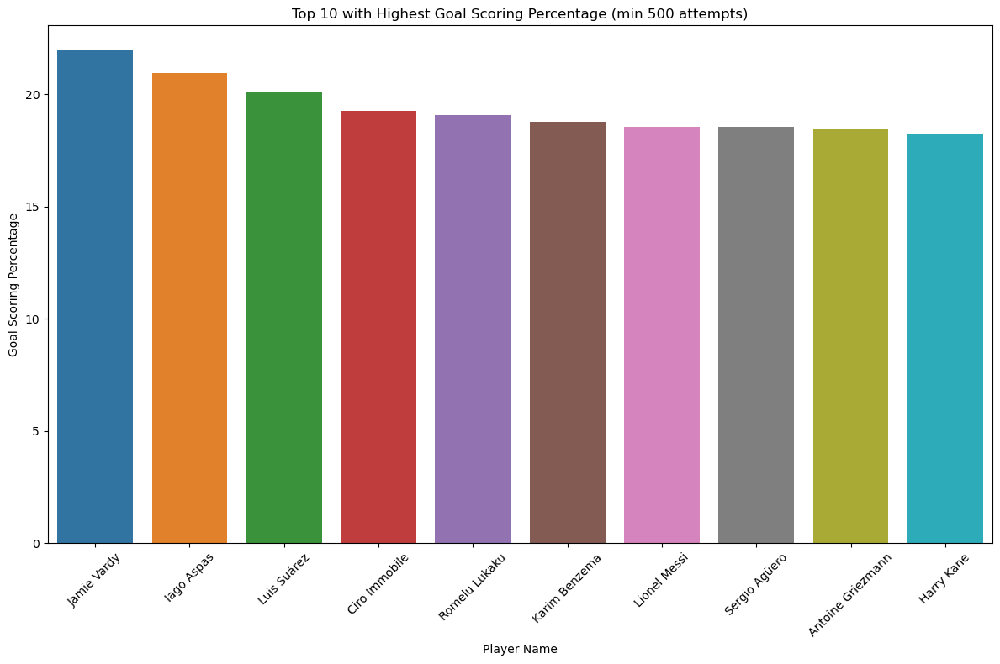

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2773233176.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




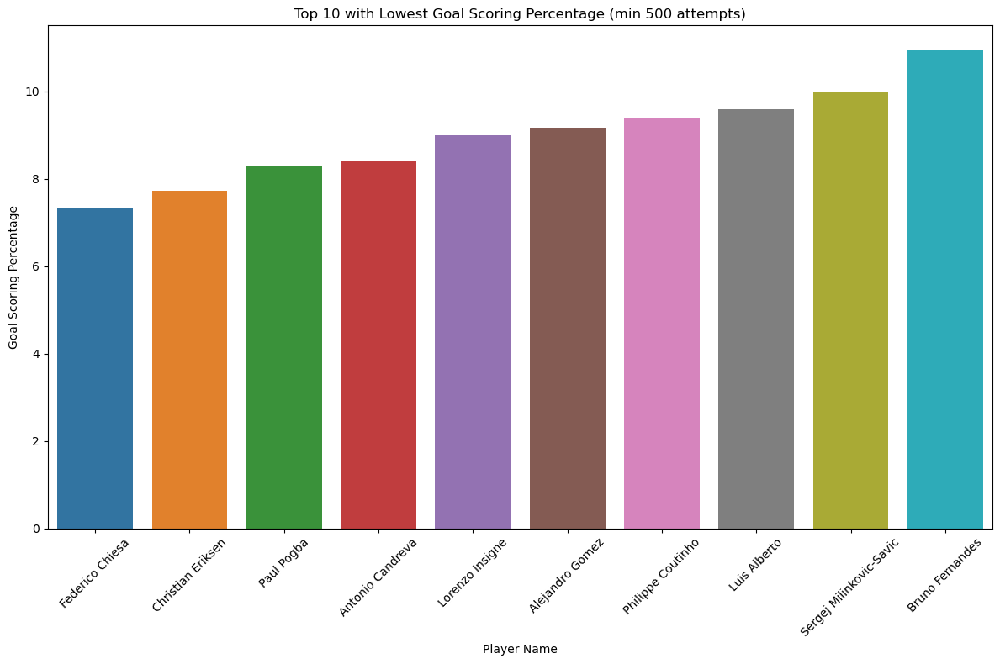

In [92]:
# Function to create bar plots
tableau20 = [
    "#1F77B4", "#FF7F0E", "#2CA02C", "#D62728", "#9467BD",
    "#8C564B", "#E377C2", "#7F7F7F", "#BCBD22", "#17BECF",
    "#9EDAE5", "#80B1D3", "#FDB462", "#B3DE69", "#FCCDE5",
    "#D9D9D9", "#BEBADA", "#FB8072", "#66C2A5", "#FC8D62"
]

def create_bar_plot(df, x, y, title, xlabel, ylabel):
    plt.figure(figsize=(12, 8))
    sns.barplot(data=df, x=x, y=y, palette= 'tab10')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Top 10 Goal Scorers
create_bar_plot(top_goal_scorers, 'player_striker', 'total_goals', 'Top 10 Goal Scorers', 'Player Name', 'Total Goals')

# Top 10 Chance Creators
create_bar_plot(top_chance_creators, 'player_striker', 'total_chances', 'Top 10 Chance Creators', 'Player Name', 'Total Chances')

# Top 10 with Highest Goal Scoring Percentage (min 500 attempts)
create_bar_plot(top_goal_scoring_percentage, 'player_striker', 'goal_scoring_percentage', 'Top 10 with Highest Goal Scoring Percentage (min 500 attempts)', 'Player Name', 'Goal Scoring Percentage')

# Top 10 with Lowest Goal Scoring Percentage (min 500 attempts)
create_bar_plot(lowest_goal_scoring_percentage, 'player_striker', 'goal_scoring_percentage', 'Top 10 with Lowest Goal Scoring Percentage (min 500 attempts)', 'Player Name', 'Goal Scoring Percentage')

In [62]:
# Calculate metrics for each player per season, including total goals, attempts, and goal scoring percentage.
def calculate_player_metrics(df):
    player_metrics = df.groupby(['season', 'player_striker']).agg(
        total_goals=('is_goal', 'sum'),
        total_attempts=('is_goal', 'count'),
    ).reset_index()

    player_metrics['total_chances'] = player_metrics['total_attempts']  # Assuming every attempt is a chance
    player_metrics['goal_scoring_percentage'] = player_metrics['total_goals'] / player_metrics['total_attempts']

    return player_metrics

def create_bar_plot(df, x, y, title, xlabel, ylabel):
    if df.empty:
        print(f"No data available for {title}")
        return
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df, x=x, y=y, palette='Set1')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.show()

def generate_seasonal_plots(season_data, attempts_threshold, entity='player_striker' ):
    for season, data in season_data.items():
        print(f"Season {season}")

        # Top 10 Goal Scorers/Creators
        top_goal_scorers = data.nlargest(10, 'total_goals')
        create_bar_plot(top_goal_scorers, entity, 'total_goals', f'Top 10 Goal Scorers - Season {season}', 'Entity', 'Total Goals')

        top_chance_creators = data.nlargest(10, 'total_chances')
        create_bar_plot(top_chance_creators, entity, 'total_chances', f'Top 10 Chance Creators - Season {season}', 'Entity', 'Total Chances')

        # Top 10 Goal Scoring Percentage (min 500 attempts for players and a reasonable threshold for teams)
        top_goal_scoring_percentage = data[data['total_attempts'] >= attempts_threshold].nlargest(10, 'goal_scoring_percentage')
        print(f"Top 10 Goal Scoring Percentage Data - Season {season}:\n", top_goal_scoring_percentage)  # Debug statement
        create_bar_plot(top_goal_scoring_percentage, entity, 'goal_scoring_percentage', f'Top 10 Goal Scoring Percentage - Season {season}', 'Entity', 'Goal Scoring Percentage')

        # Top 10 Lowest Goal Scoring Percentage (min 500 attempts for players and a reasonable threshold for teams)
        lowest_goal_scoring_percentage = data[data['total_attempts'] >= attempts_threshold].nsmallest(10, 'goal_scoring_percentage')
        print(f"Lowest 10 Goal Scoring Percentage Data - Season {season}:\n", lowest_goal_scoring_percentage)  # Debug statement
        create_bar_plot(lowest_goal_scoring_percentage, entity, 'goal_scoring_percentage', f'Lowest 10 Goal Scoring Percentage - Season {season}', 'Entity', 'Goal Scoring Percentage')

In [63]:
def calculate_team_metrics(df):
    team_metrics = df.groupby(['season', 'playerTeam']).agg(
        total_goals=('is_goal', 'sum'),
        total_attempts=('is_goal', 'count')
    ).reset_index()

    team_metrics['total_chances'] = team_metrics['total_attempts']  # Assuming every attempt is a chance
    team_metrics['goal_scoring_percentage'] = team_metrics['total_goals'] / team_metrics['total_attempts']

    return team_metrics

# Calculate player metrics for each season
player_metrics_season = calculate_player_metrics(shots)

# Calculate team metrics for each season
team_metrics_season = calculate_team_metrics(shots)

Season 2014


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




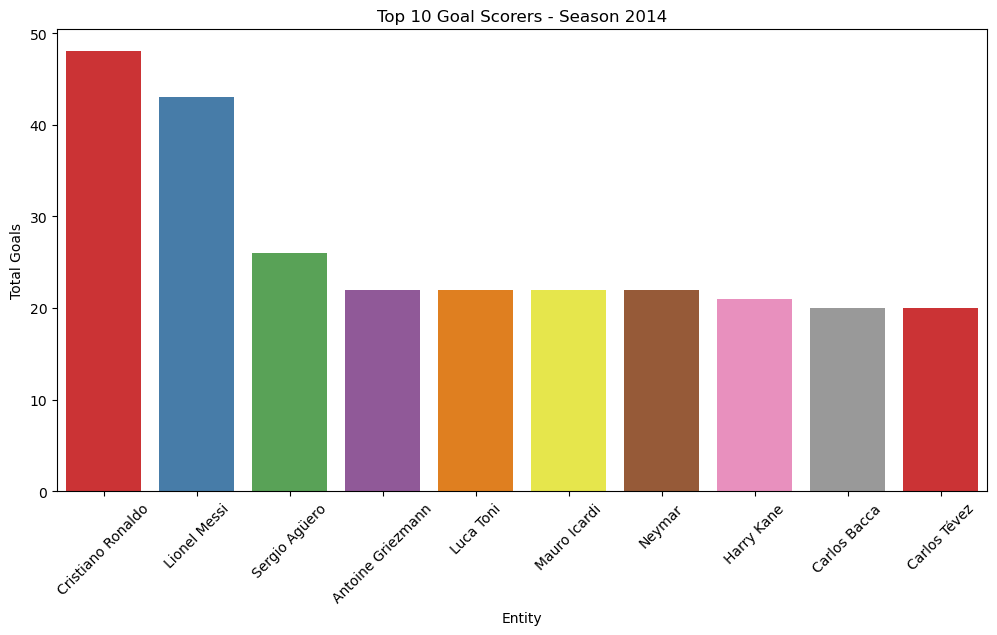

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




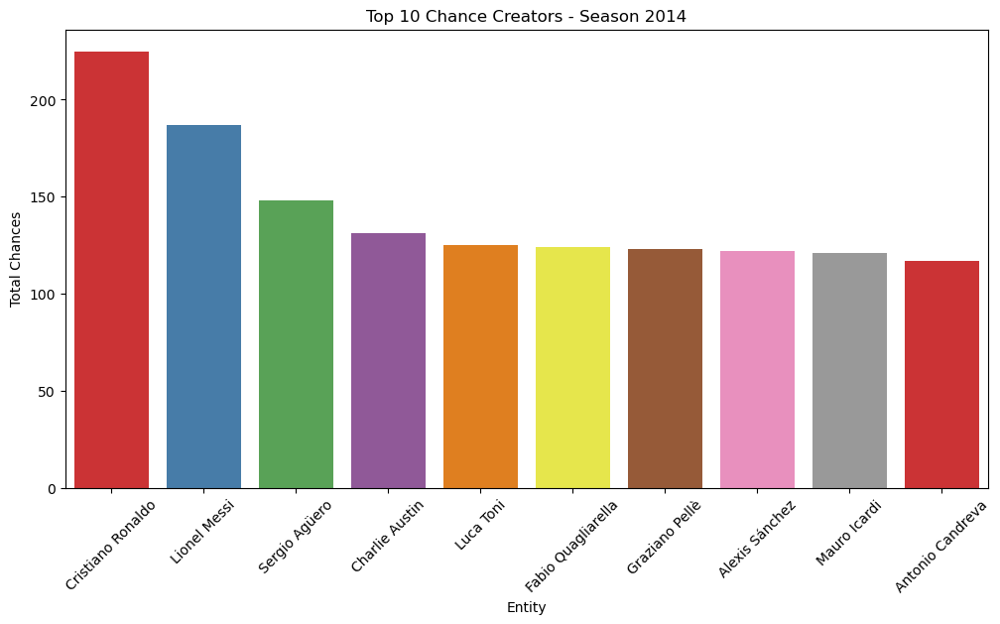

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Top 10 Goal Scoring Percentage Data - Season 2014:
      season     player_striker  total_goals  total_attempts  total_chances  \
185    2014       Carlos Bacca           20              69             69   
112    2014  Antoine Griezmann           22              78             78   
319    2014        Diego Costa           20              76             76   
969    2014             Neymar           22              95             95   
747    2014       Lionel Messi           43             187            187   
838    2014    Mario Mandzukic           12              55             55   
700    2014      Karim Benzema           15              69             69   
242    2014  Cristiano Ronaldo           48             225            225   
784    2014        Luis Suárez           16              75             75   
539    2014        Iago Falque           13              62             62   

     goal_scoring_percentage  
185                 0.289855  
112                 0.28205

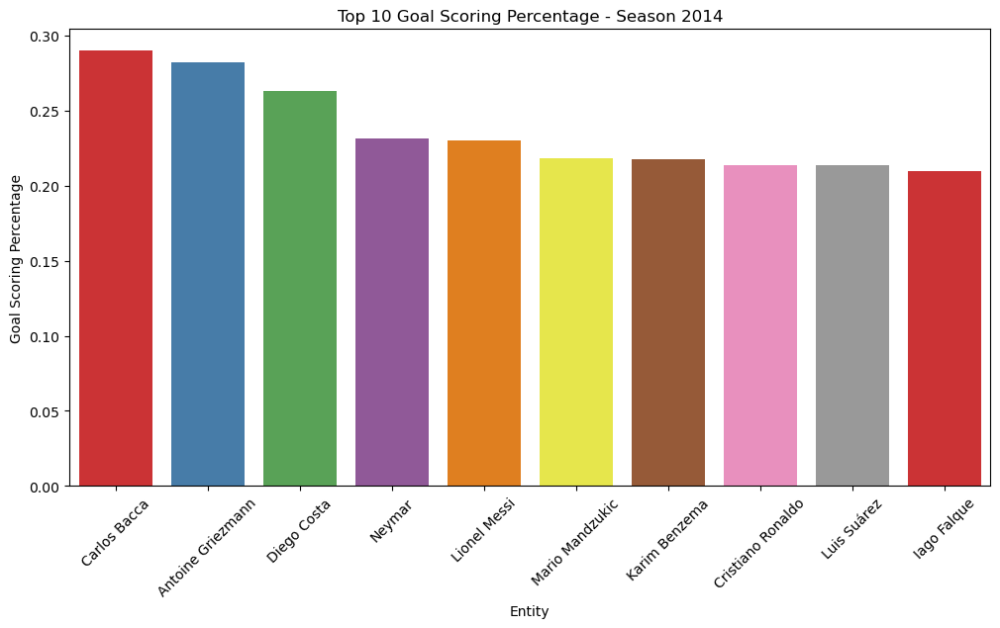

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2014:
       season     player_striker  total_goals  total_attempts  total_chances  \
836     2014    Mario Balotelli            1              56             56   
880     2014      Matías Vecino            2              55             55   
1295    2014            Willian            2              55             55   
643     2014      Jonjo Shelvey            3              63             63   
1043    2014  Philippe Coutinho            5             103            103   
1336    2014     Ángel Di María            3              61             61   
229     2014      Craig Gardner            3              56             56   
1151    2014        Saúl Berjón            3              55             55   
371     2014     Enner Valencia            4              72             72   
1303    2014    Yannick Bolasie            4              69             69   

      goal_scoring_percentage  
836                  0.017857  
880        

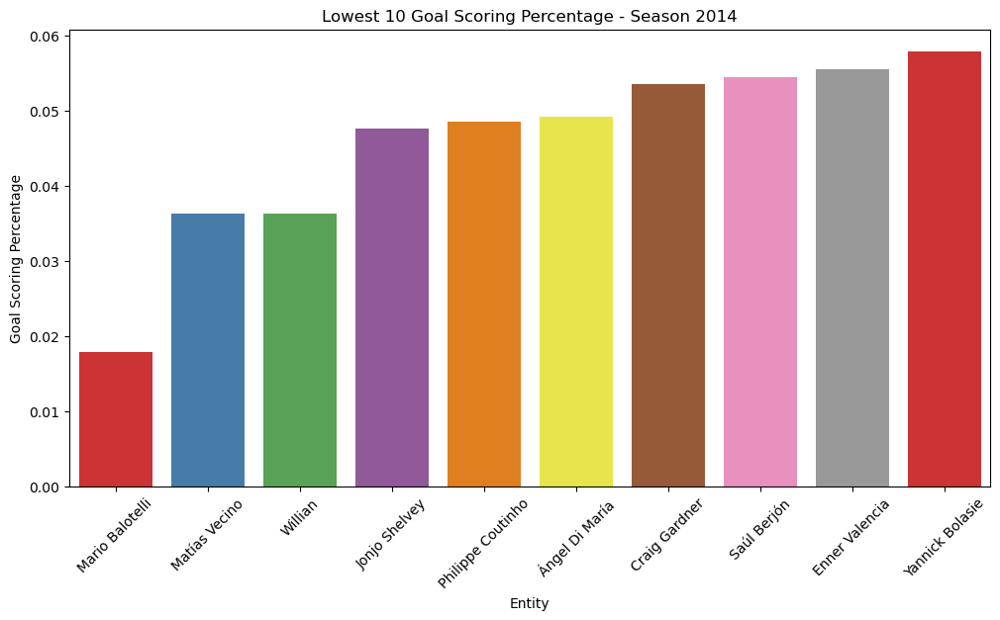

Season 2015


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




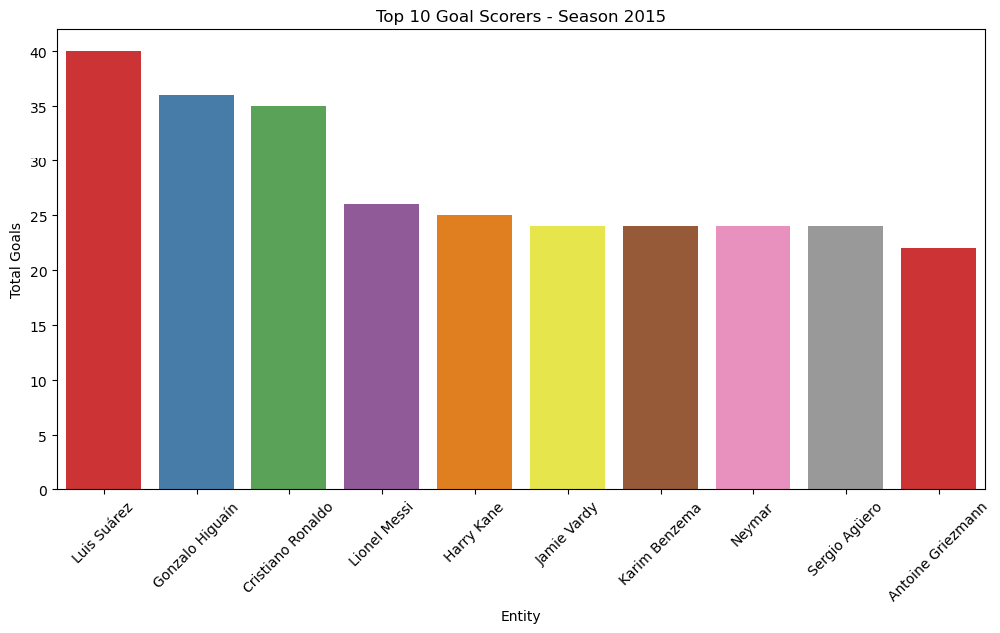

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




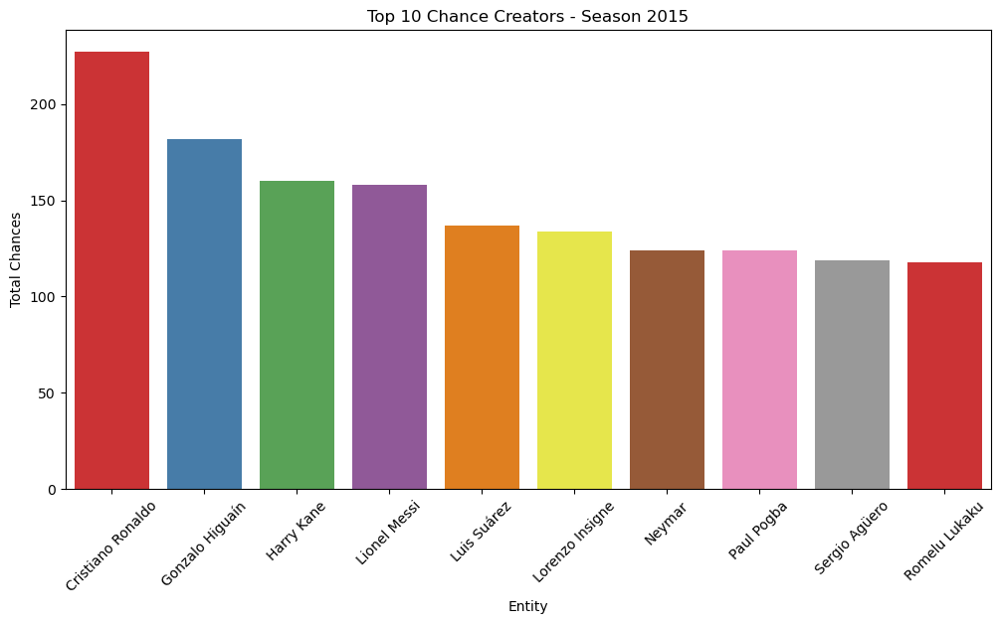

Top 10 Goal Scoring Percentage Data - Season 2015:
       season     player_striker  total_goals  total_attempts  total_chances  \
2124    2015        Luis Suárez           40             137            137   
2227    2015       Mauro Icardi           16              57             57   
2035    2015      Karim Benzema           24              98             98   
1452    2015  Antoine Griezmann           22              92             92   
1803    2015        Gareth Bale           19              81             81   
1536    2015       Carlos Bacca           18              77             77   
2658    2015   Youssef El-Arabi           16              70             70   
2043    2015      Kevin Gameiro           16              72             72   
1368    2015             Aduriz           20              93             93   
2340    2015       Paco Alcácer           13              61             61   

      goal_scoring_percentage  
2124                 0.291971  
2227          

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




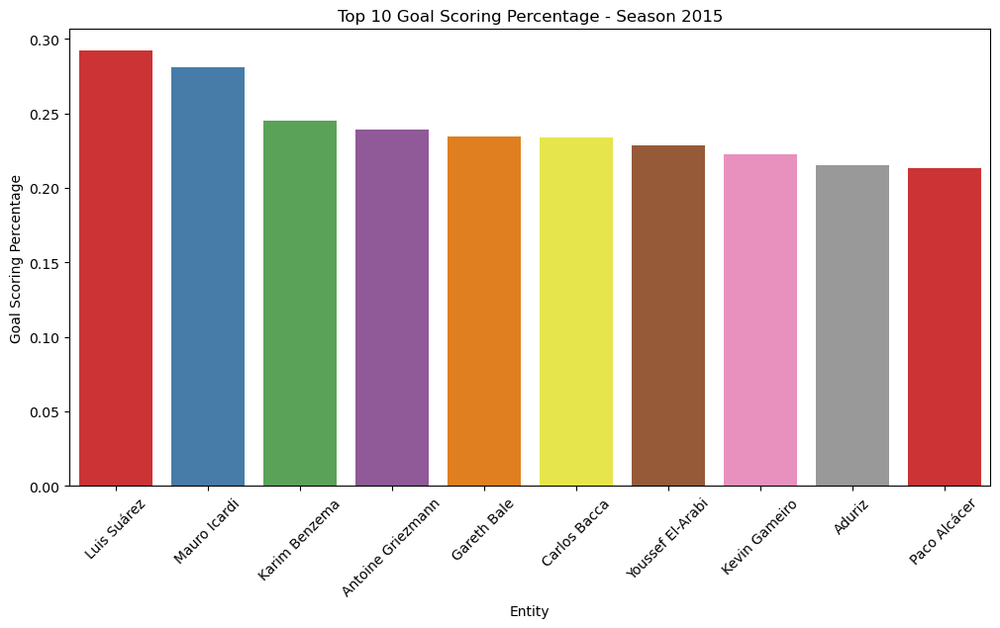

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2015:
       season       player_striker  total_goals  total_attempts  total_chances  \
1972    2015        Jonjo Shelvey            1              56             56   
2234    2015        Memphis Depay            2              57             57   
1491    2015                 Bebé            3              80             80   
1388    2015       Alen Halilovic            3              58             58   
2202    2015         Matt Ritchie            4              77             77   
2161    2015         Marco Parolo            3              55             55   
2163    2015        Marcos Alonso            3              55             55   
1823    2015  Giacomo Bonaventura            6             104            104   
1563    2015    Christian Eriksen            6             100            100   
2038    2015                Keita            4              62             62   

      goal_scoring_percentage  
1972                 

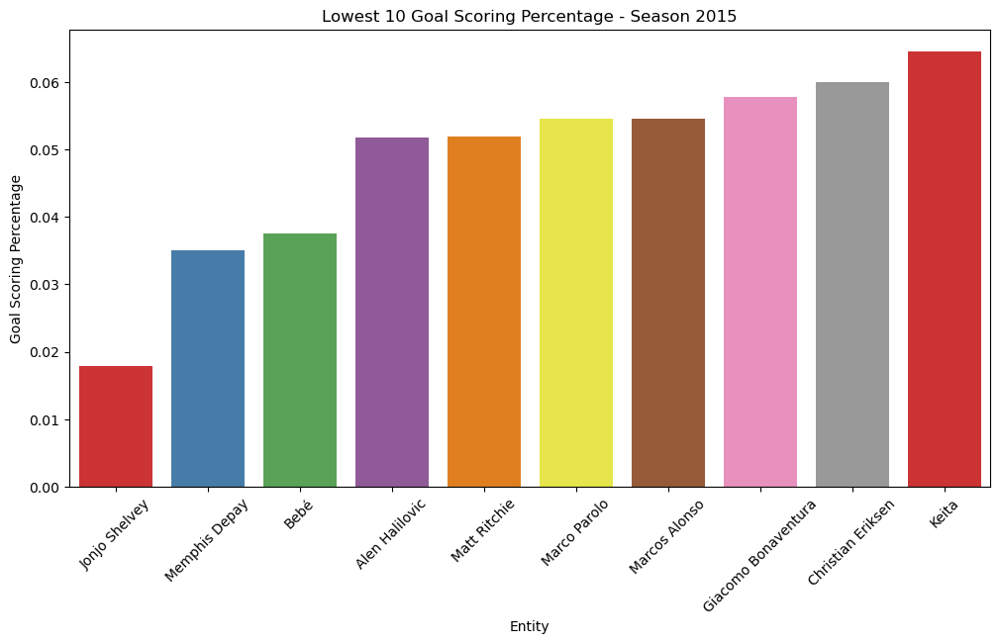

Season 2016


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




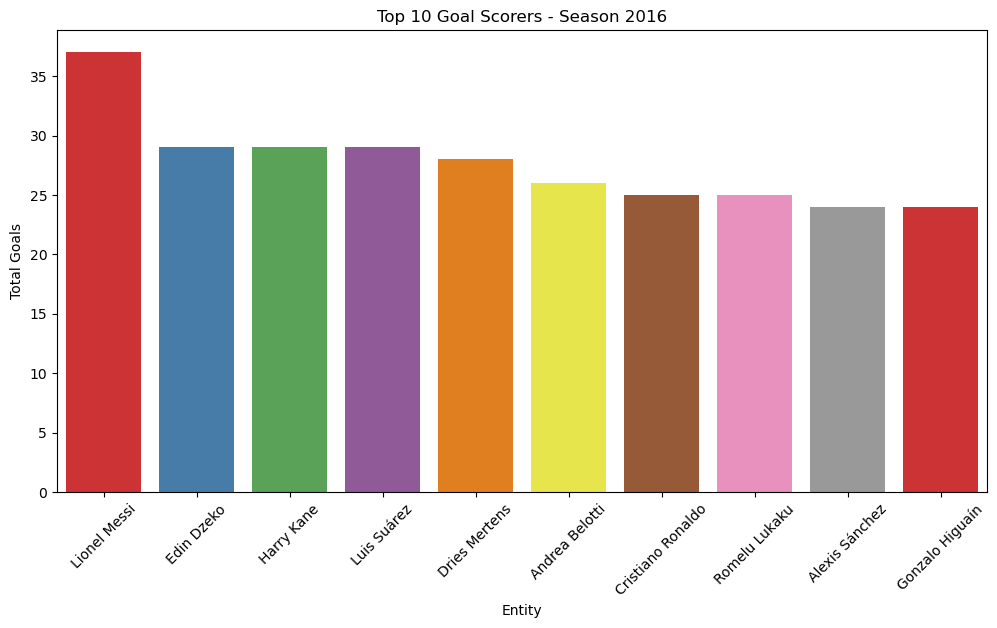

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




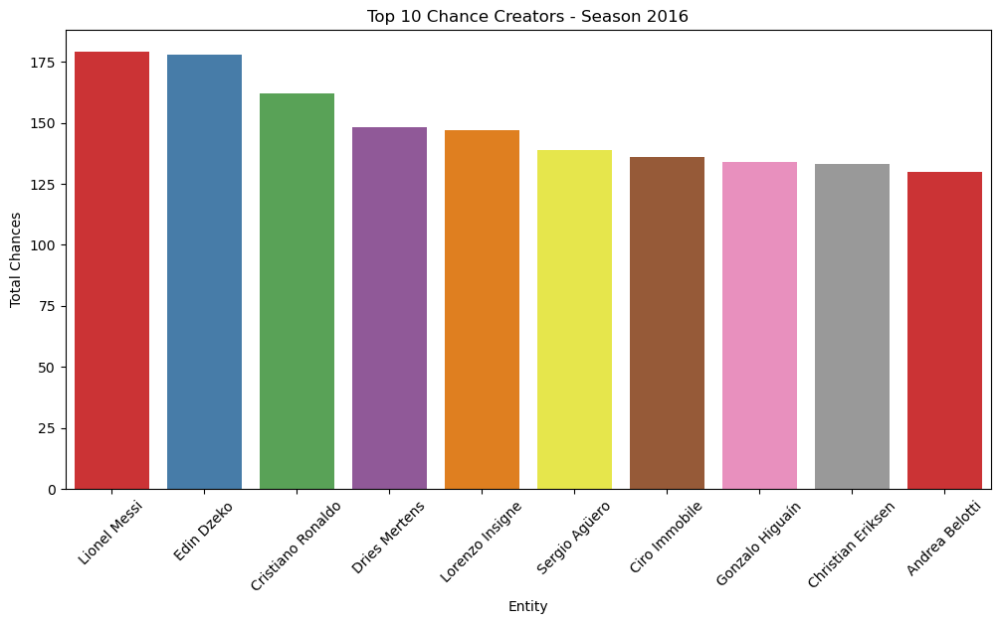

Top 10 Goal Scoring Percentage Data - Season 2016:
       season player_striker  total_goals  total_attempts  total_chances  \
4023    2016  Álvaro Morata           15              55             55   
3226    2016     Harry Kane           29             110            110   
3243    2016     Iago Aspas           19              78             78   
3490    2016    Luis Suárez           29             120            120   
3366    2016    Joshua King           16              67             67   
2895    2016   Carlos Bacca           13              56             56   
3400    2016          Keita           16              70             70   
3828    2016     Sadio Mané           13              57             57   
3807    2016  Romelu Lukaku           25             110            110   
3594    2016   Mauro Icardi           24             110            110   

      goal_scoring_percentage  
4023                 0.272727  
3226                 0.263636  
3243                 0.243

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




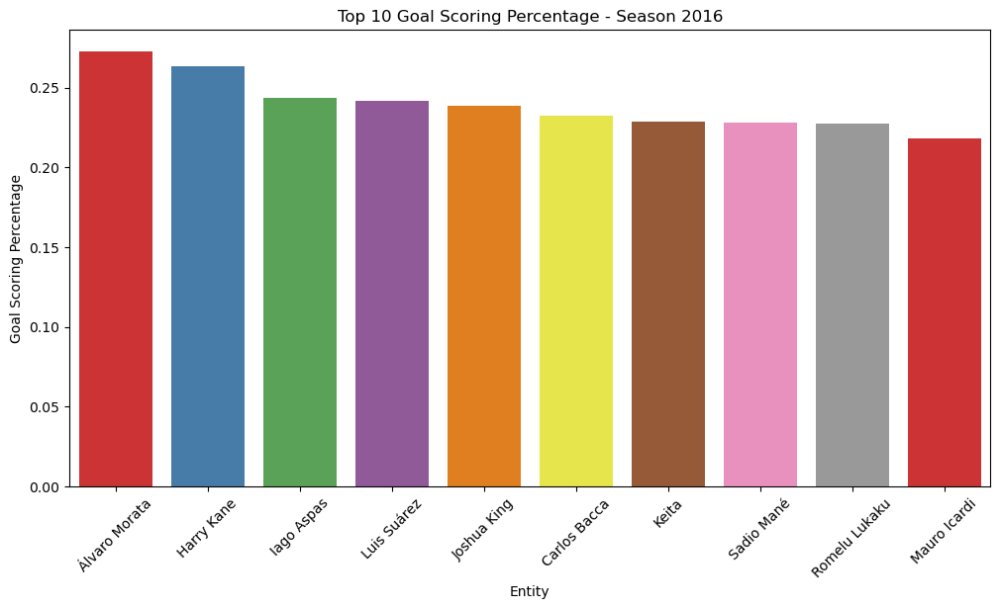

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2016:
       season   player_striker  total_goals  total_attempts  total_chances  \
3618    2016  Mikel Oyarzabal            2              57             57   
3036    2016    Dimitri Payet            2              55             55   
3050    2016      Dusan Tadic            3              63             63   
3520    2016  Marcello Trotta            3              58             58   
3589    2016    Matías Vecino            3              58             58   
2798    2016  Andros Townsend            3              56             56   
3367    2016     Josip Ilicic            5              92             92   
3727    2016       Paul Pogba            5              92             92   
3112    2016  Federico Chiesa            3              55             55   
3809    2016     Ross Barkley            5              89             89   

      goal_scoring_percentage  
3618                 0.035088  
3036                 0.036364  
3

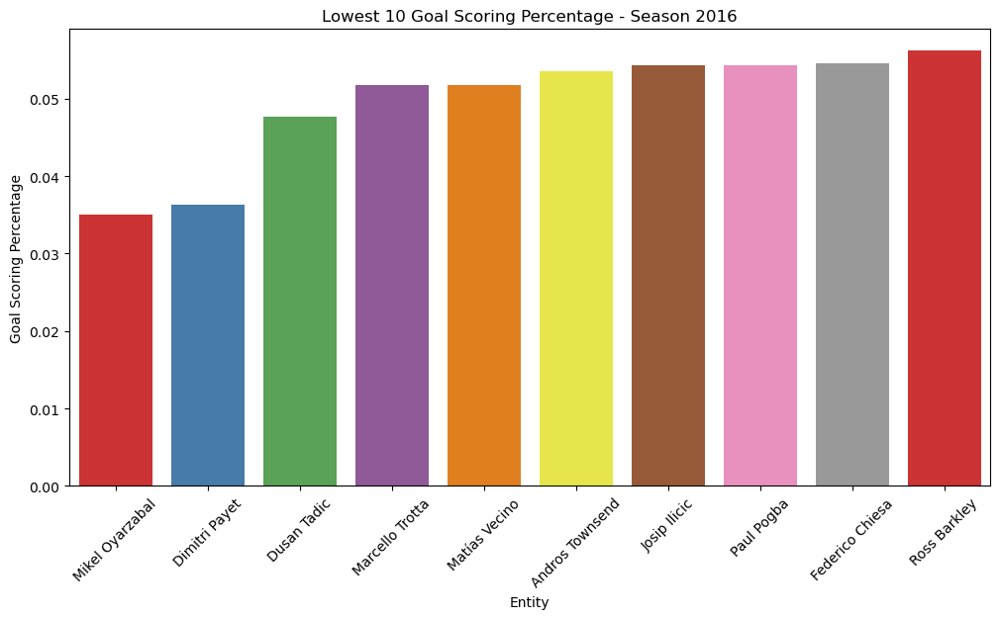

Season 2017


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




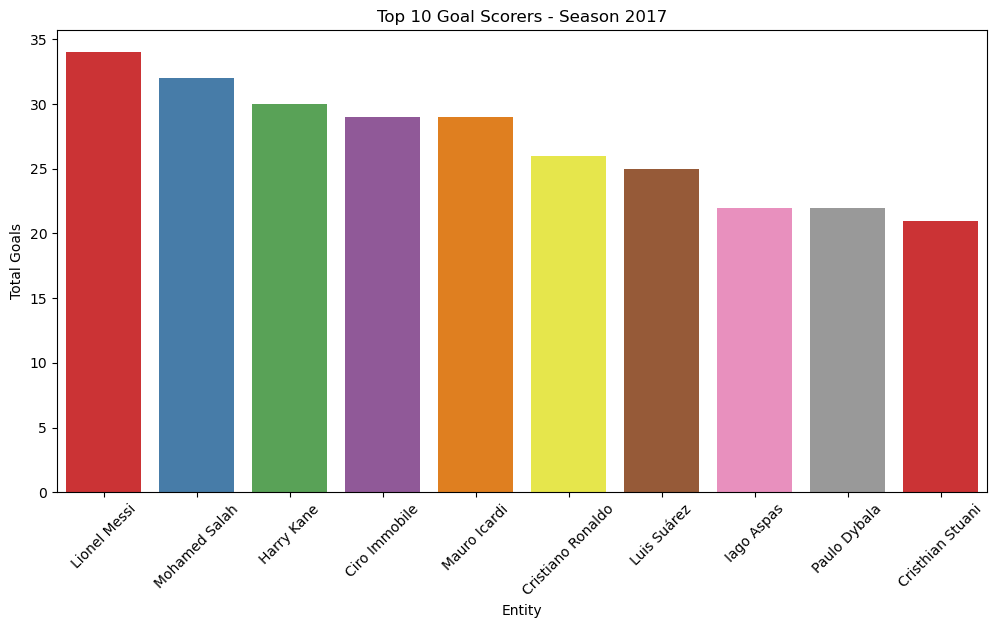

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




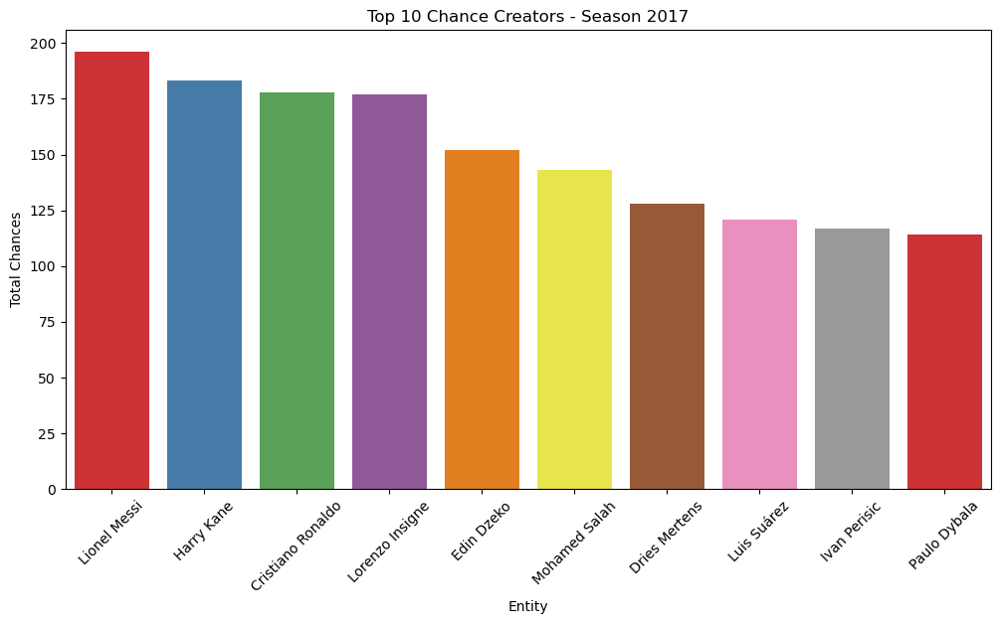

Top 10 Goal Scoring Percentage Data - Season 2017:
       season     player_striker  total_goals  total_attempts  total_chances  \
4914    2017       Mauro Icardi           29              98             98   
4285    2017   Cristhian Stuani           21              73             73   
4631    2017        Jamie Vardy           20              70             70   
4154    2017  Antoine Griezmann           19              72             72   
4274    2017      Ciro Immobile           29             110            110   
4497    2017      Gabriel Jesus           13              55             55   
4580    2017         Iago Aspas           22              94             94   
4951    2017      Mohamed Salah           32             143            143   
5192    2017      Sergio Agüero           21              95             95   
4505    2017        Gareth Bale           16              76             76   

      goal_scoring_percentage  
4914                 0.295918  
4285          

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




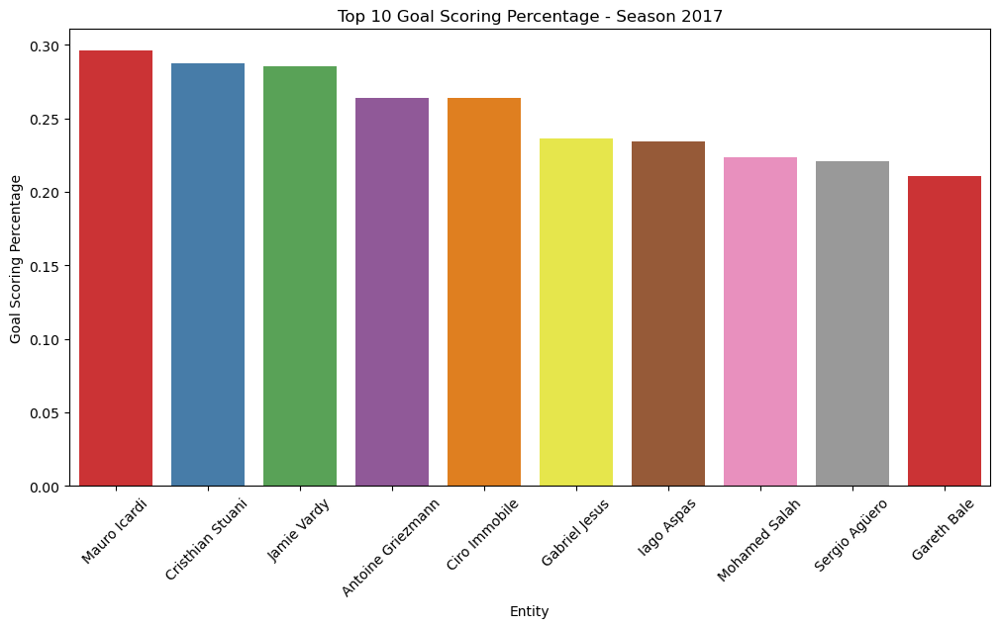

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2017:
       season      player_striker  total_goals  total_attempts  total_chances  \
4159    2017    Antonio Candreva            0              72             72   
4550    2017        Granit Xhaka            1              66             66   
5269    2017            Tom Ince            2              70             70   
4082    2017  Aleksandar Kolarov            2              63             63   
4140    2017     Andros Townsend            2              62             62   
4366    2017    Diego Falcinelli            2              56             56   
4788    2017     Lorenzo Insigne            8             177            177   
4378    2017    Domenico Berardi            4              86             86   
4266    2017   Christian Benteke            3              59             59   
4053    2017       Adnan Januzaj            3              58             58   

      goal_scoring_percentage  
4159                 0.000000  


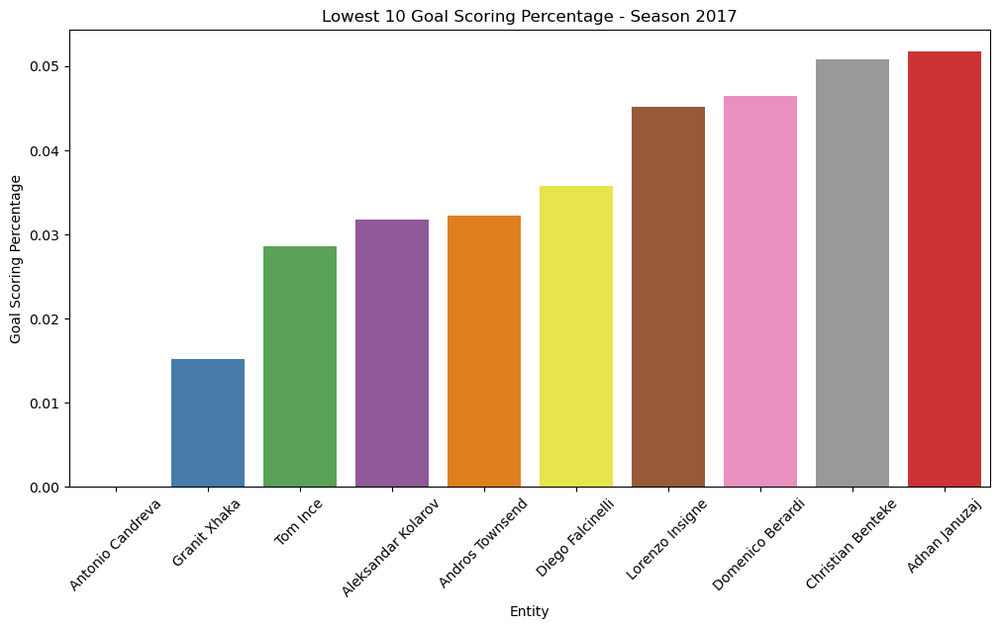

Season 2018


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




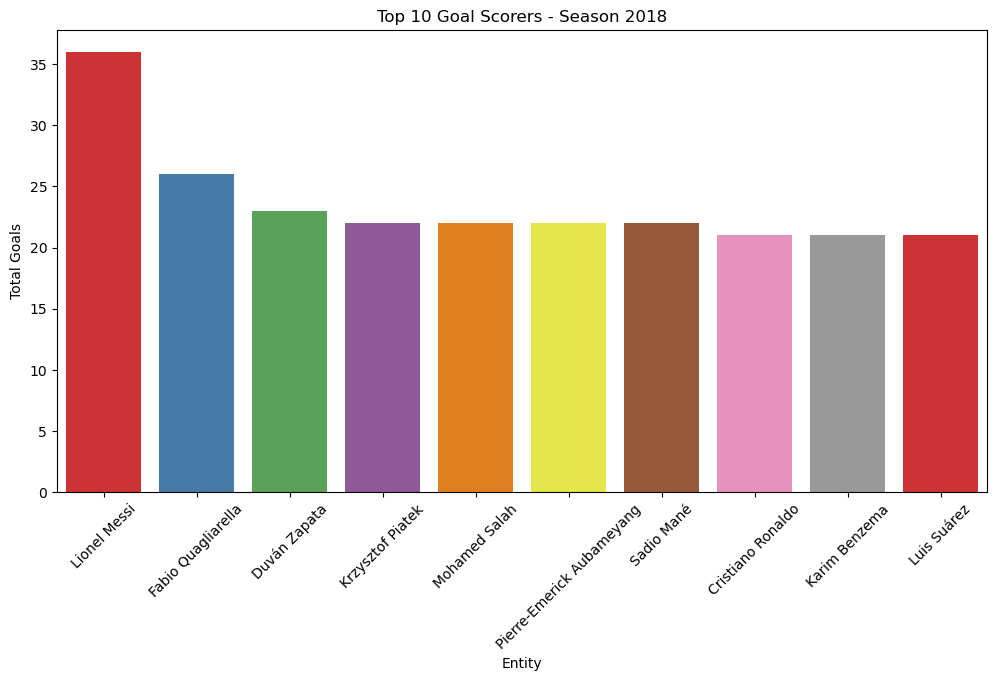

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




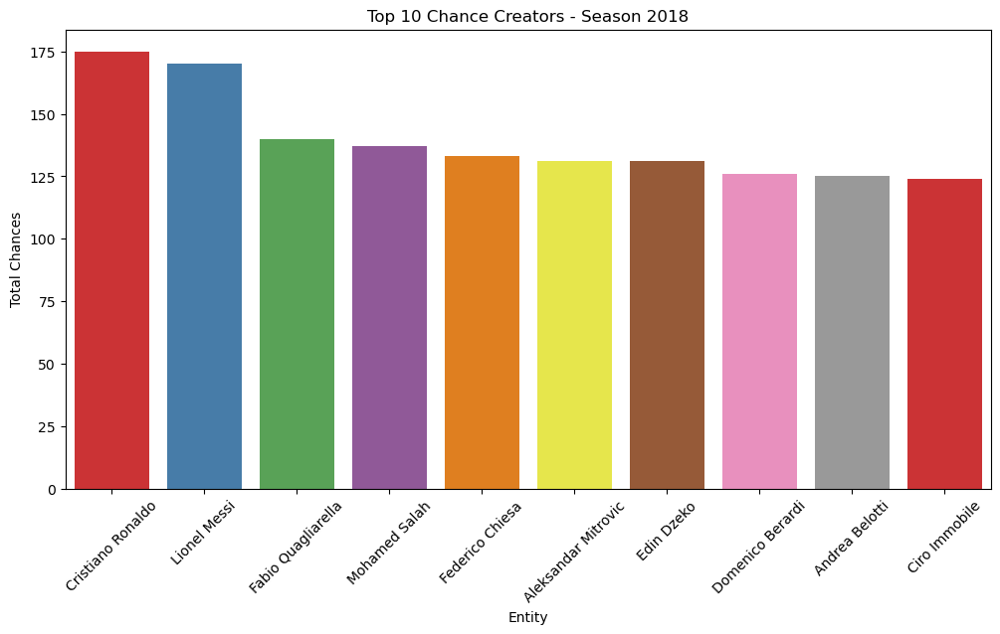

Top 10 Goal Scoring Percentage Data - Season 2018:
       season             player_striker  total_goals  total_attempts  \
5867    2018                 Iago Aspas           20              70   
6465    2018                 Sadio Mané           22              87   
5976    2018               Jorge Molina           14              57   
5581    2018           Cristhian Stuani           19              79   
5904    2018                 Jaime Mata           14              59   
6638    2018          Wissam Ben Yedder           18              76   
6373    2018  Pierre-Emerick Aubameyang           22              94   
5913    2018                Jamie Vardy           18              79   
5554    2018                    Charles           14              63   
5491    2018                Ayoze Pérez           12              55   

      total_chances  goal_scoring_percentage  
5867             70                 0.285714  
6465             87                 0.252874  
5976          

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




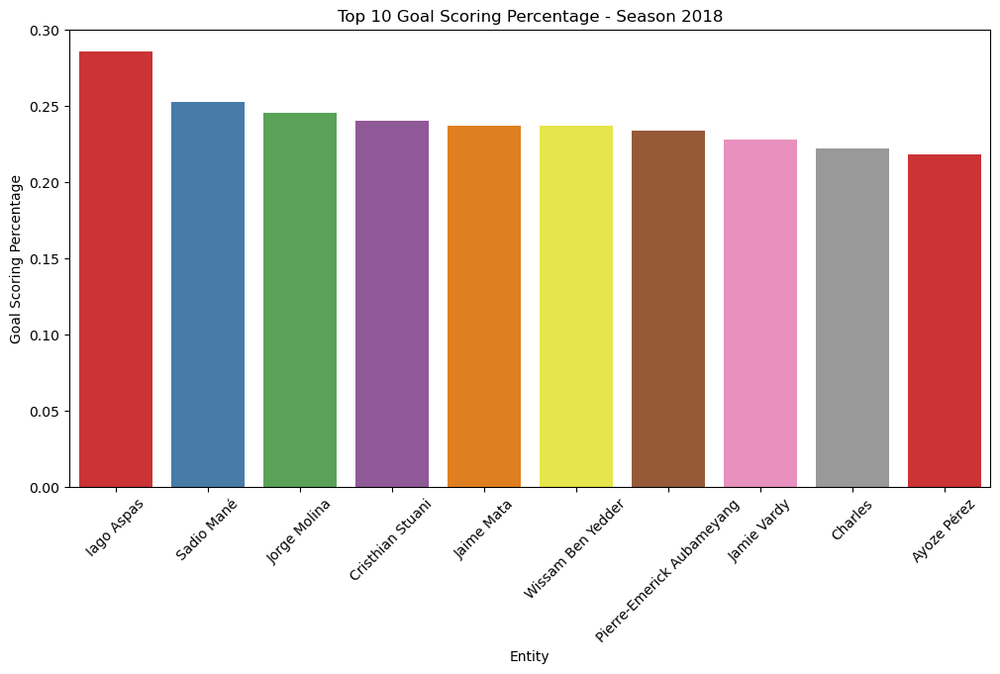

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2018:
       season    player_striker  total_goals  total_attempts  total_chances  \
5496    2018              Bebé            1              61             61   
5848    2018  Hakan Calhanoglu            3             102            102   
6559    2018      Steve Mounie            2              61             61   
6499    2018       Seko Fofana            2              59             59   
6328    2018     Pablo Fornals            2              57             57   
6629    2018     Wilfred Ndidi            2              55             55   
5744    2018   Fabián Orellana            3              78             78   
5714    2018       Enis Bardhi            3              66             66   
5571    2018  Christian Kouamé            4              87             87   
6635    2018           Willian            3              62             62   

      goal_scoring_percentage  
5496                 0.016393  
5848                 0

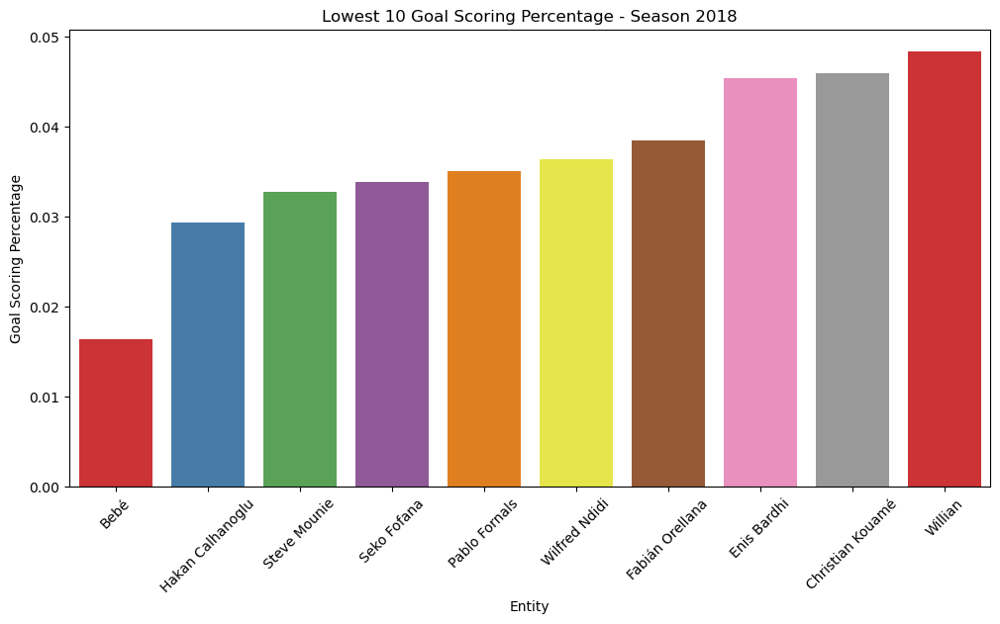

Season 2019


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




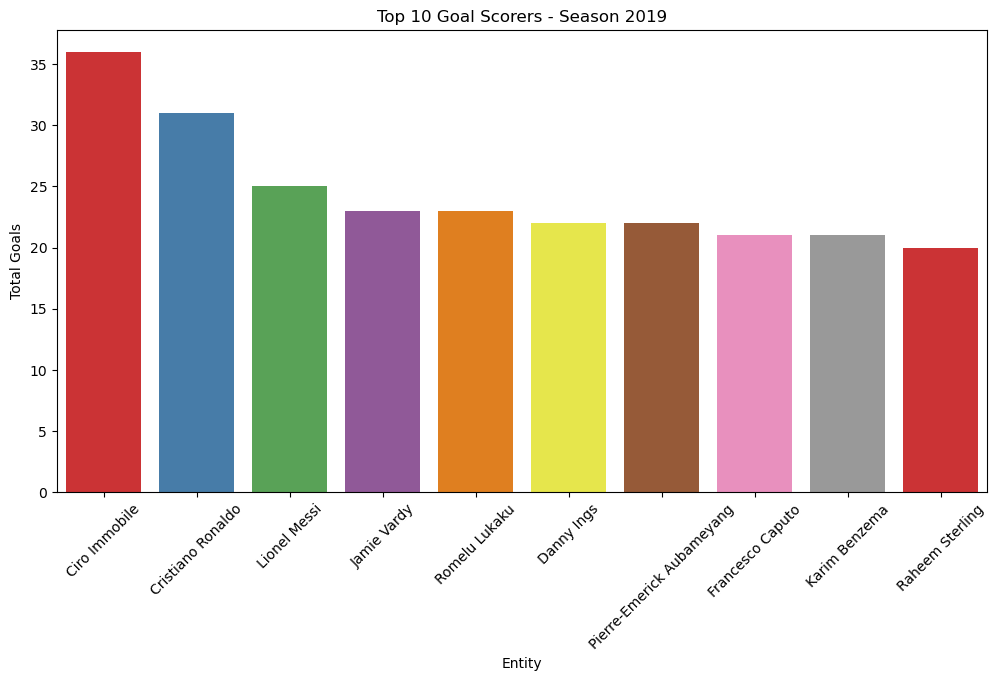

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




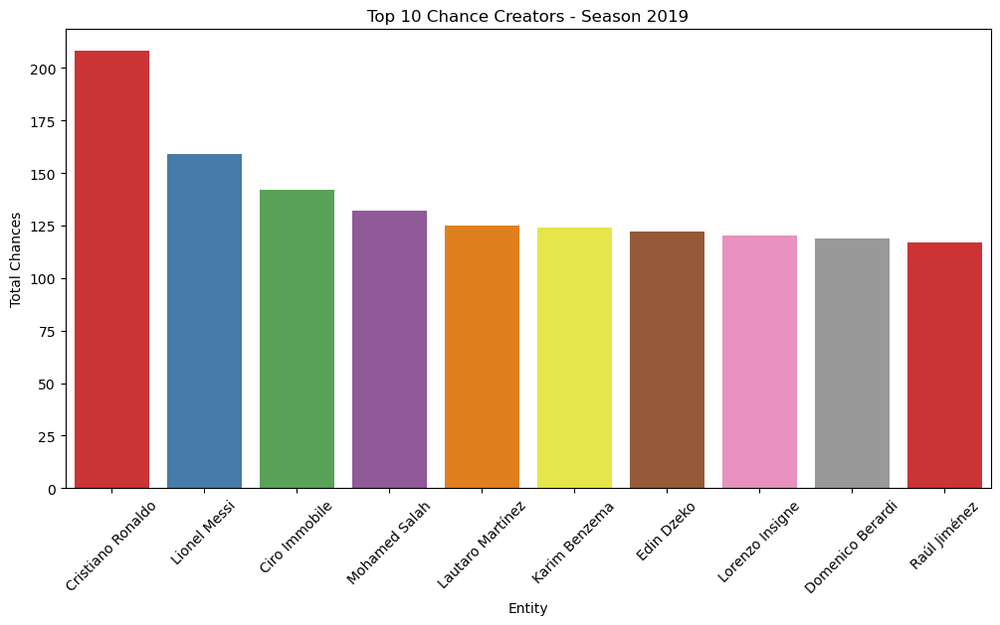

Top 10 Goal Scoring Percentage Data - Season 2019:
       season             player_striker  total_goals  total_attempts  \
7120    2019           Francesco Caputo           21              73   
7268    2019                Jamie Vardy           23              89   
6907    2019              Ciro Immobile           36             142   
6949    2019                 Danny Ings           22              93   
7718    2019  Pierre-Emerick Aubameyang           22              93   
7466    2019                Luis Muriel           18              77   
7818    2019                 Sadio Mané           18              77   
7794    2019              Romelu Lukaku           23              99   
6789    2019               Ante Budimir           13              56   
7199    2019                 Harry Kane           18              82   

      total_chances  goal_scoring_percentage  
7120             73                 0.287671  
7268             89                 0.258427  
6907          

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




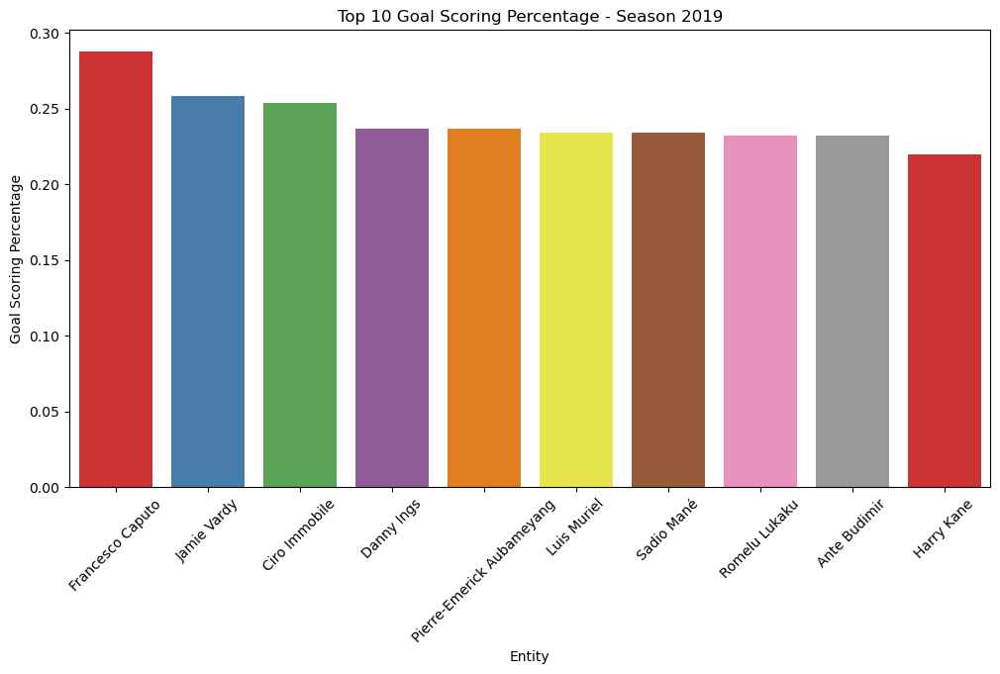

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2019:
       season      player_striker  total_goals  total_attempts  total_chances  \
7792    2019  Rolando Mandragora            0              55             55   
7721    2019     Piotr Zielinski            2              78             78   
7815    2019         Rúben Neves            2              61             61   
7441    2019  Lorenzo Pellegrini            2              58             58   
7072    2019              Fabián            3              71             71   
7649    2019      Nicola Sansone            4              80             80   
8001    2019     Youri Tielemans            3              56             56   
7316    2019         John McGinn            3              55             55   
7500    2019    Marcelo Brozovic            3              55             55   
7275    2019       Jasmin Kurtic            4              70             70   

      goal_scoring_percentage  
7792                 0.000000  


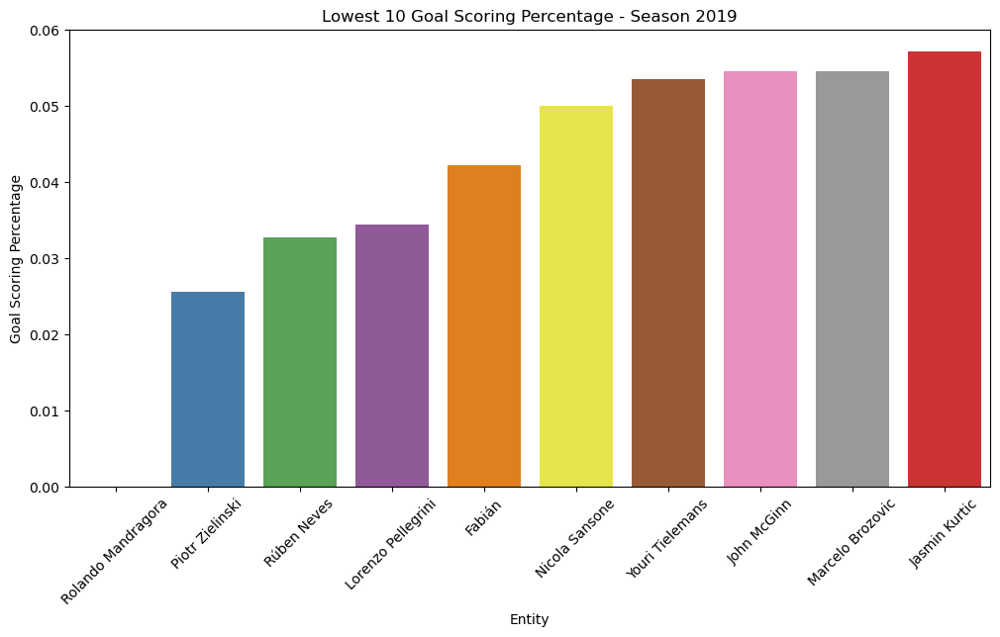

Season 2020


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




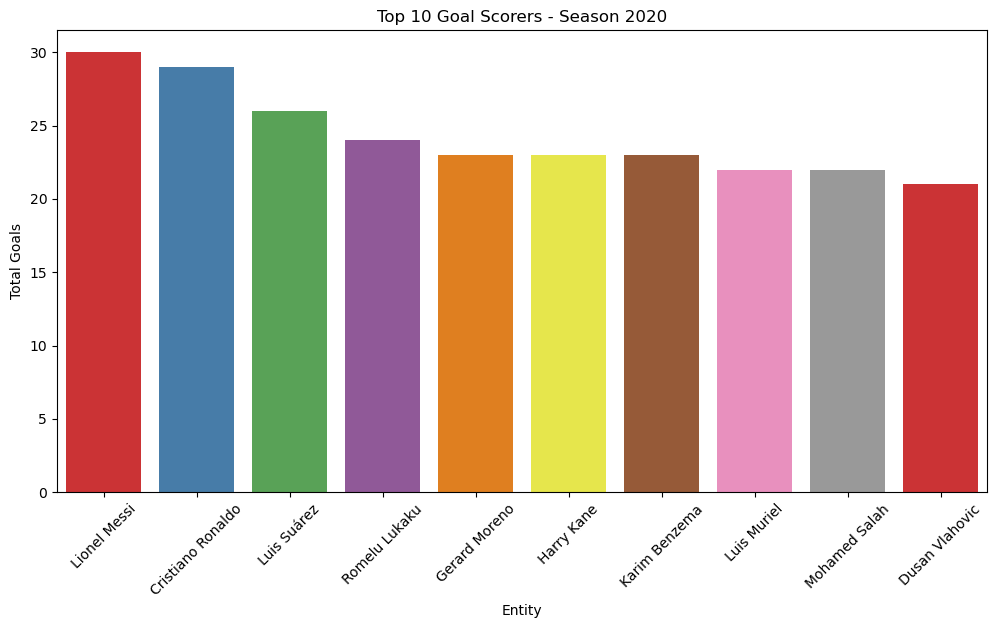

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




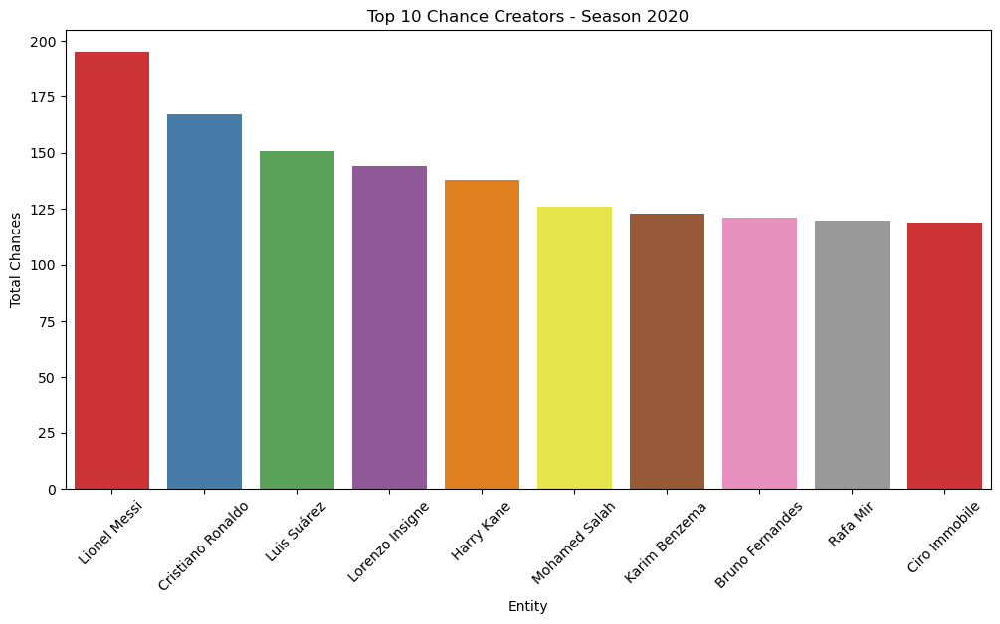

Top 10 Goal Scoring Percentage Data - Season 2020:
       season     player_striker  total_goals  total_attempts  total_chances  \
9239    2020               Simy           20              64             64   
8807    2020        Luis Muriel           22              86             86   
9244    2020      Son Heung-Min           17              68             68   
9159    2020      Romelu Lukaku           24              97             97   
8344    2020     Dusan Vlahovic           21              86             86   
8958    2020            Morales           14              58             58   
8471    2020      Gerard Moreno           23              98             98   
9358    2020  Youssef En-Nesyri           18              77             77   
8694    2020         João Pedro           16              75             75   
8289    2020         Danny Ings           12              57             57   

      goal_scoring_percentage  
9239                 0.312500  
8807          

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




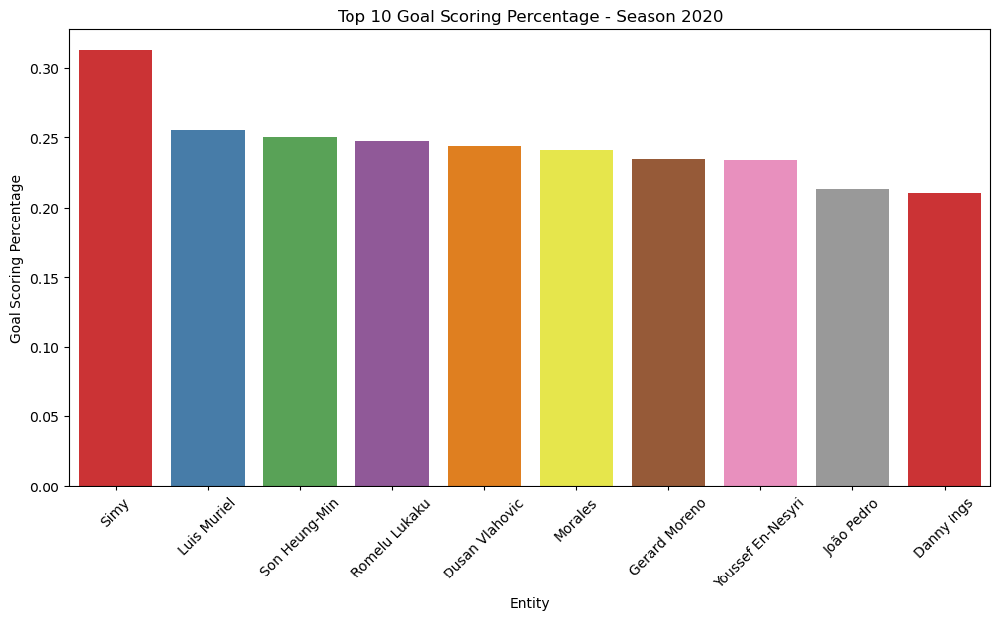

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2020:
       season          player_striker  total_goals  total_attempts  \
9294    2020  Trent Alexander-Arnold            2              55   
8508    2020        Hakan Calhanoglu            4              84   
8067    2020     Aleksandar Mitrovic            3              59   
8737    2020           Kevin Lasagna            4              72   
8039    2020         Ademola Lookman            4              69   
8973    2020             Nabil Fekir            5              86   
8798    2020           Lucas Ocampos            5              69   
8885    2020             Mason Mount            6              82   
8735    2020         Kevin De Bruyne            6              81   
9176    2020             Rúben Neves            5              67   

      total_chances  goal_scoring_percentage  
9294             55                 0.036364  
8508             84                 0.047619  
8067             59                 0.050847

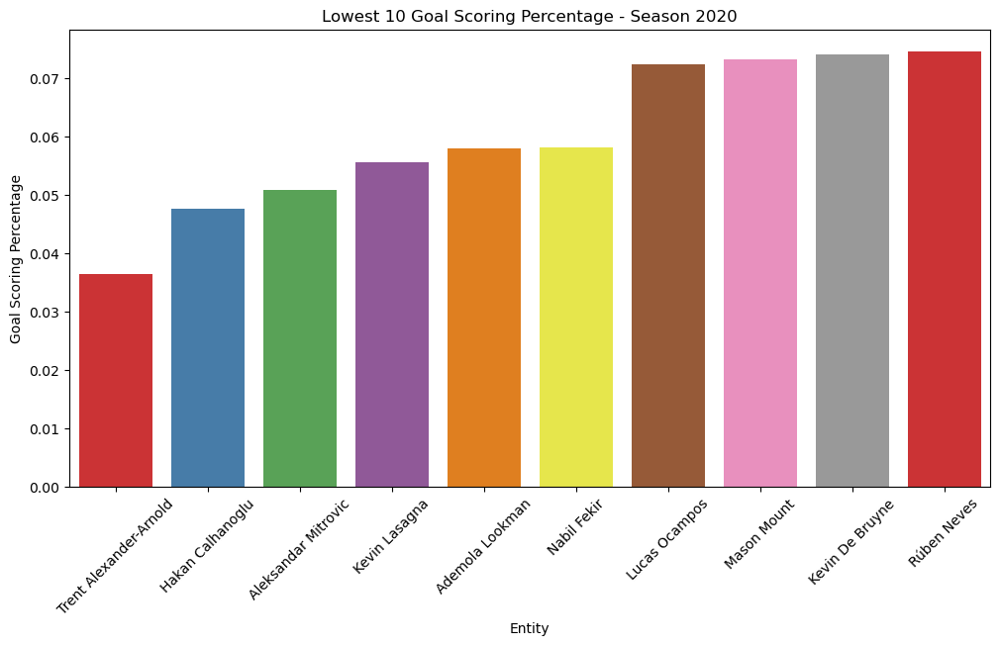

Season 2021


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




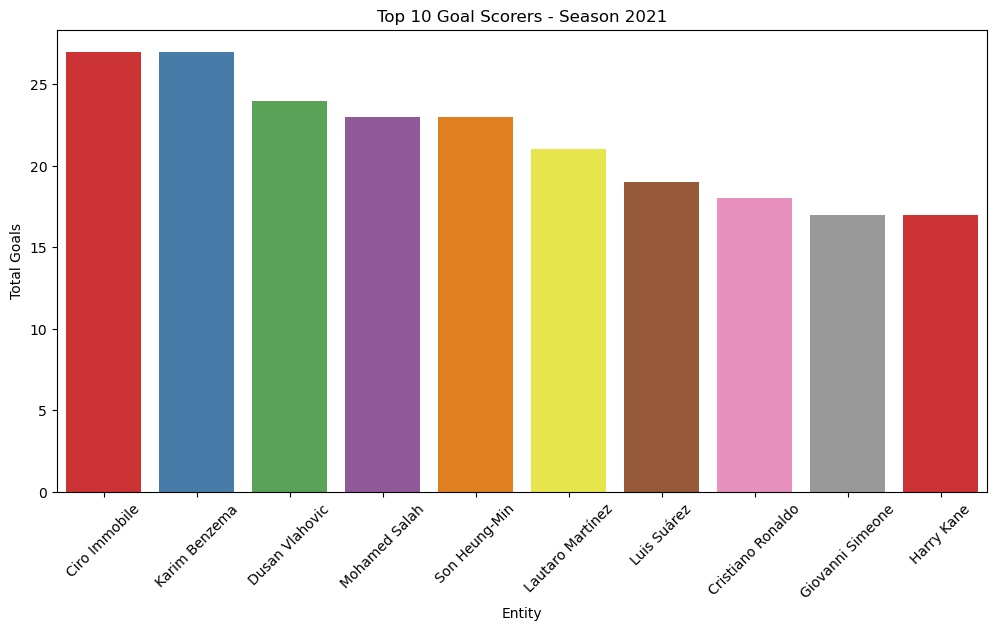

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




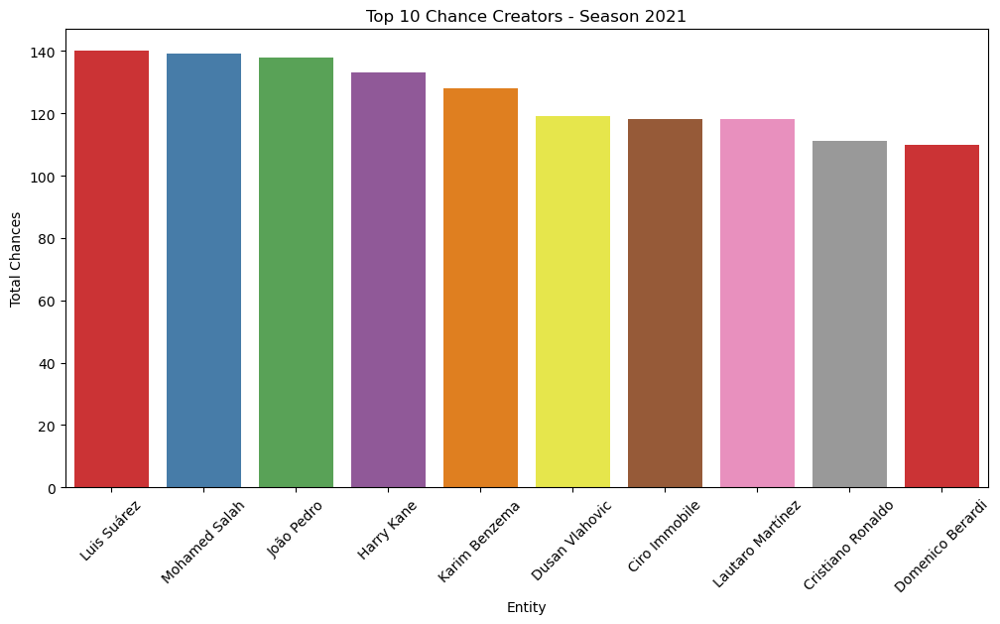

Top 10 Goal Scoring Percentage Data - Season 2021:
        season     player_striker  total_goals  total_attempts  total_chances  \
10079    2021             Juanmi           17              55             55   
9966     2021        Jamie Vardy           15              55             55   
10639    2021      Son Heung-Min           23              86             86   
9862     2021   Giovanni Simeone           17              70             70   
9596     2021      Ciro Immobile           27             118            118   
10492    2021    Raheem Sterling           13              58             58   
10730    2021    Vinícius Júnior           17              80             80   
10094    2021      Karim Benzema           27             128            128   
10747    2021      Wilfried Zaha           14              69             69   
9852     2021  Gianluca Scamacca           16              79             79   

       goal_scoring_percentage  
10079                 0.309091  
9

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




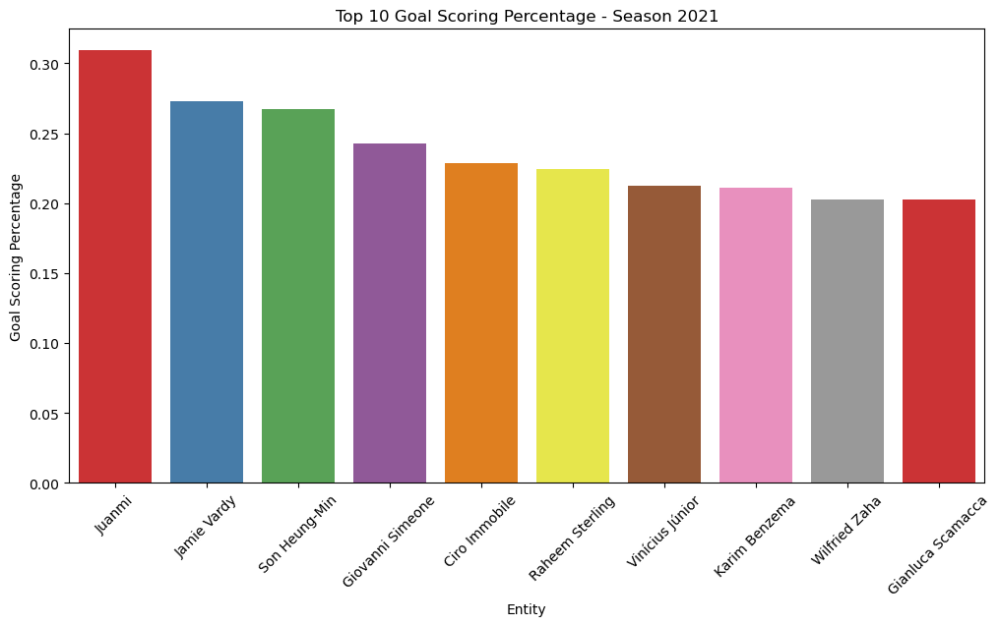

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2021:
        season      player_striker  total_goals  total_attempts  total_chances  \
10065    2021        João Cancelo            1              81             81   
10398    2021      Nicolo Zaniolo            2              70             70   
9922     2021         Isi Palazón            2              58             58   
10403    2021      Nicolò Barella            3              68             68   
9557     2021        Bryan Mbeumo            4              77             77   
9663     2021     Davide Frattesi            4              68             68   
9765     2021  Fabio Quagliarella            4              58             58   
9546     2021        Brais Méndez            4              56             56   
10365    2021         Nabil Fekir            6              84             84   
9670     2021        Demarai Gray            5              65             65   

       goal_scoring_percentage  
10065               

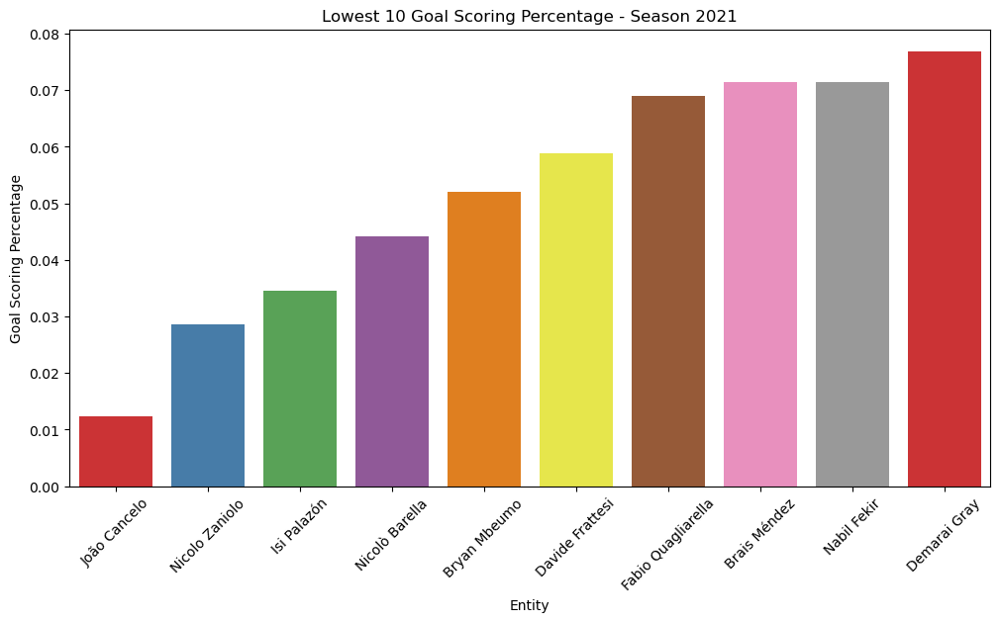

Season 2022


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




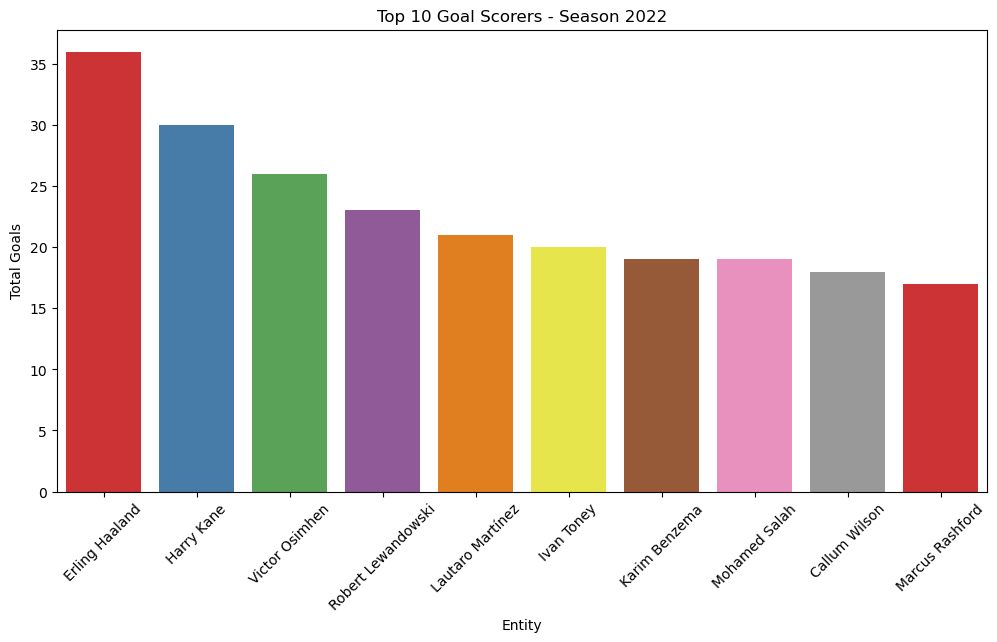

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




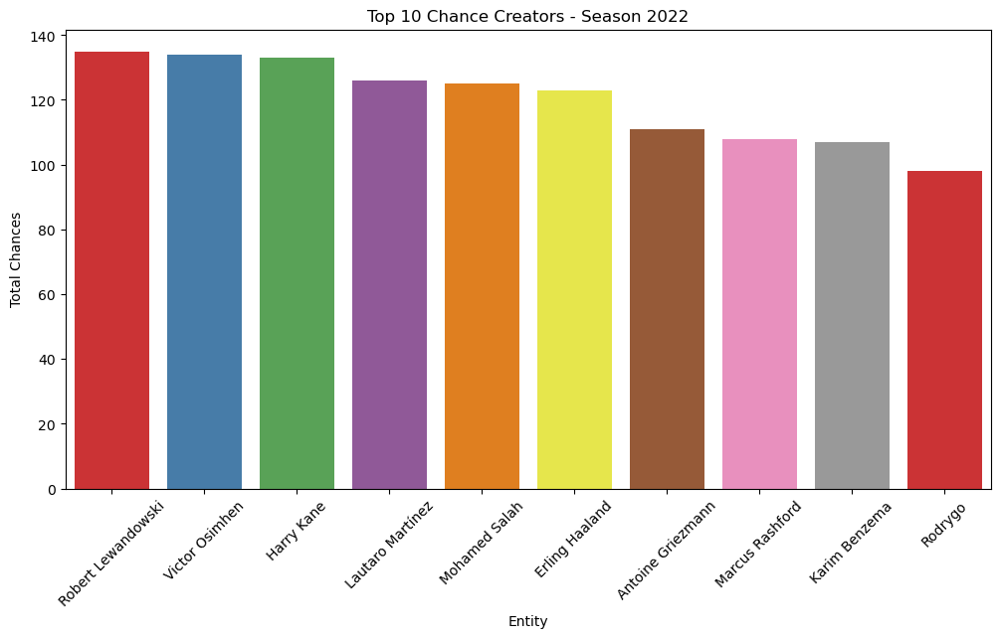

Top 10 Goal Scoring Percentage Data - Season 2022:
        season     player_striker  total_goals  total_attempts  total_chances  \
11176    2022     Erling Haaland           36             123            123   
10986    2022      Callum Wilson           18              73             73   
10960    2022     Borja Iglesias           15              63             63   
11303    2022         Harry Kane           30             133            133   
11349    2022         Ivan Toney           20              94             94   
11627    2022  M&#039;Bala Nzola           13              63             63   
12117    2022       Vedat Muriqi           15              75             75   
11939    2022            Rodrigo           13              67             67   
12121    2022     Victor Osimhen           26             134            134   
10865    2022  Alexander Sørloth           12              63             63   

       goal_scoring_percentage  
11176                 0.292683  
1

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




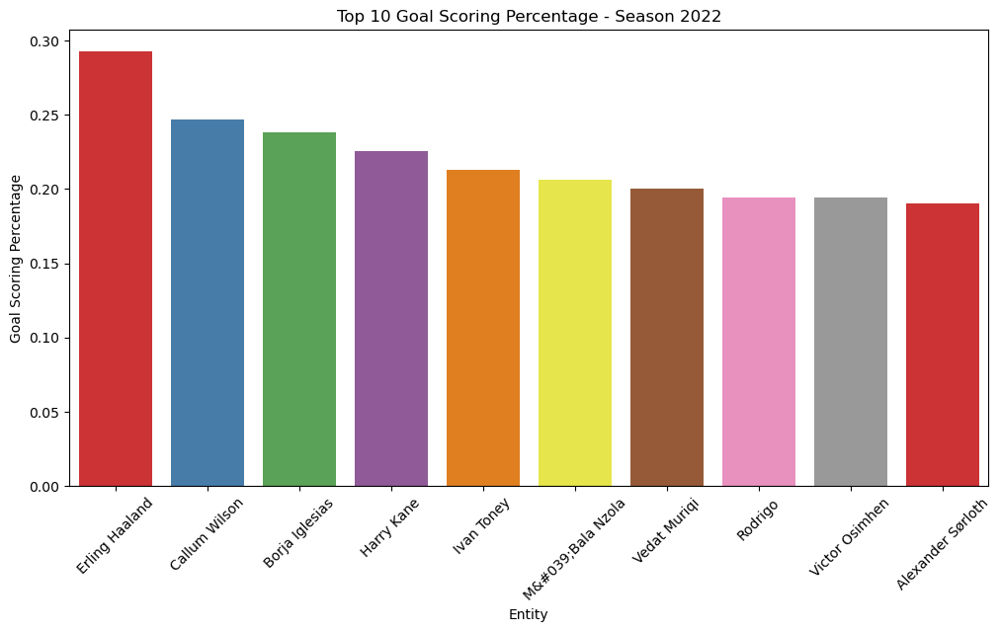

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2022:
        season      player_striker  total_goals  total_attempts  total_chances  \
11185    2022        Fabian Schär            1              57             57   
11764    2022         Musa Barrow            3              66             66   
11427    2022         Joe Willock            3              58             58   
11295    2022    Hakan Calhanoglu            3              56             56   
10914    2022              Antony            4              72             72   
11582    2022  Lorenzo Pellegrini            4              65             65   
11988    2022         Samuel Lino            6              96             96   
10889    2022     Andreas Pereira            4              62             62   
11093    2022        Demarai Gray            4              59             59   
11541    2022    Krzysztof Piatek            4              58             58   

       goal_scoring_percentage  
11185               

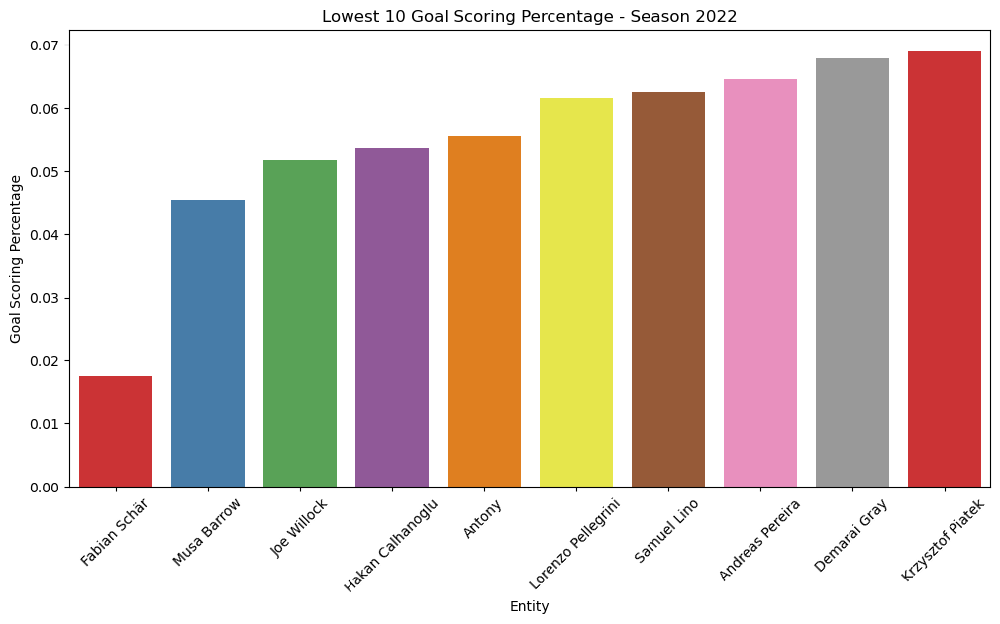

In [64]:
# Create a dictionary where each key is a season, and each value is the corresponding data for that season.
# The 'player_metrics_season' DataFrame is filtered for each unique season and stored in 'player_season_data'.
player_season_data = {season: player_metrics_season[player_metrics_season['season'] == season] for season in player_metrics_season['season'].unique()}
# 'attempts_threshold' is set to 55, meaning only players with at least 55 goal attempts will be included in the plots.
# 'entity' is set to 'player_striker', so the plots will display metrics based on individual player performance (e.g., total goals, chances created, goal-scoring percentage).
generate_seasonal_plots(player_season_data, attempts_threshold = 55, entity='player_striker' )

Season 2014


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




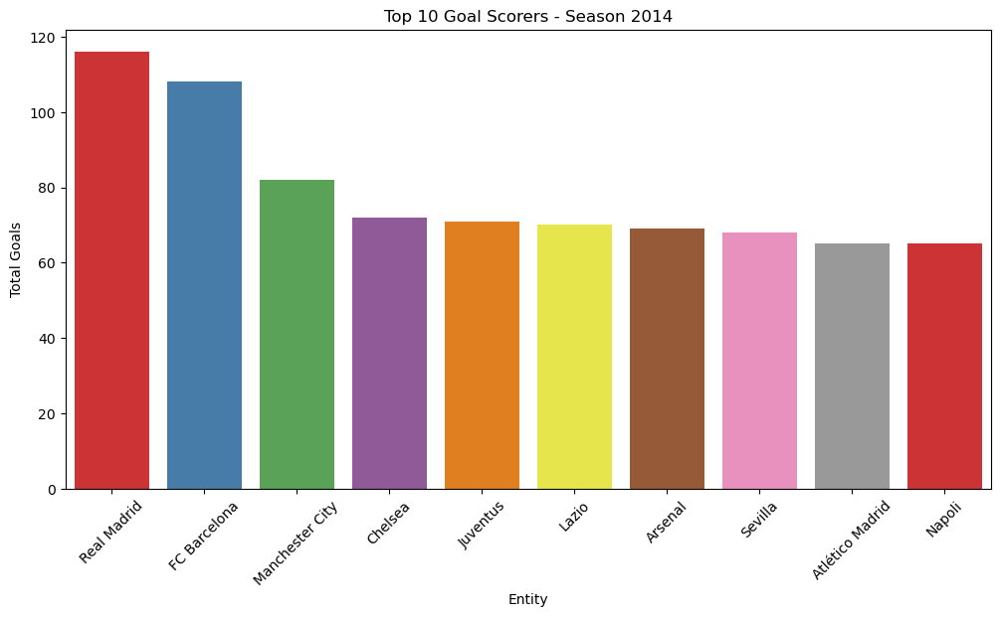

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




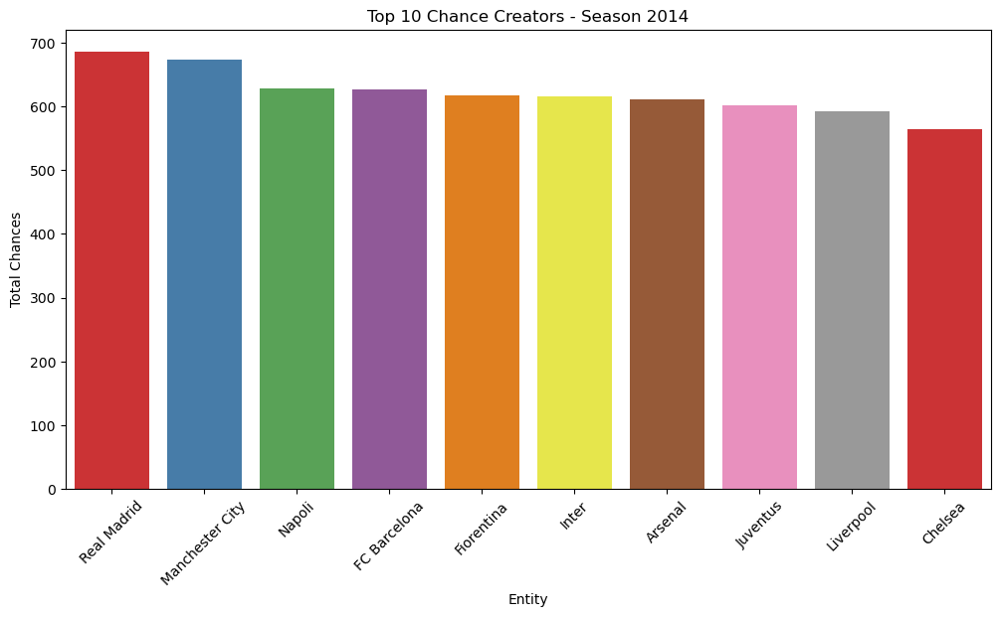

Top 10 Goal Scoring Percentage Data - Season 2014:
     season       playerTeam  total_goals  total_attempts  total_chances  \
19    2014     FC Barcelona          108             627            627   
42    2014      Real Madrid          116             686            686   
5     2014  Atlético Madrid           65             439            439   
56    2014         Valencia           65             442            442   
48    2014          Sevilla           68             464            464   
17    2014         Espanyol           47             368            368   
10    2014          Chelsea           72             565            565   
28    2014            Lazio           70             553            553   
32    2014  Manchester City           82             673            673   
34    2014            Milan           54             453            453   

    goal_scoring_percentage  
19                 0.172249  
42                 0.169096  
5                  0.148064  
56

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




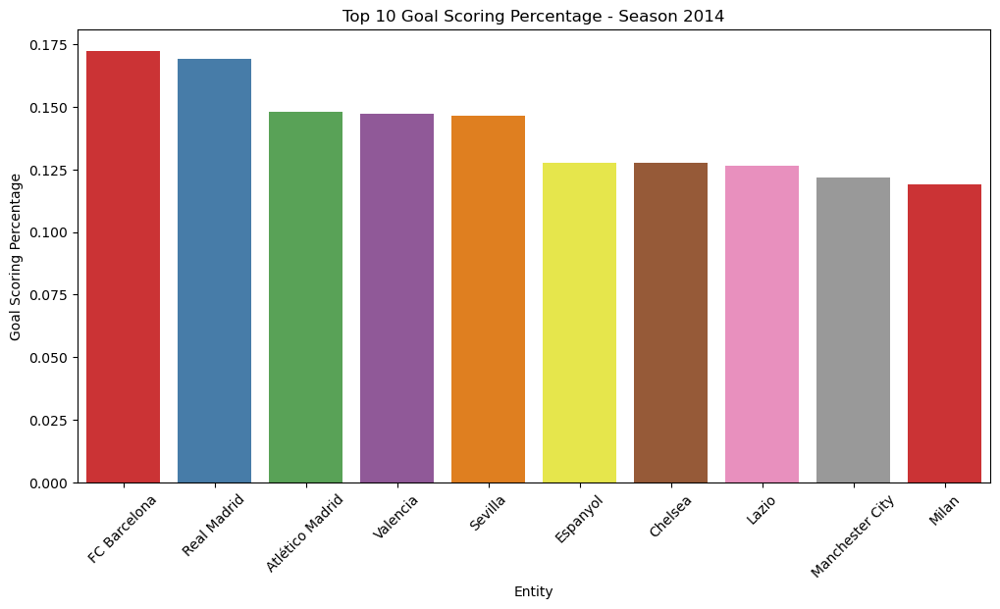

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2014:
     season           playerTeam  total_goals  total_attempts  total_chances  \
13    2014              Córdoba           21             392            392   
11    2014               Chievo           27             461            461   
6     2014              Burnley           27             432            432   
23    2014              Granada           29             403            403   
40    2014  Queens Park Rangers           39             539            539   
51    2014           Sunderland           30             413            413   
2     2014          Aston Villa           31             418            418   
39    2014                Parma           31             418            418   
25    2014            Hull City           32             429            429   
22    2014               Getafe           32             421            421   

    goal_scoring_percentage  
13                 0.053571  
11             

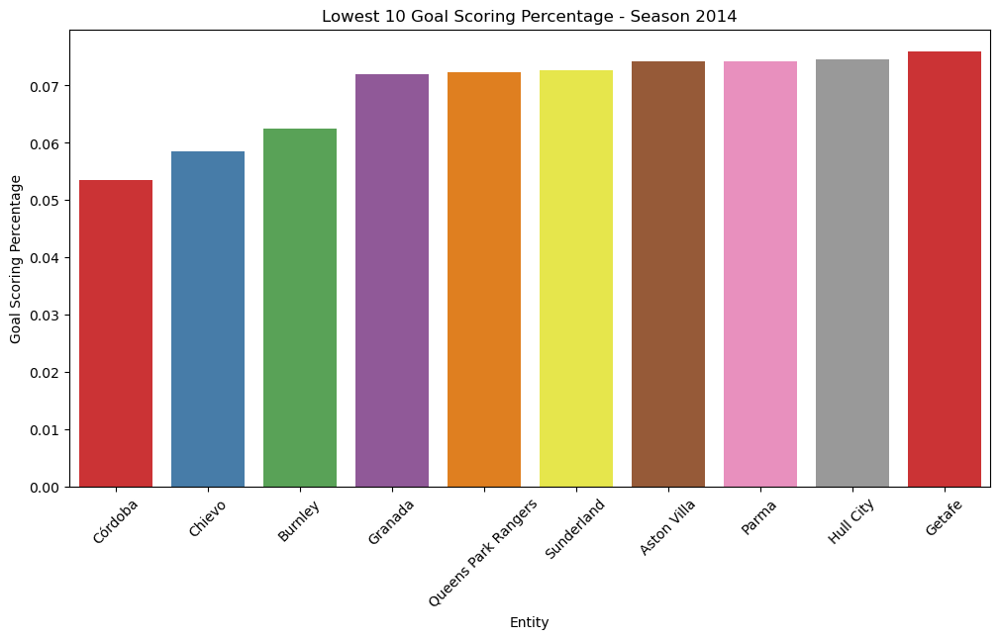

Season 2015


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




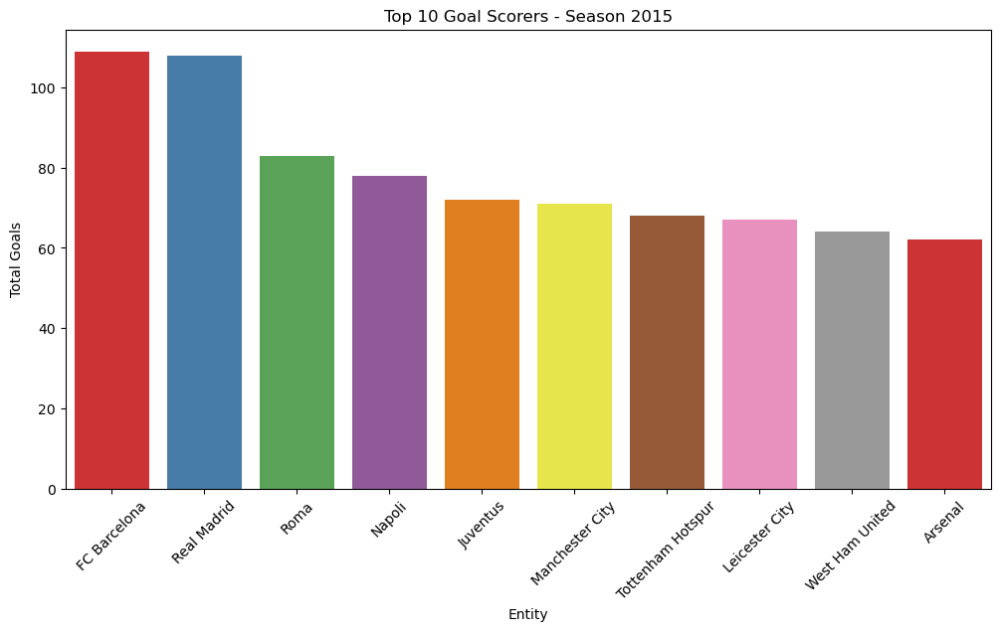

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




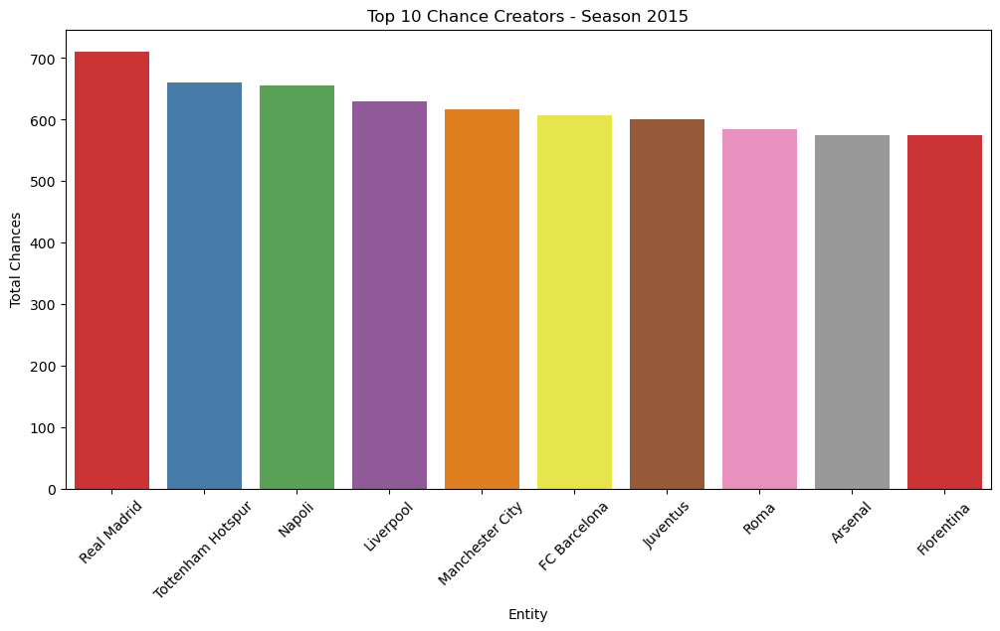

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Top 10 Goal Scoring Percentage Data - Season 2015:
      season       playerTeam  total_goals  total_attempts  total_chances  \
76     2015     FC Barcelona          109             607            607   
100    2015      Real Madrid          108             711            711   
102    2015             Roma           83             585            585   
65     2015  Atlético Madrid           62             476            476   
87     2015   Leicester City           67             522            522   
64     2015    Athletic Club           57             458            458   
116    2015       Villarreal           42             342            342   
84     2015         Juventus           72             600            600   
94     2015           Napoli           78             656            656   
90     2015  Manchester City           71             616            616   

     goal_scoring_percentage  
76                  0.179572  
100                 0.151899  
102               

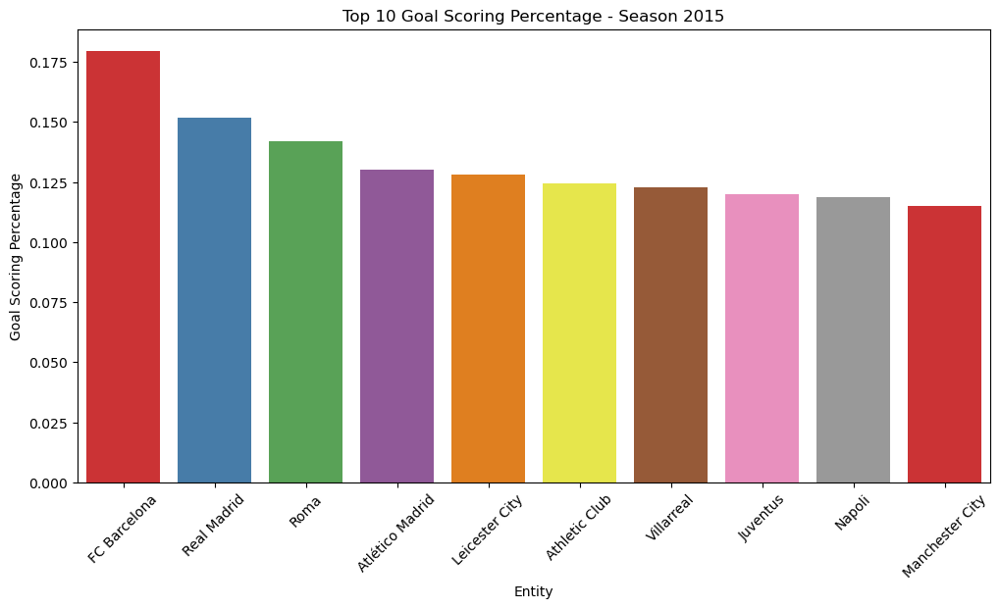

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2015:
      season            playerTeam  total_goals  total_attempts  total_chances  \
62     2015           Aston Villa           24             384            384   
78     2015             Frosinone           34             489            489   
82     2015         Hellas Verona           34             456            456   
114    2015               Udinese           34             445            445   
67     2015                 Carpi           33             430            430   
71     2015        Crystal Palace           38             473            473   
73     2015                Empoli           39             481            481   
93     2015                Málaga           37             455            455   
118    2015  West Bromwich Albion           32             392            392   
80     2015                Getafe           36             438            438   

     goal_scoring_percentage  
62                  0.

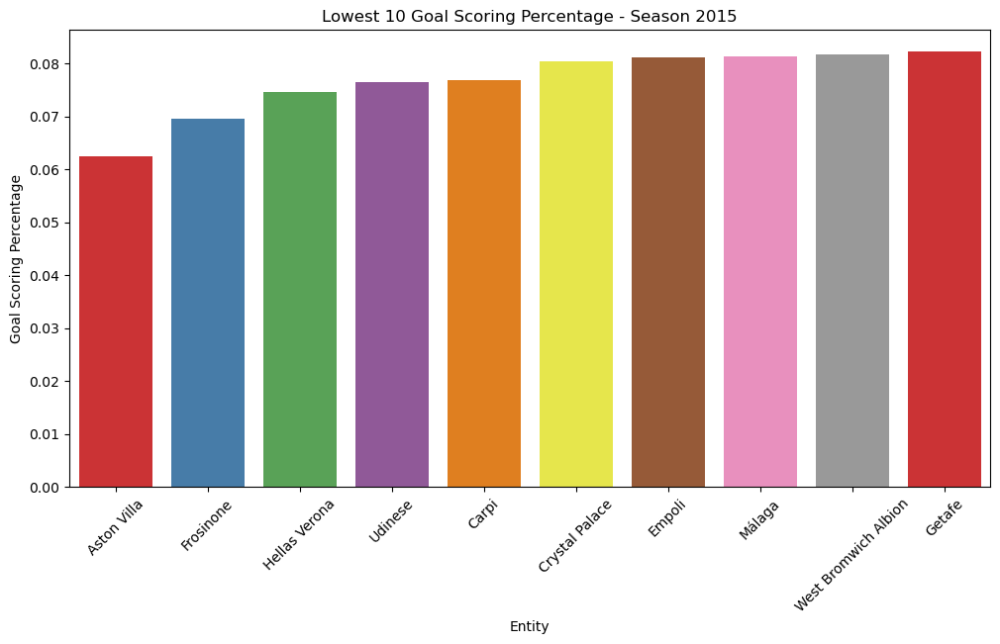

Season 2016


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




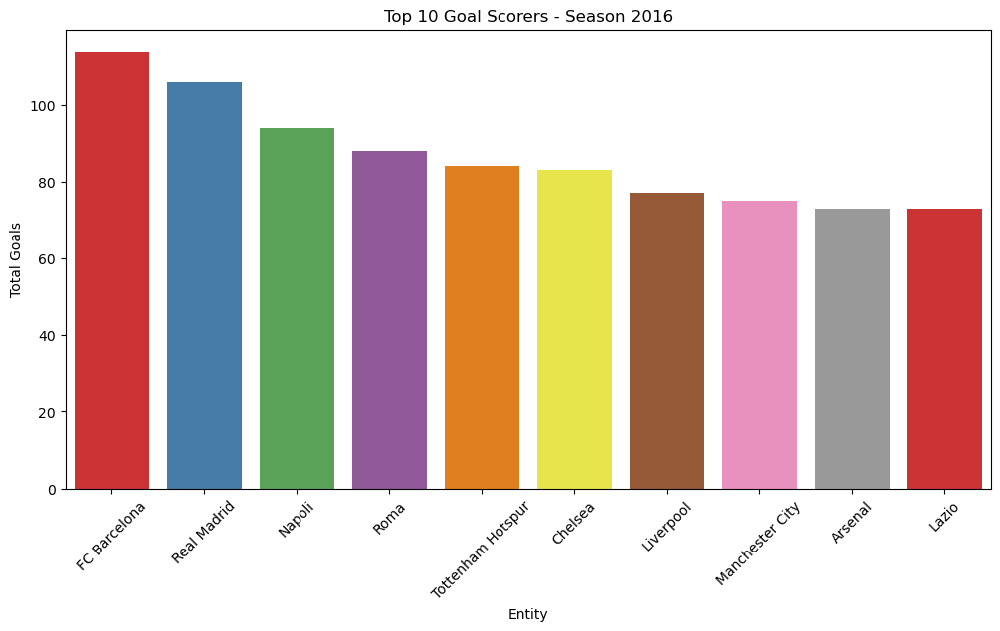

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




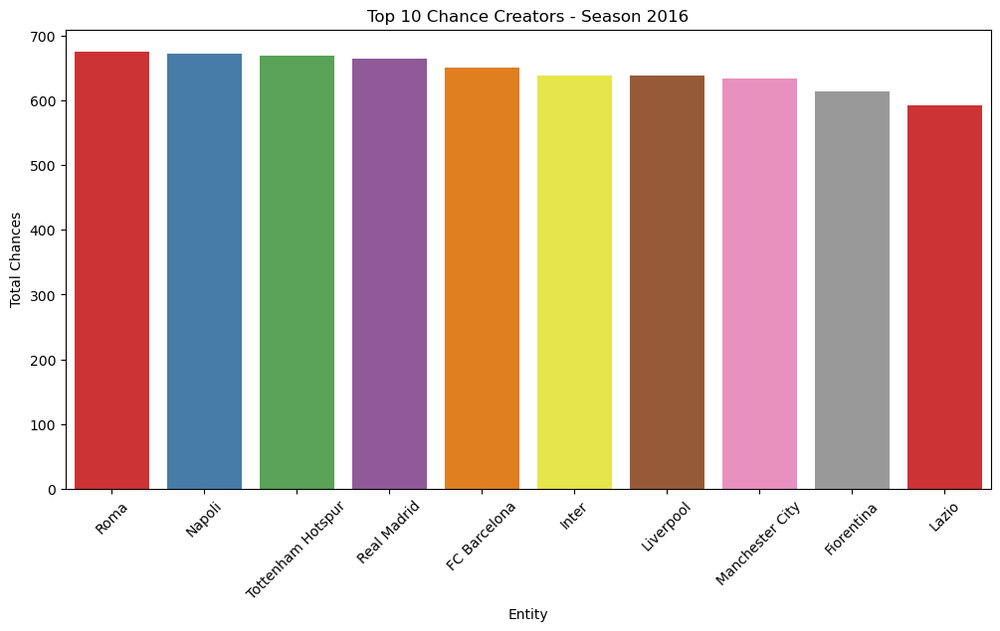

Top 10 Goal Scoring Percentage Data - Season 2016:
      season       playerTeam  total_goals  total_attempts  total_chances  \
138    2016     FC Barcelona          114             651            651   
160    2016      Real Madrid          106             664            664   
129    2016          Chelsea           83             581            581   
155    2016           Napoli           94             673            673   
136    2016         Espanyol           48             344            344   
124    2016  Atlético Madrid           70             504            504   
166    2016          Sevilla           67             488            488   
165    2016         Sassuolo           59             444            444   
162    2016             Roma           88             676            676   
121    2016          Arsenal           73             567            567   

     goal_scoring_percentage  
138                 0.175115  
160                 0.159639  
129               

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




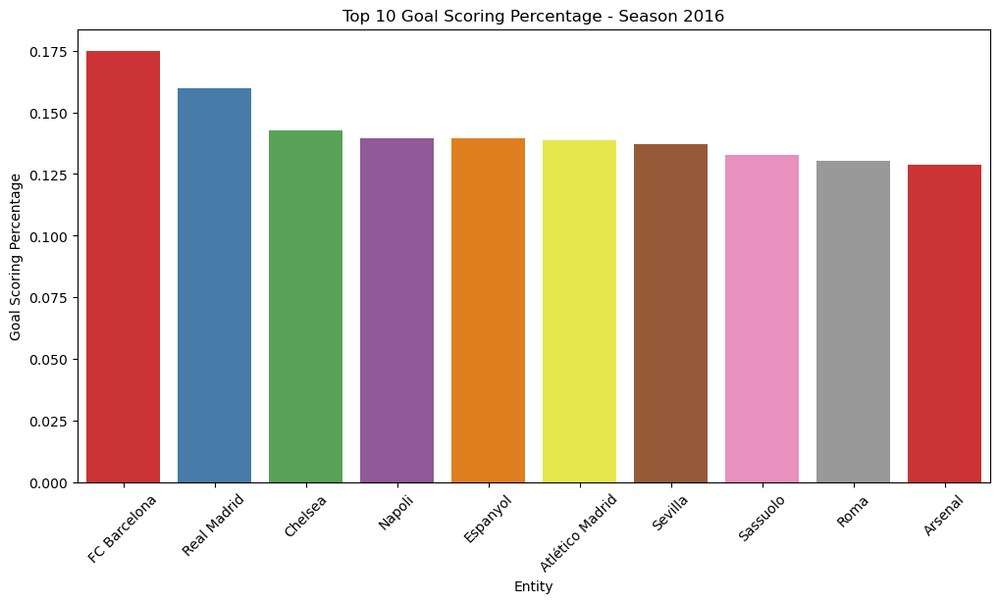

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2016:
      season     playerTeam  total_goals  total_attempts  total_chances  \
167    2016    Southampton           39             550            550   
170    2016     Sunderland           28             389            389   
158    2016        Pescara           32             444            444   
152    2016  Middlesbrough           26             350            350   
141    2016        Granada           30             384            384   
135    2016         Empoli           29             367            367   
140    2016          Genoa           36             451            451   
131    2016        Crotone           34             405            405   
157    2016        Palermo           33             385            385   
169    2016     Stoke City           37             430            430   

     goal_scoring_percentage  
167                 0.070909  
170                 0.071979  
158                 0.072072  
152   

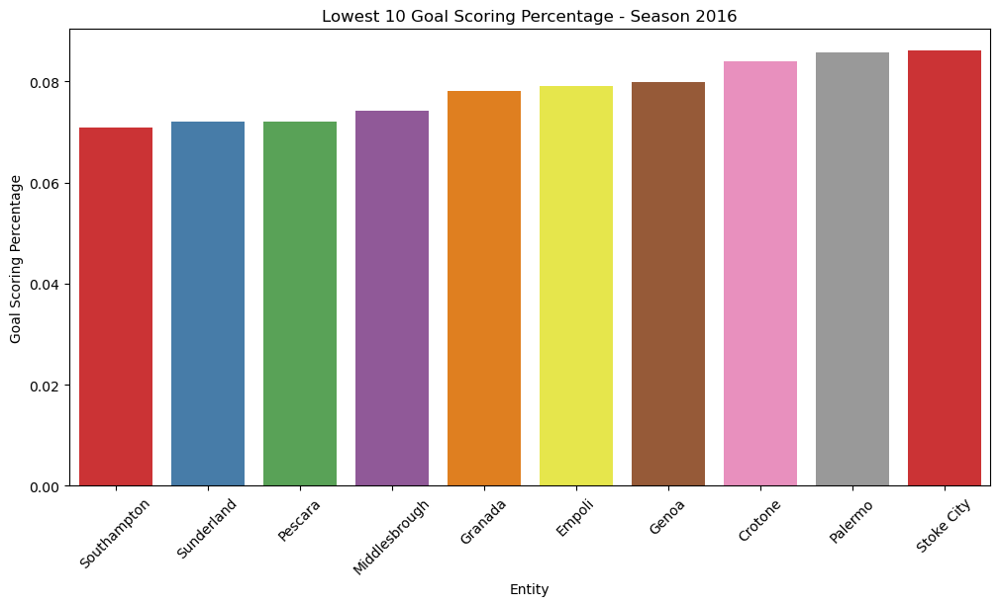

Season 2017


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




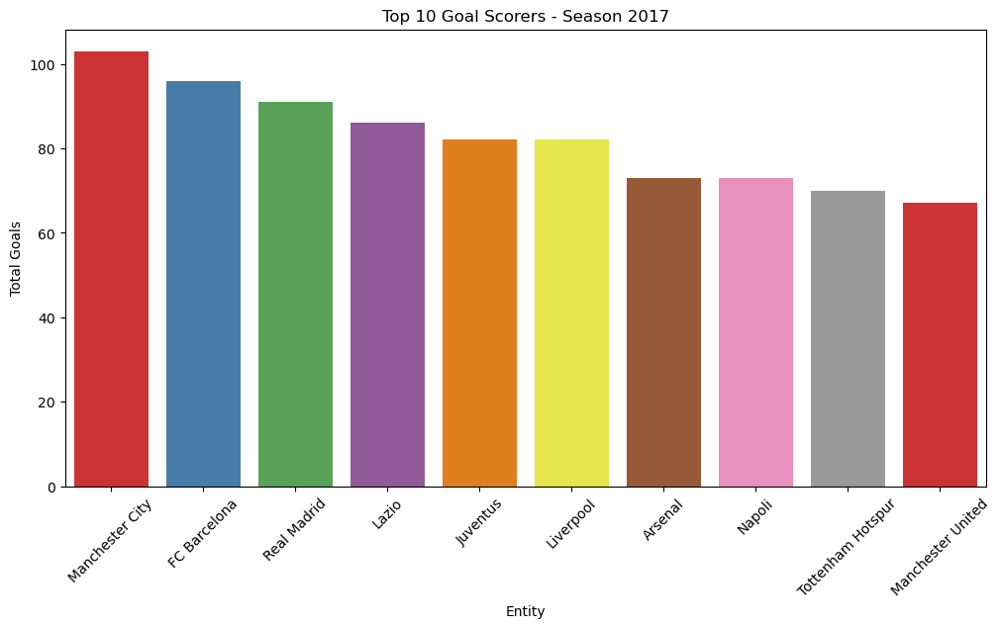

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




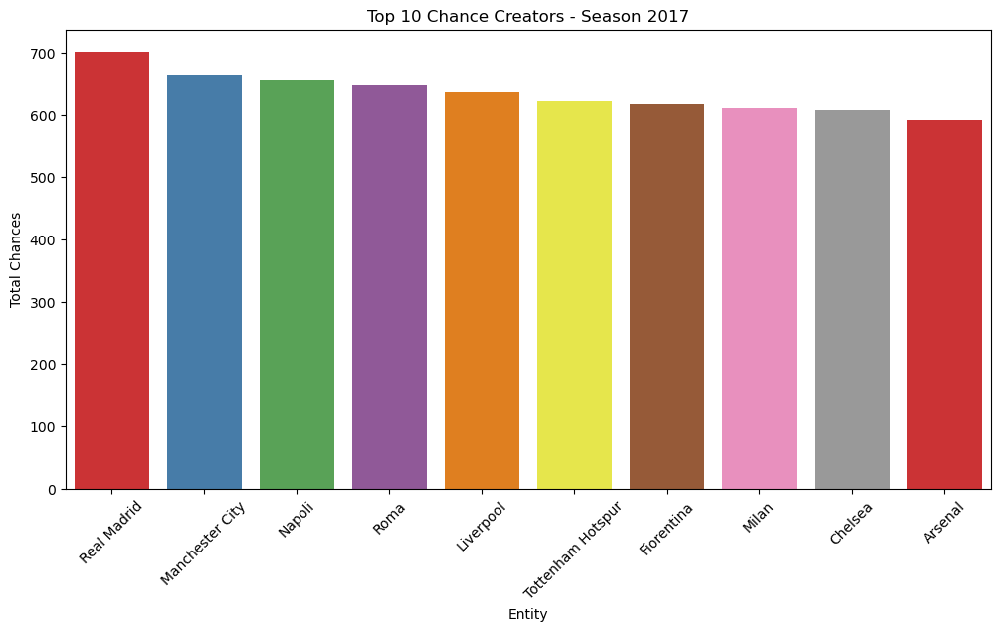

Top 10 Goal Scoring Percentage Data - Season 2017:
      season         playerTeam  total_goals  total_attempts  total_chances  \
199    2017       FC Barcelona           96             580            580   
209    2017              Lazio           86             552            552   
214    2017    Manchester City          103             665            665   
207    2017           Juventus           82             557            557   
184    2017    Atlético Madrid           57             404            404   
220    2017         Real Betis           56             419            419   
235    2017           Valencia           63             479            479   
215    2017  Manchester United           67             514            514   
221    2017        Real Madrid           91             702            702   
213    2017          Liverpool           82             636            636   

     goal_scoring_percentage  
199                 0.165517  
209                 0.15579

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




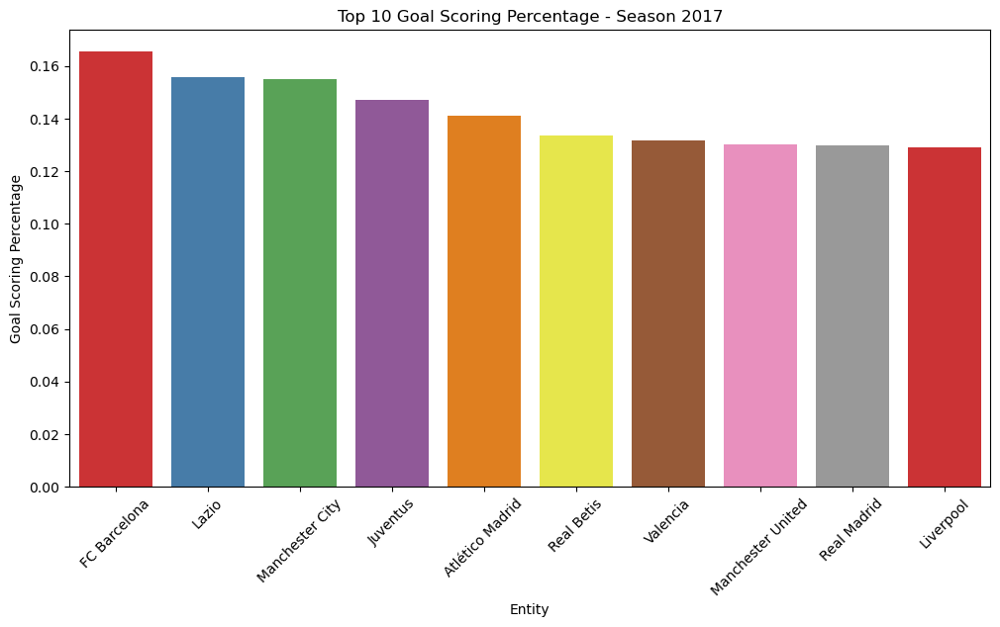

Lowest 10 Goal Scoring Percentage Data - Season 2017:
      season           playerTeam  total_goals  total_attempts  total_chances  \
227    2017             Sassuolo           28             498            498   
217    2017               Málaga           23             400            400   
208    2017           Las Palmas           24             413            413   
185    2017            Benevento           32             470            470   
205    2017    Huddersfield Town           25             361            361   
201    2017                Genoa           31             417            417   
196    2017  Deportivo La Coruña           37             467            467   
229    2017          Southampton           36             448            448   
231    2017         Swansea City           27             335            335   
210    2017              Leganés           32             395            395   

     goal_scoring_percentage  
227                 0.056225  
21

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




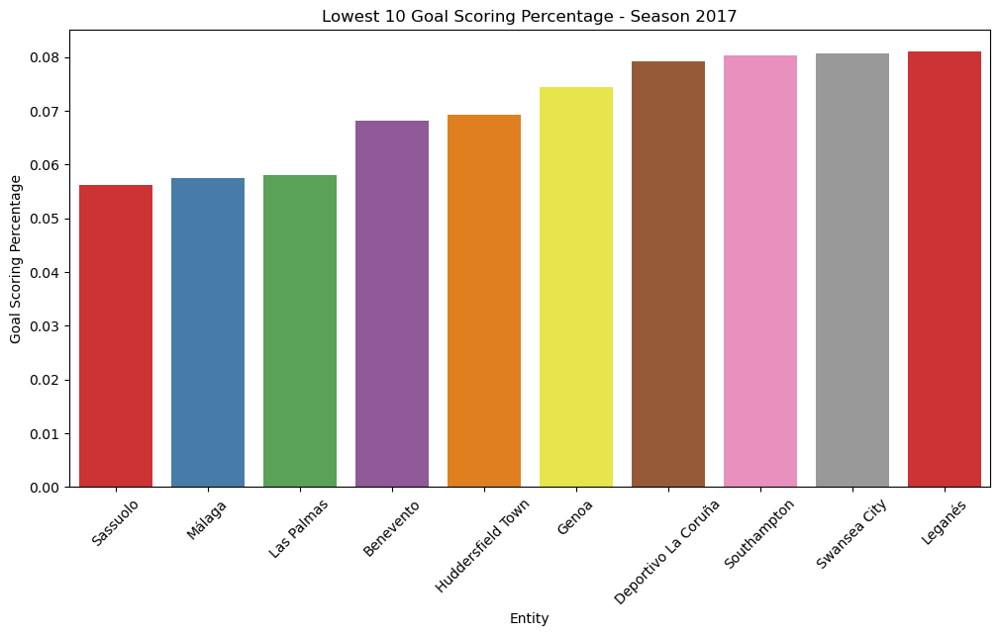

Season 2018


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




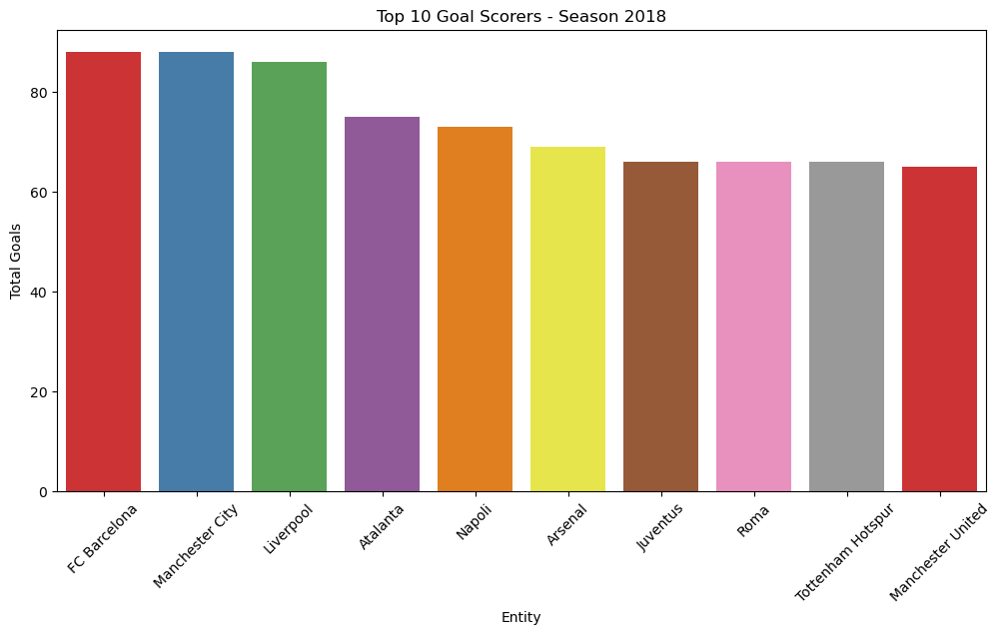

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




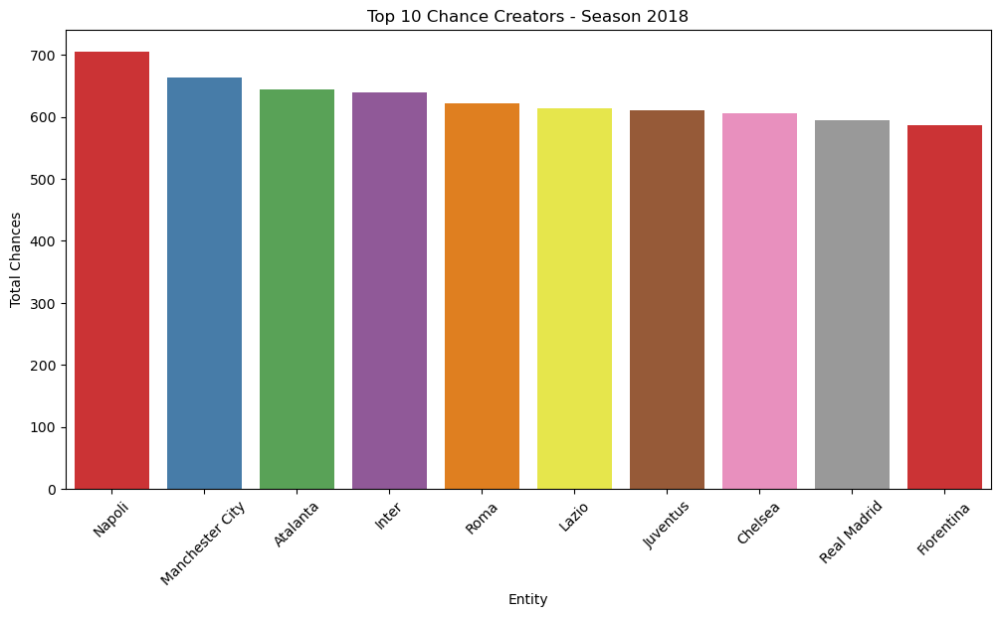

Top 10 Goal Scoring Percentage Data - Season 2018:
      season         playerTeam  total_goals  total_attempts  total_chances  \
258    2018       FC Barcelona           88             563            563   
273    2018          Liverpool           86             575            575   
241    2018            Arsenal           69             468            468   
274    2018    Manchester City           88             664            664   
288    2018          Sampdoria           60             487            487   
275    2018  Manchester United           65             529            529   
240    2018    AFC Bournemouth           55             449            449   
293    2018  Tottenham Hotspur           66             540            540   
272    2018            Levante           54             442            442   
247    2018            Burnley           43             363            363   

     goal_scoring_percentage  
258                 0.156306  
273                 0.14956

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




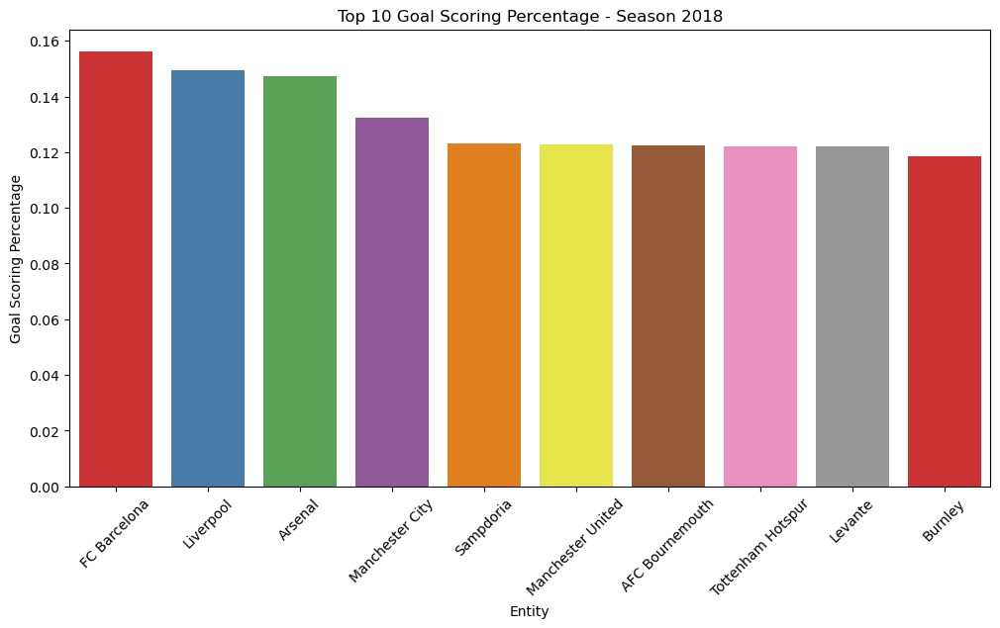

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2018:
      season         playerTeam  total_goals  total_attempts  total_chances  \
265    2018  Huddersfield Town           21             402            402   
260    2018          Frosinone           28             456            456   
252    2018             Chievo           25             391            391   
262    2018              Genoa           37             535            535   
261    2018             Fulham           33             456            456   
284    2018    Real Valladolid           31             413            413   
259    2018         Fiorentina           46             587            587   
249    2018       Cardiff City           33             417            417   
248    2018           Cagliari           35             436            436   
294    2018            Udinese           38             464            464   

     goal_scoring_percentage  
265                 0.052239  
260                 0.06

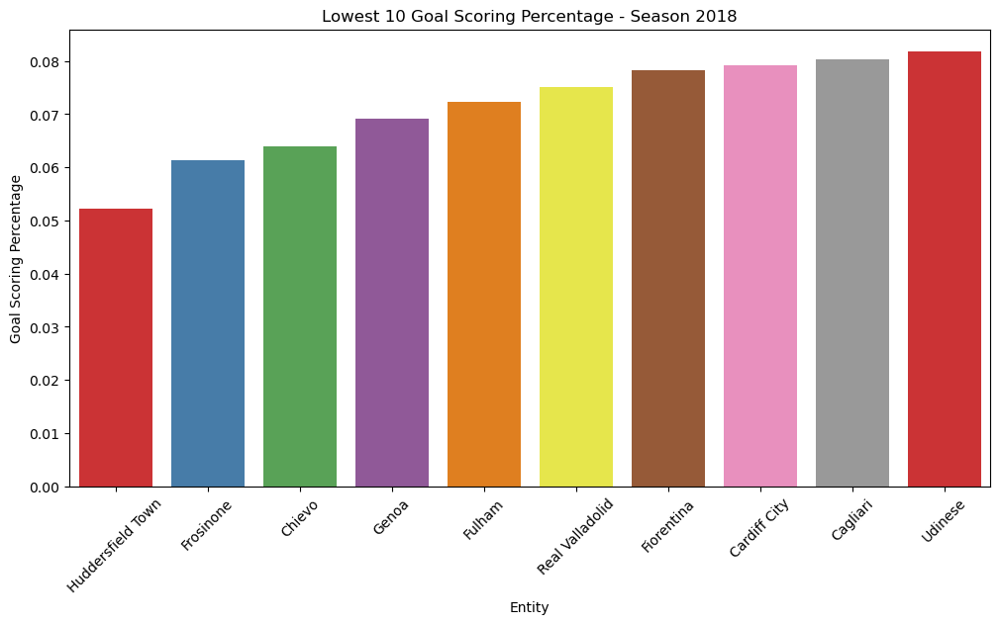

Season 2019


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




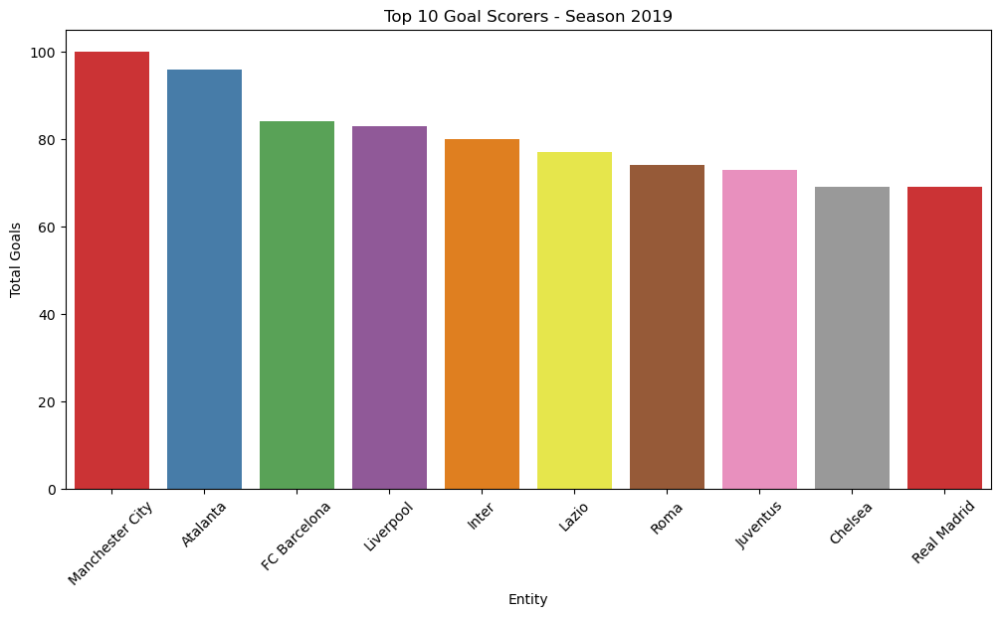

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




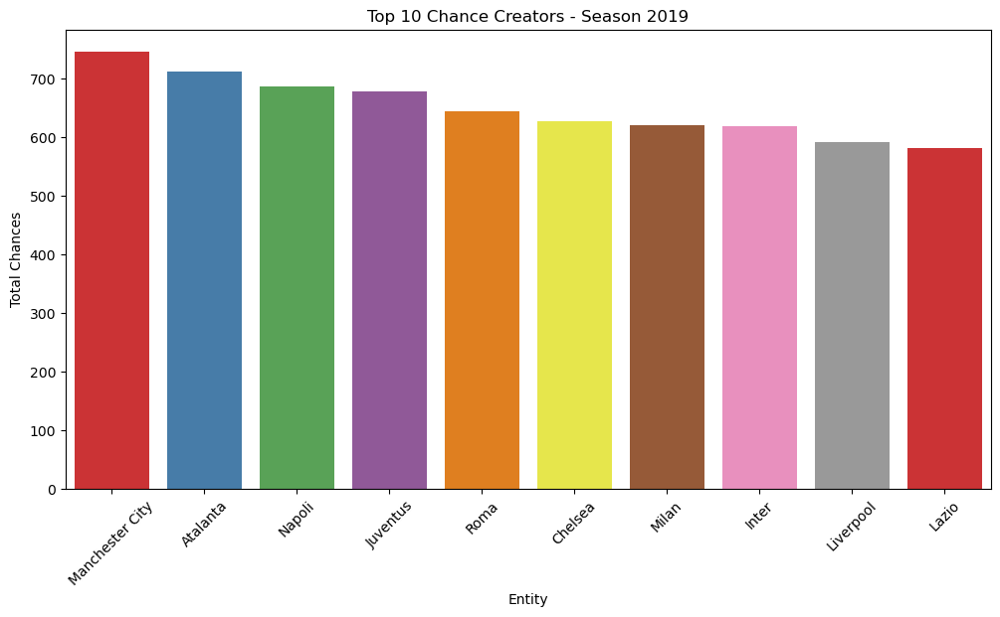

Top 10 Goal Scoring Percentage Data - Season 2019:
      season       playerTeam  total_goals  total_attempts  total_chances  \
317    2019     FC Barcelona           84             494            494   
330    2019        Liverpool           83             592            592   
301    2019          Arsenal           56             406            406   
303    2019         Atalanta           96             712            712   
332    2019  Manchester City          100             746            746   
355    2019         Valencia           45             339            339   
325    2019            Lazio           77             582            582   
321    2019          Granada           51             393            393   
323    2019            Inter           80             619            619   
342    2019    Real Sociedad           55             430            430   

     goal_scoring_percentage  
317                 0.170040  
330                 0.140203  
301               

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




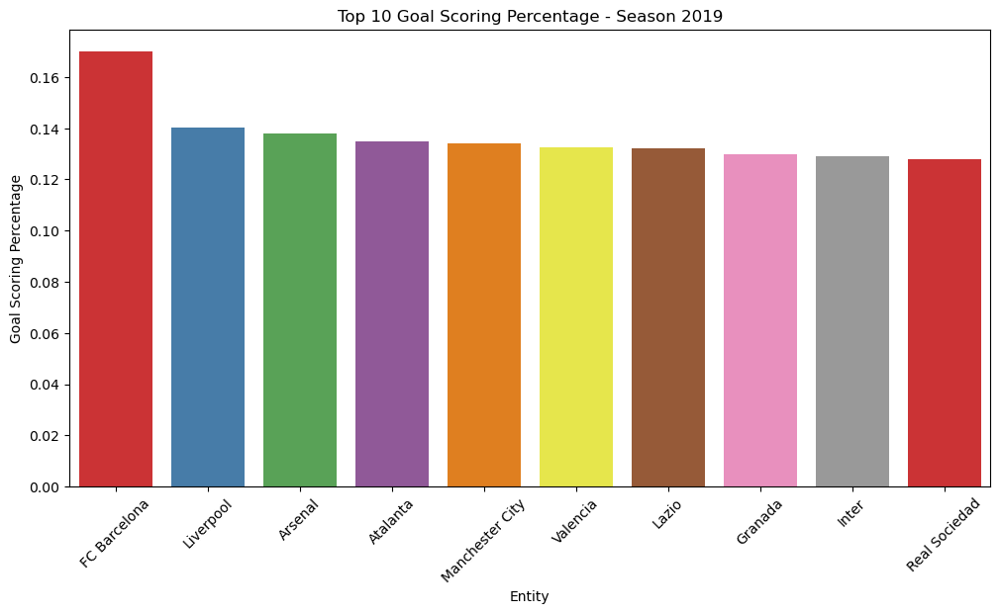

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2019:
      season              playerTeam  total_goals  total_attempts  \
346    2019                    SPAL           27             470   
315    2019                Espanyol           25             412   
337    2019            Norwich City           25             412   
327    2019                 Leganés           30             431   
308    2019  Brighton & Hove Albion           35             463   
313    2019          Crystal Palace           29             378   
354    2019                 Udinese           37             468   
307    2019                 Brescia           34             421   
357    2019                 Watford           35             425   
343    2019         Real Valladolid           31             374   

     total_chances  goal_scoring_percentage  
346            470                 0.057447  
315            412                 0.060680  
337            412                 0.060680  
327         

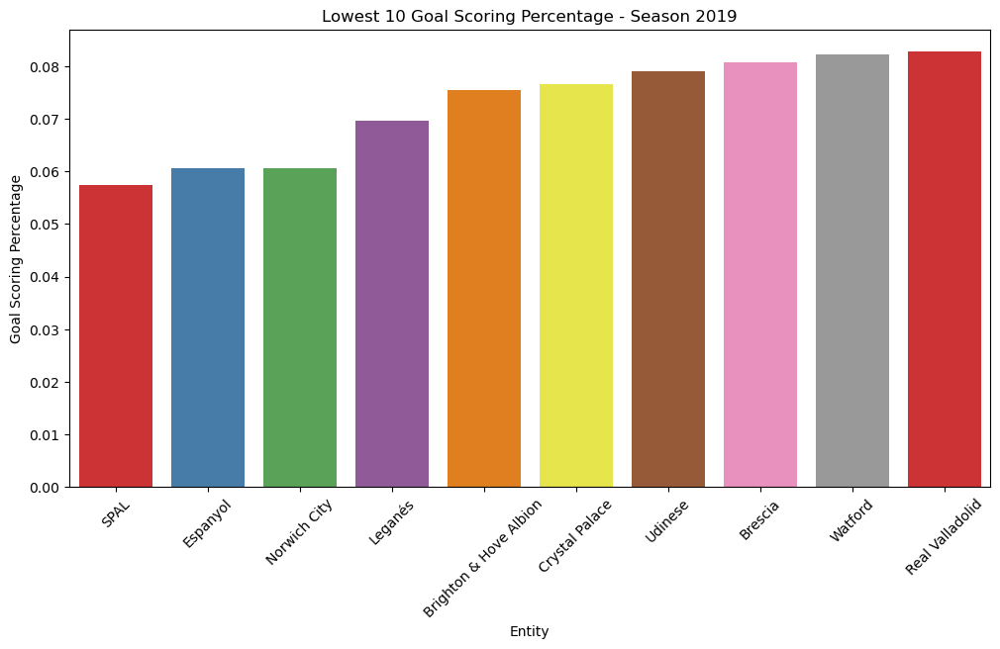

Season 2020


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




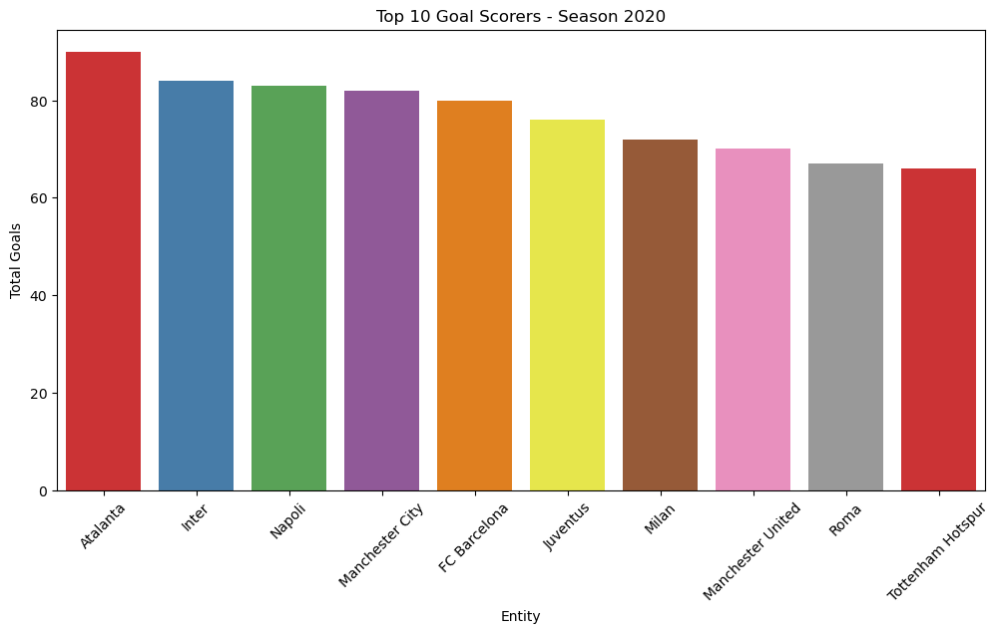

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




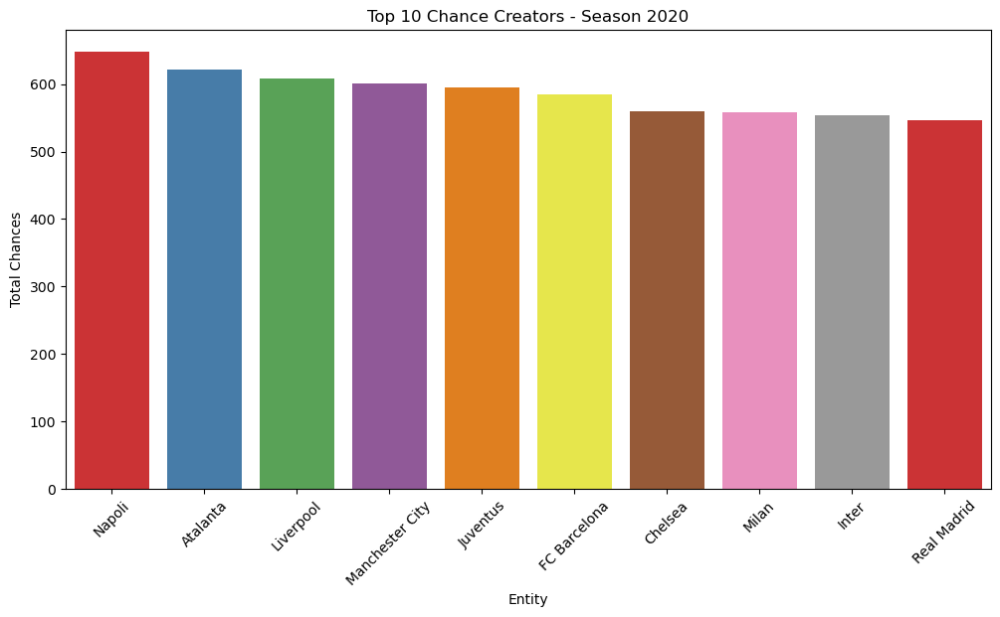

Top 10 Goal Scoring Percentage Data - Season 2020:
      season         playerTeam  total_goals  total_attempts  total_chances  \
370    2020      Celta de Vigo           55             359            359   
386    2020              Inter           84             554            554   
413    2020  Tottenham Hotspur           66             447            447   
362    2020           Atalanta           90             622            622   
364    2020    Atlético Madrid           65             462            462   
416    2020         Villarreal           57             408            408   
378    2020       FC Barcelona           80             584            584   
393    2020    Manchester City           82             601            601   
381    2020              Genoa           46             342            342   
411    2020             Spezia           52             390            390   

     goal_scoring_percentage  
370                 0.153203  
386                 0.15162

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




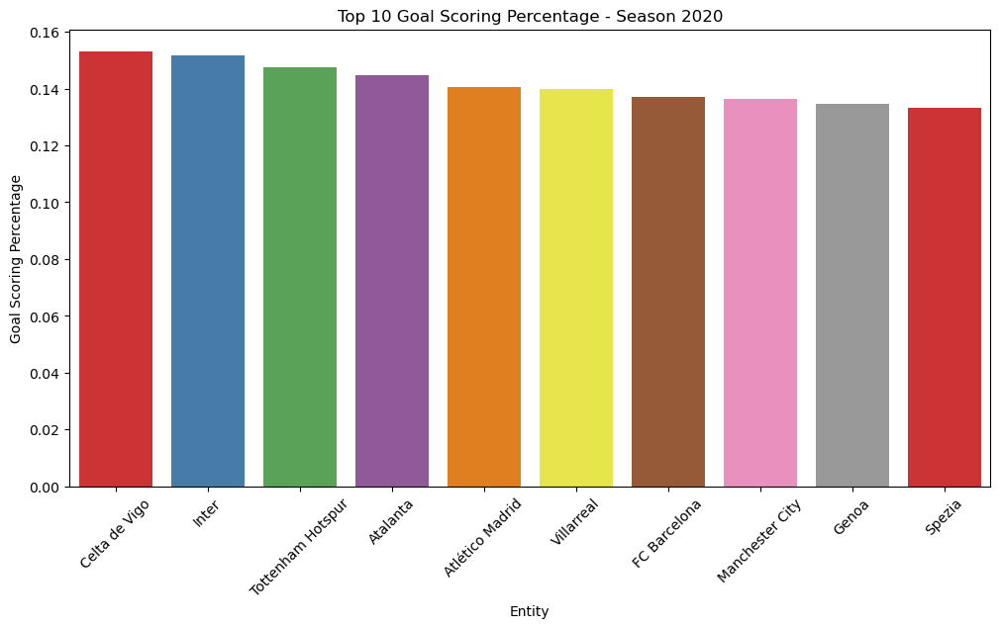

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2020:
      season               playerTeam  total_goals  total_attempts  \
409    2020         Sheffield United           19             328   
380    2020                   Fulham           26             443   
405    2020                 SD Eibar           29             452   
419    2020  Wolverhampton Wanderers           34             467   
382    2020                   Getafe           27             365   
367    2020   Brighton & Hove Albion           39             489   
385    2020                   Huesca           33             406   
368    2020                  Burnley           32             385   
403    2020          Real Valladolid           34             367   
365    2020                Benevento           40             424   

     total_chances  goal_scoring_percentage  
409            328                 0.057927  
380            443                 0.058691  
405            452                 0.064159  
4

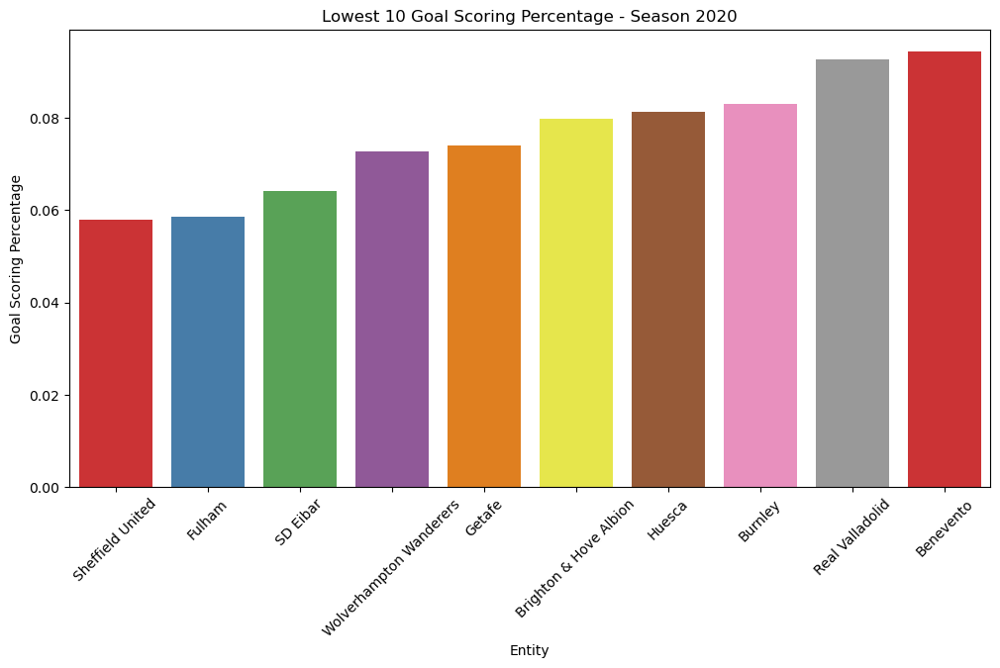

Season 2021


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




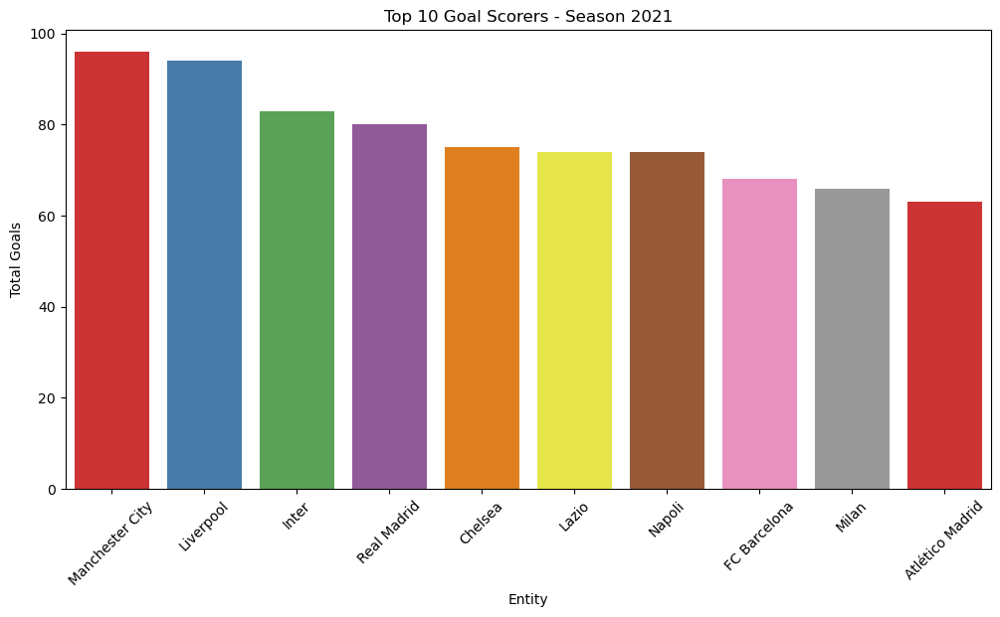

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




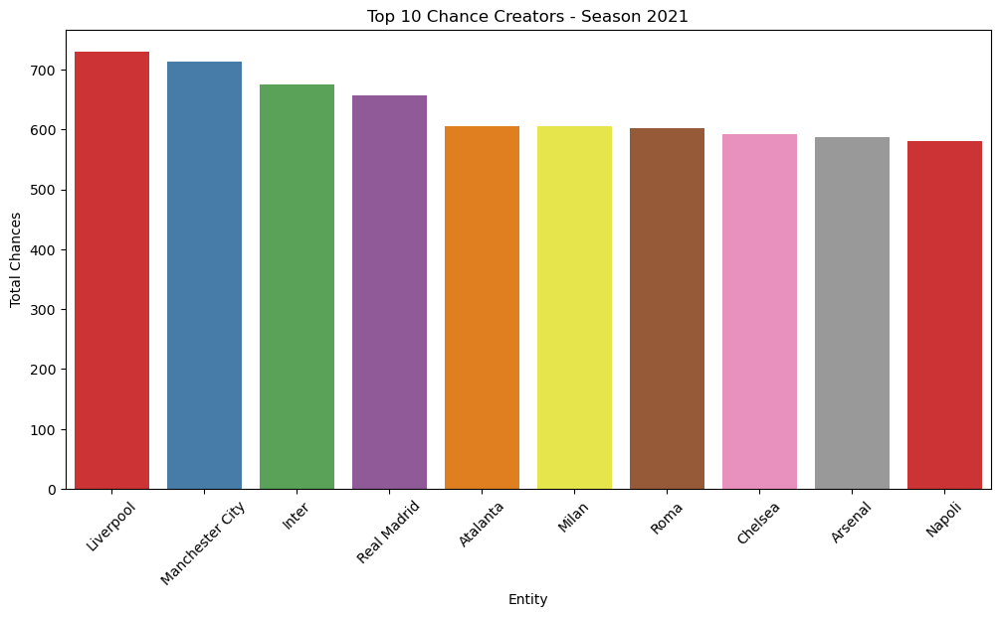

Top 10 Goal Scoring Percentage Data - Season 2021:
      season         playerTeam  total_goals  total_attempts  total_chances  \
447    2021              Lazio           74             455            455   
449    2021     Leicester City           62             435            435   
444    2021      Hellas Verona           63             463            463   
476    2021         Villarreal           62             456            456   
424    2021    Atlético Madrid           63             466            466   
453    2021    Manchester City           96             714            714   
439    2021       FC Barcelona           68             518            518   
451    2021          Liverpool           94             730            730   
478    2021    West Ham United           58             452            452   
472    2021  Tottenham Hotspur           63             493            493   

     goal_scoring_percentage  
447                 0.162637  
449                 0.14252

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




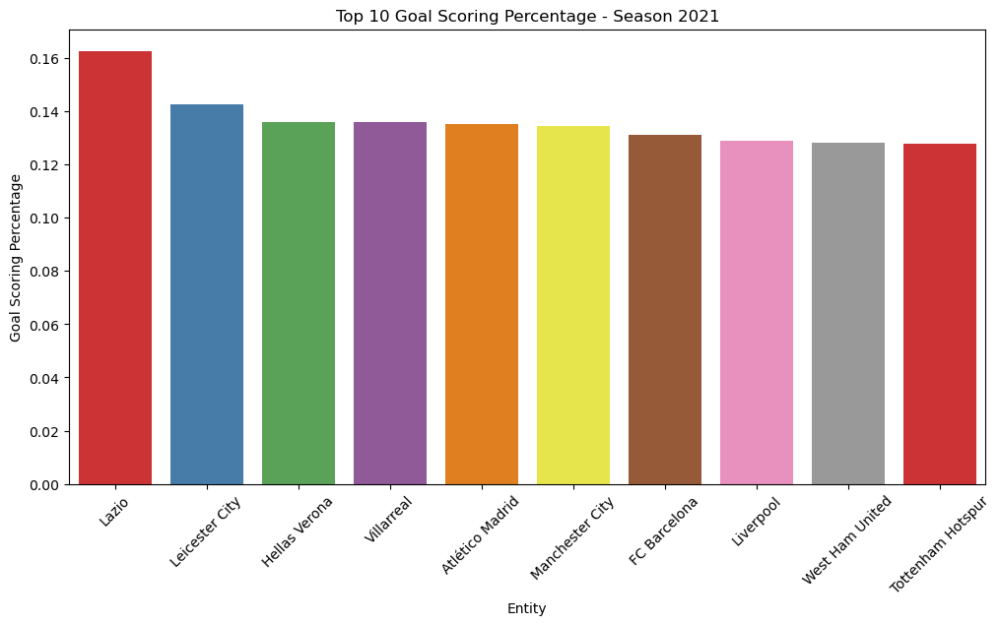

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2021:
      season              playerTeam  total_goals  total_attempts  \
458    2021            Norwich City           21             375   
441    2021                   Genoa           26             408   
465    2021             Salernitana           32             434   
452    2021                Mallorca           33             447   
460    2021          Rayo Vallecano           38             507   
434    2021        Deportivo Alavés           29             382   
428    2021                 Burnley           32             409   
442    2021                  Getafe           32             409   
429    2021                Cagliari           34             425   
427    2021  Brighton & Hove Albion           40             488   

     total_chances  goal_scoring_percentage  
458            375                 0.056000  
441            408                 0.063725  
465            434                 0.073733  
452         

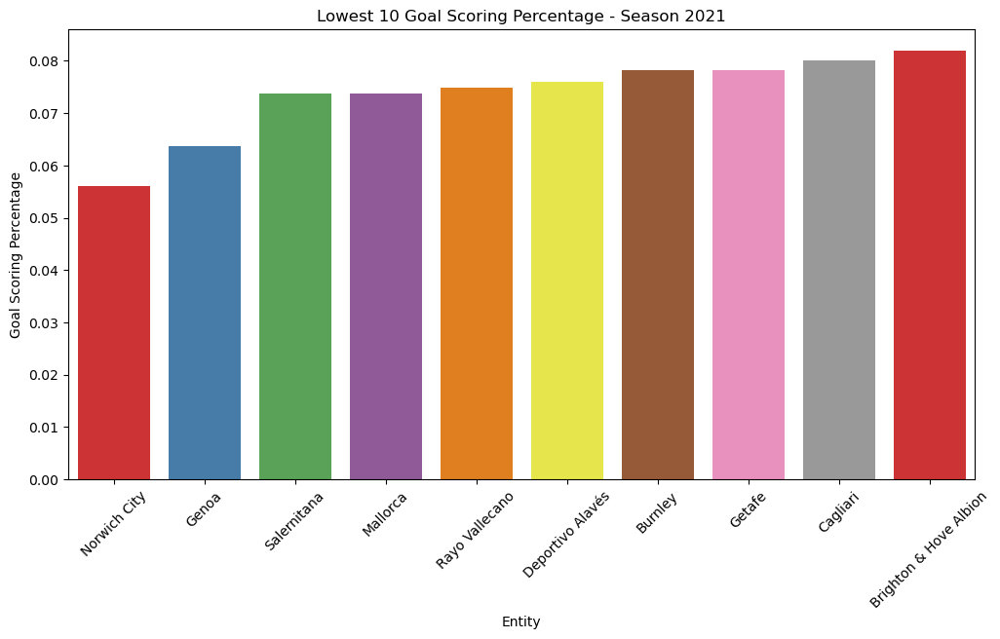

Season 2022


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




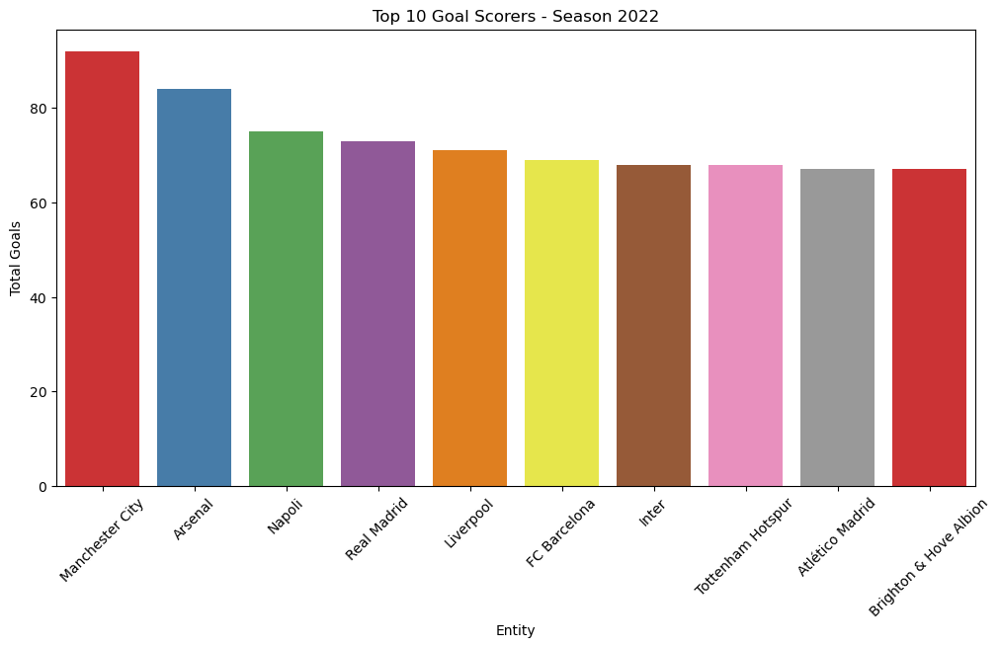

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




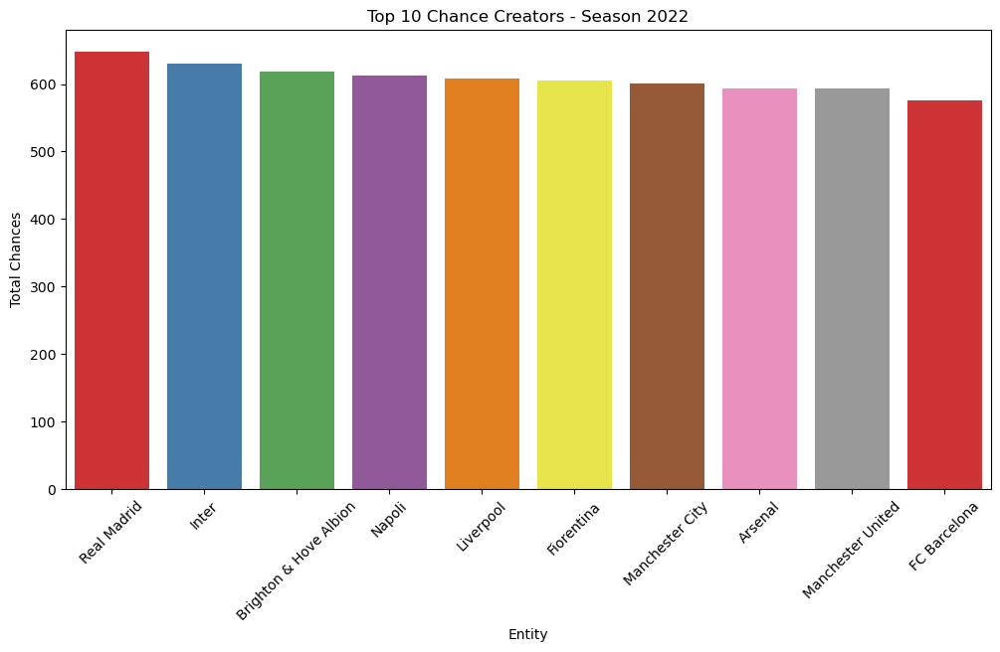

Top 10 Goal Scoring Percentage Data - Season 2022:
      season         playerTeam  total_goals  total_attempts  total_chances  \
513    2022    Manchester City           92             601            601   
482    2022            Arsenal           84             593            593   
488    2022          Brentford           56             411            411   
507    2022              Lazio           59             439            439   
534    2022  Tottenham Hotspur           68             521            521   
486    2022    Atlético Madrid           67             541            541   
484    2022           Atalanta           64             517            517   
517    2022             Napoli           75             612            612   
501    2022             Fulham           52             430            430   
503    2022             Girona           55             455            455   

     goal_scoring_percentage  
513                 0.153078  
482                 0.14165

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




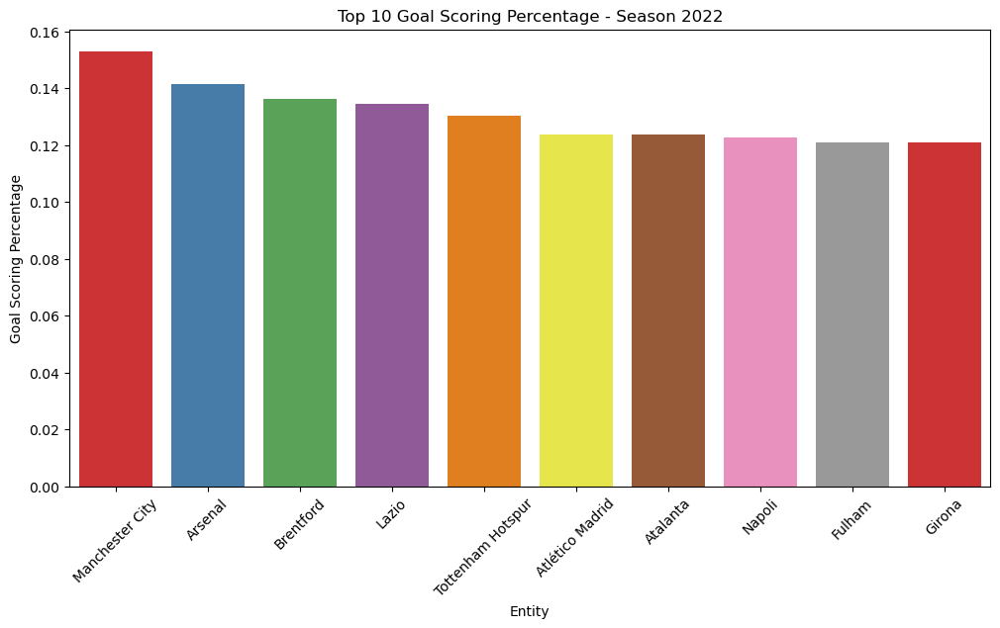

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2118126327.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Lowest 10 Goal Scoring Percentage Data - Season 2022:
      season               playerTeam  total_goals  total_attempts  \
528    2022                Sampdoria           23             381   
539    2022  Wolverhampton Wanderers           28             414   
532    2022                   Spezia           29             423   
504    2022            Hellas Verona           29             417   
525    2022          Real Valladolid           32             447   
494    2022                    Cádiz           29             396   
508    2022                    Lecce           31             422   
495    2022                    Elche           30             406   
498    2022                  Everton           32             428   
492    2022                Cremonese           35             466   

     total_chances  goal_scoring_percentage  
528            381                 0.060367  
539            414                 0.067633  
532            423                 0.068558  
5

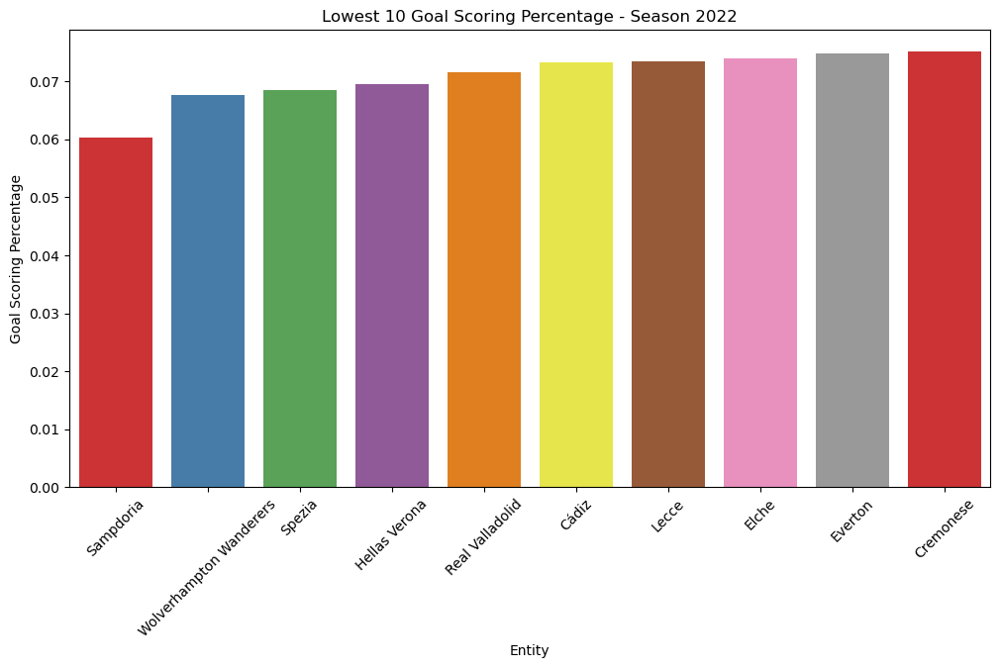

In [65]:
# Create a dictionary with the season as the key and corresponding team data for that season as the value.

team_season_data = {season: team_metrics_season[team_metrics_season['season'] == season] for season in team_metrics_season['season'].unique()}
# Generate seasonal plots for teams. Only teams with at least 200 attempts will be included.
# 'entity' is set to 'playerTeam' to focus on team-level performance metrics.
generate_seasonal_plots(team_season_data, attempts_threshold = 200, entity='playerTeam' )

In [66]:
# This gives a list of distinct outcomes for each shot (e.g., 'Goal', 'Missed', 'Blocked', etc.).
shots['result'].unique()

array(['BlockedShot', 'MissedShots', 'SavedShot', 'Goal', 'ShotOnPost',
       'OwnGoal'], dtype=object)

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:14: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




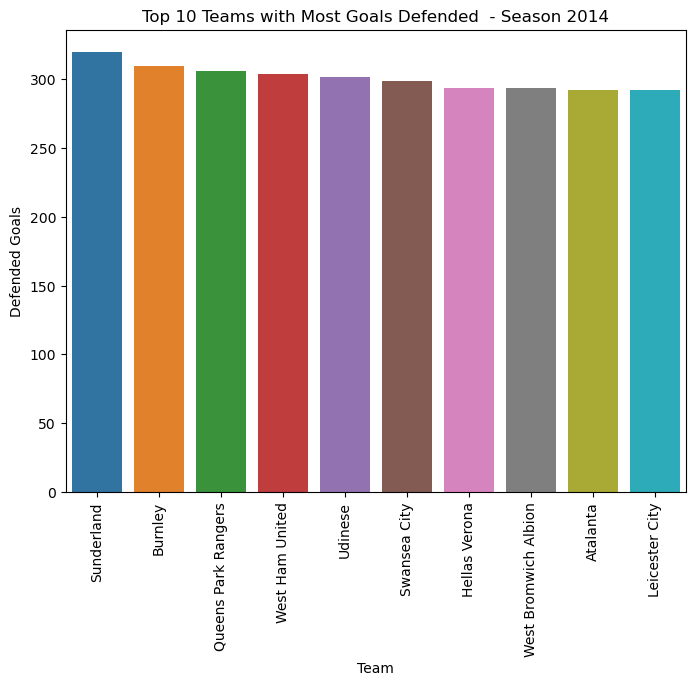

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




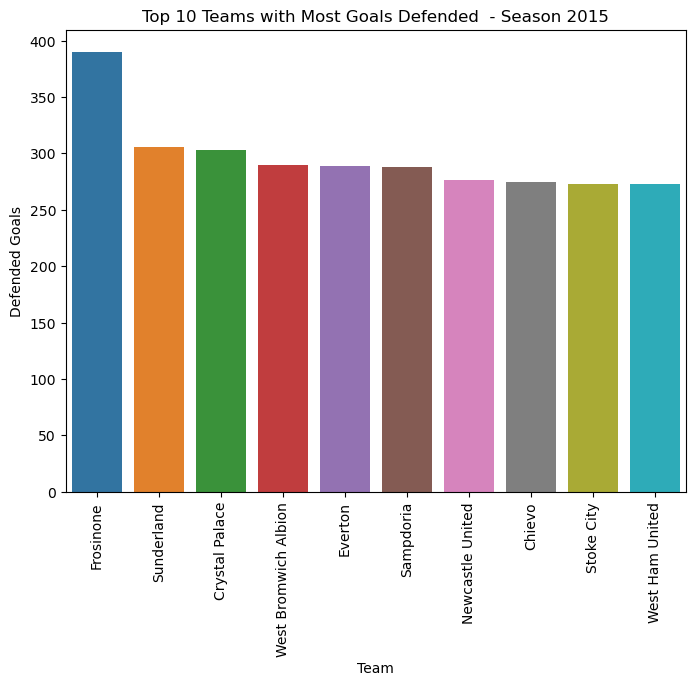

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




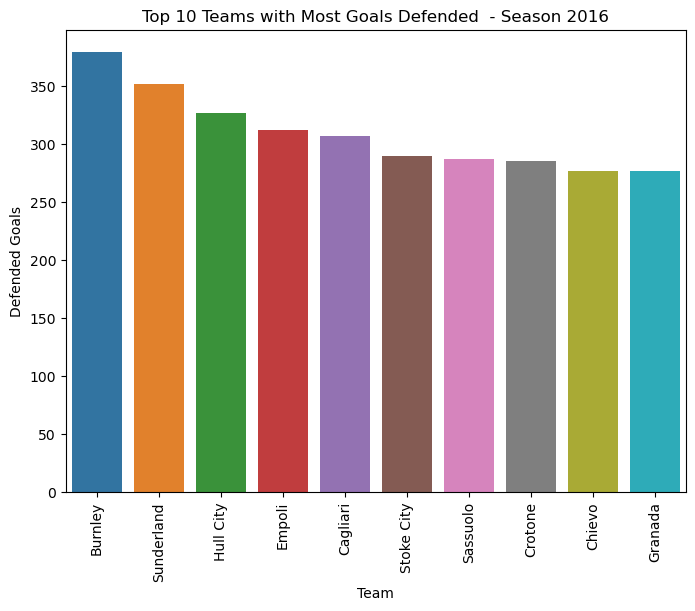

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




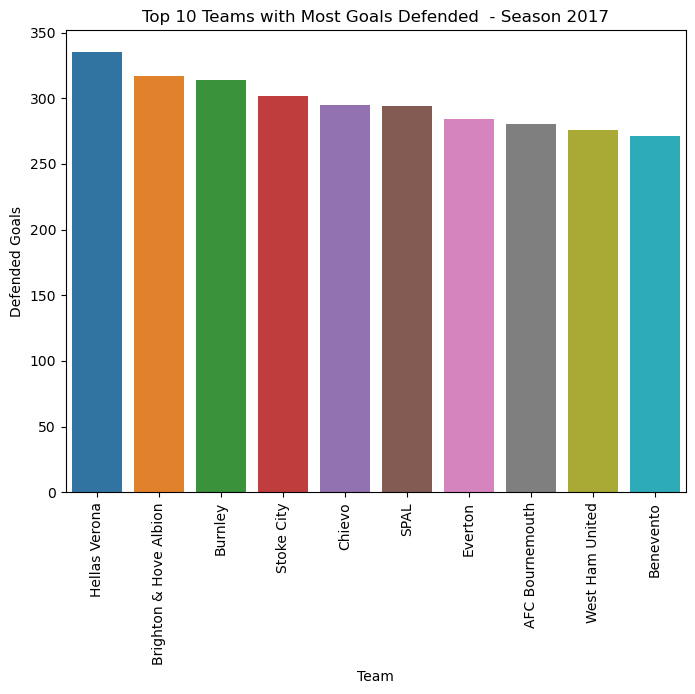

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




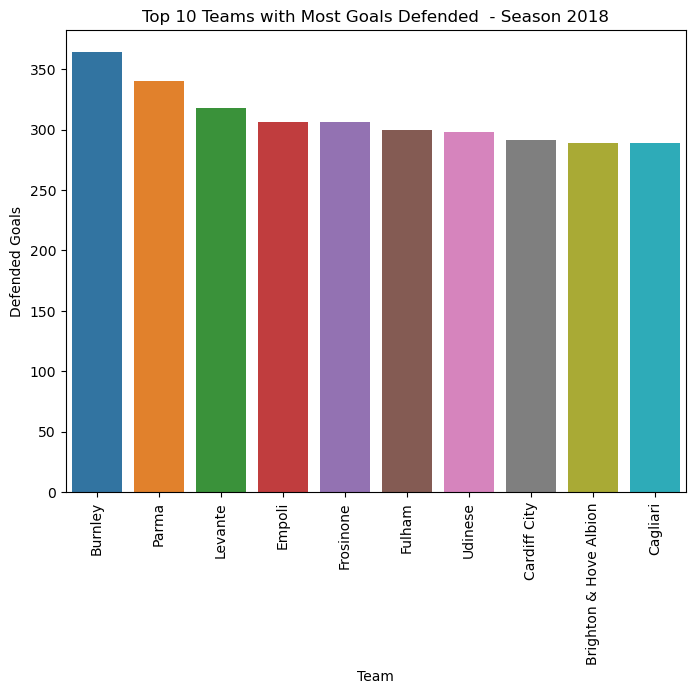

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




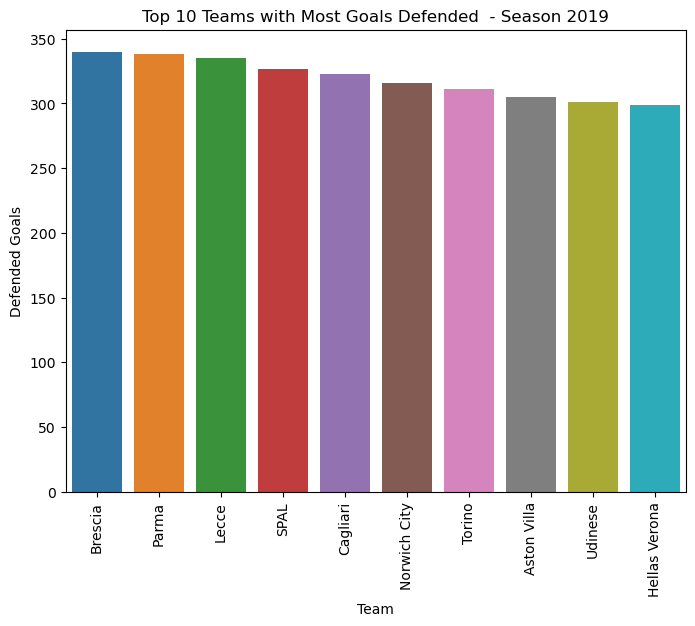

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




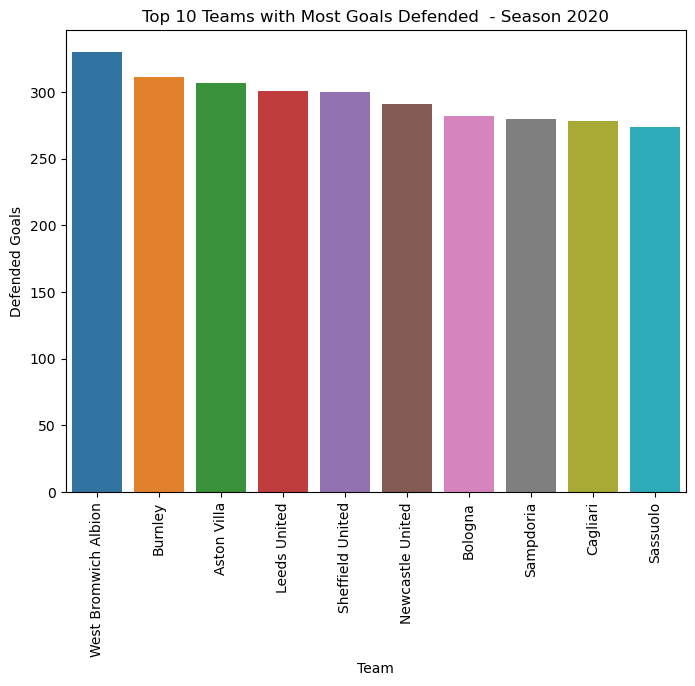

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




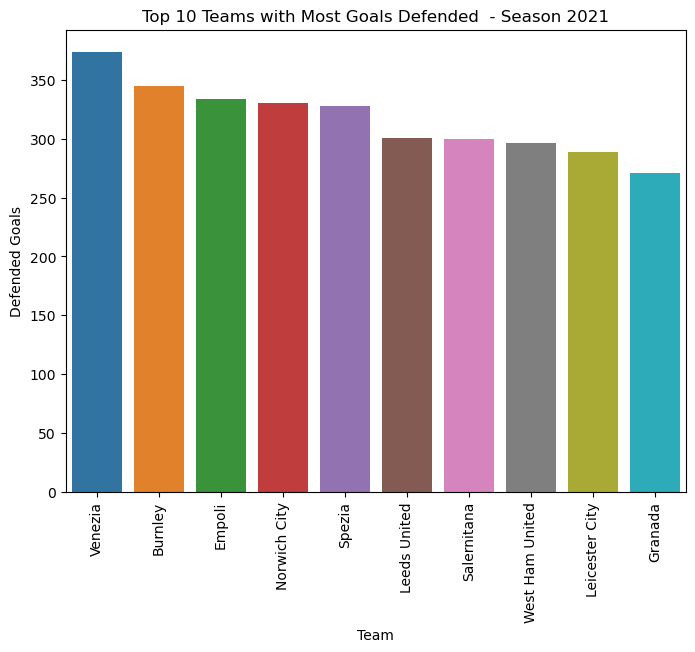

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




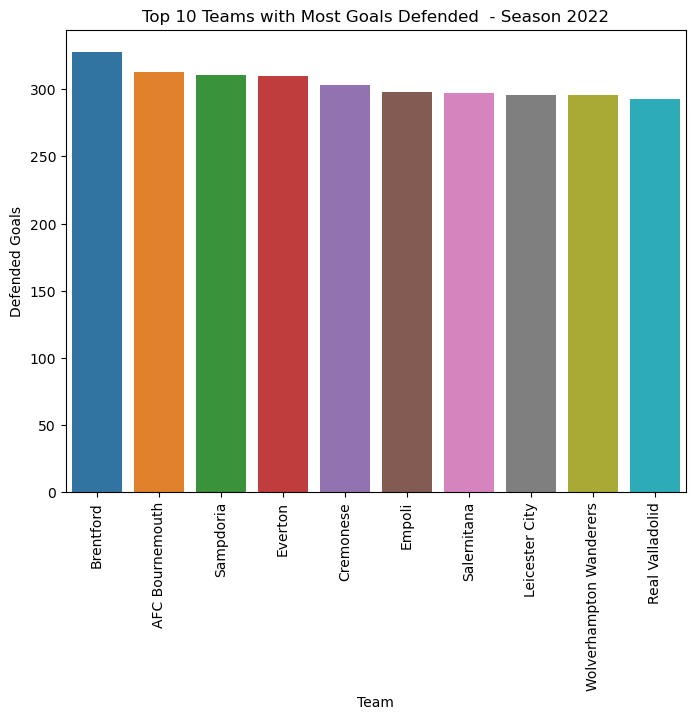

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4114942598.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




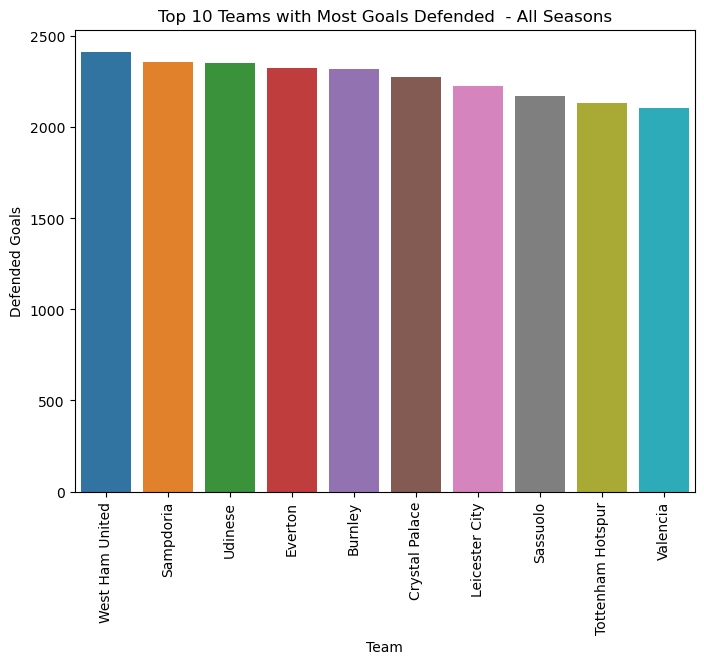

In [88]:
# Extract relevant columns from the 'shots' DataFrame to focus on season, opponent team, result, and goal status.
# The goal is to analyze defended goals (e.g., blocked or saved shots) and identify top-performing defensive teams.
relevant_columns = ['season', 'opponentTeam', 'result', 'is_goal']
shots_defend = shots[relevant_columns]

# Compute defended goals
defended_goals = shots_defend[(shots_defend['result'].isin(['BlockedShot', 'SavedShot'])) & 
                              (shots_defend['is_goal'] == 0)]

# Group by team and season to get the total number of defended goals
team_defended_goals = defended_goals.groupby(['season', 'opponentTeam']).size().reset_index(name='defended_goals')

# Find the top teams with most defended goals for each season
top_defended_teams = team_defended_goals.groupby('season').apply(
    lambda x: x.nlargest(10, 'defended_goals')).reset_index(drop=True)

# Plotting the top teams with most defended goals
def create_bar_plot(df, x, y, title, xlabel, ylabel, palette):
    plt.figure(figsize=(8, 6))
    sns.barplot(data=df, x=x, y=y, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Generate the plots for each season
for season in top_defended_teams['season'].unique():
    season_data = top_defended_teams[top_defended_teams['season'] == season]
    create_bar_plot(season_data, 'opponentTeam', 'defended_goals', f'Top 10 Teams with Most Goals Defended  - Season {season}', 'Team', 'Defended Goals', 'tab10')

# Summary of top defended goals for all seasons
total_defended_goals = team_defended_goals.groupby('opponentTeam')['defended_goals'].sum().reset_index()
top_total_defended_teams = total_defended_goals.nlargest(10, 'defended_goals')

# Plot overall top defended goals
create_bar_plot(top_total_defended_teams, 'opponentTeam', 'defended_goals', 'Top 10 Teams with Most Goals Defended  - All Seasons', 'Team', 'Defended Goals', 'tab10')

In [71]:
# Extract relevant columns from the 'shots' DataFrame to focus on season, opponent team, result, and goal status.
# The goal is to compute defensive and offensive metrics (saved shots, blocked shots, and goals) for each team in each season.
# This will help analyze the defensive effectiveness of teams by calculating metrics like the saved/goal ratio.
relevant_columns = ['season', 'opponentTeam', 'result', 'is_goal']
shots_defend = shots[relevant_columns]

# Compute saved, blocked, and goal counts for each team and season
saved_shots = shots_defend[(shots_defend['result'] == 'SavedShot') & (shots_defend['is_goal'] == 0)]
blocked_shots = shots_defend[(shots_defend['result'] == 'BlockedShot') & (shots_defend['is_goal'] == 0)]
goals = shots_defend[(shots_defend['result'] == 'Goal') & (shots_defend['is_goal'] == 1)]

saved_counts = saved_shots.groupby(['season', 'opponentTeam']).size().reset_index(name='saved_shots')
blocked_counts = blocked_shots.groupby(['season', 'opponentTeam']).size().reset_index(name='blocked_shots')
goal_counts = goals.groupby(['season', 'opponentTeam']).size().reset_index(name='goals')

# Merge the counts into a single DataFrame
team_metrics = saved_counts.merge(blocked_counts, on=['season', 'opponentTeam'], how='outer').merge(goal_counts, on=['season', 'opponentTeam'], how='outer').fillna(0)

# Calculate the saved/goal ratio
team_metrics['saved_goal_ratio'] = (team_metrics['saved_shots'] + team_metrics['blocked_shots']) / team_metrics['goals']
team_metrics['saved_goal_ratio'] = team_metrics['saved_goal_ratio'].replace([float('inf'), -float('inf')], 0)

# Find the top and bottom teams by saved/goal ratio for each season
top_saved_goal_ratio = team_metrics.groupby('season').apply(lambda x: x.nlargest(10, 'saved_goal_ratio')).reset_index(drop=True)
bottom_saved_goal_ratio = team_metrics.groupby('season').apply(lambda x: x.nsmallest(10, 'saved_goal_ratio')).reset_index(drop=True)


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2835881391.py:21: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/2835881391.py:22: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [74]:
def create_bar_plot(df, x, y, title, xlabel, ylabel, palette):
    plt.figure(figsize=(8, 6))
    sns.barplot(data=df, x=x, y=y, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




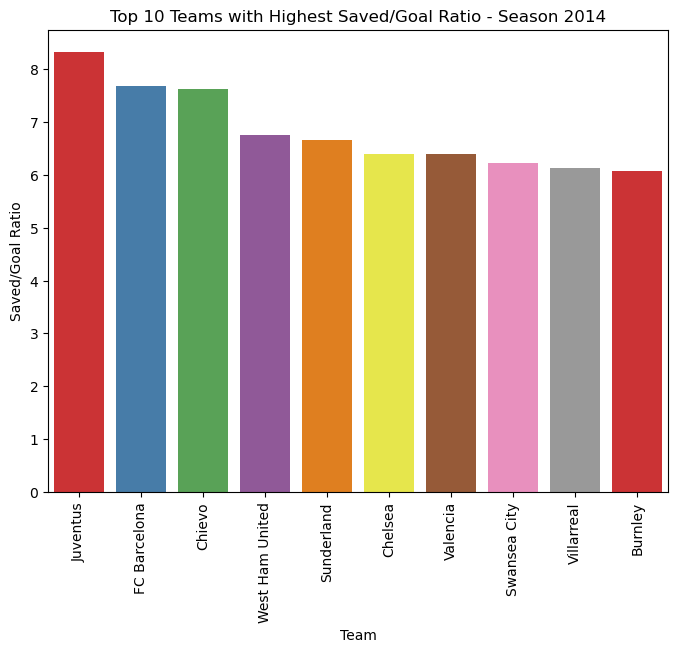

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




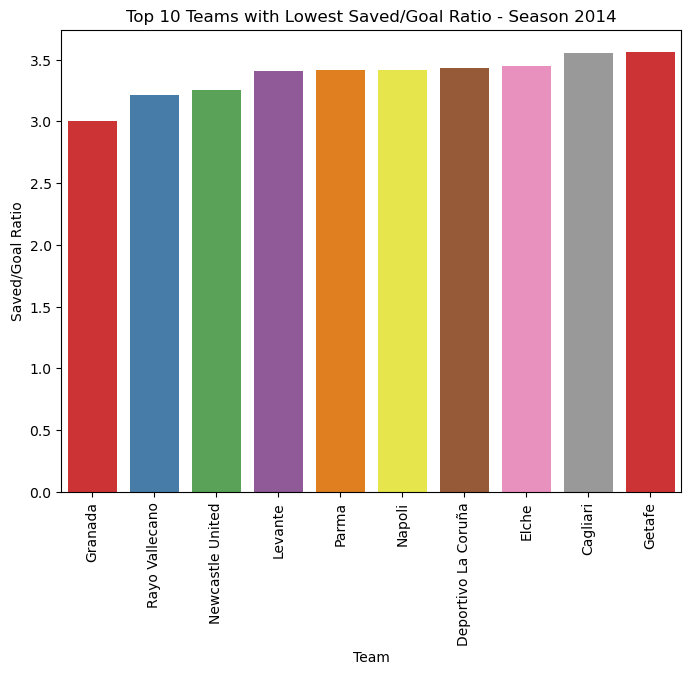

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




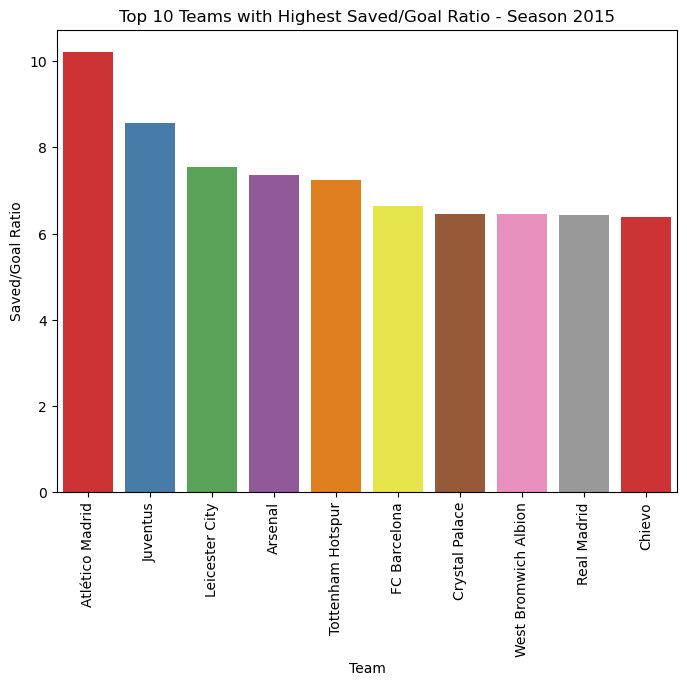

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




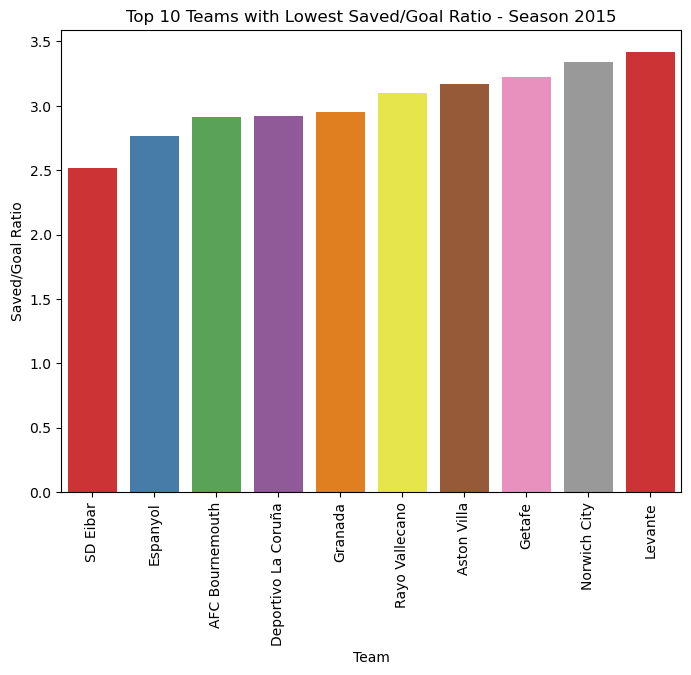

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




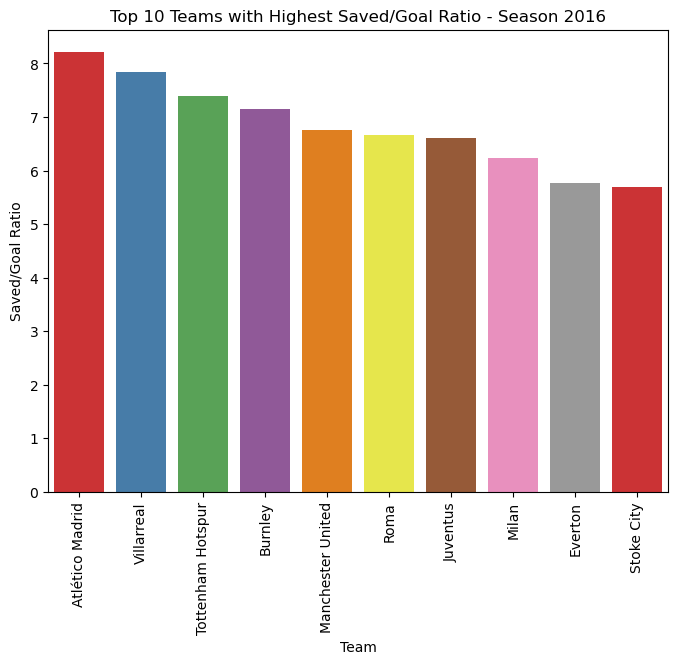

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




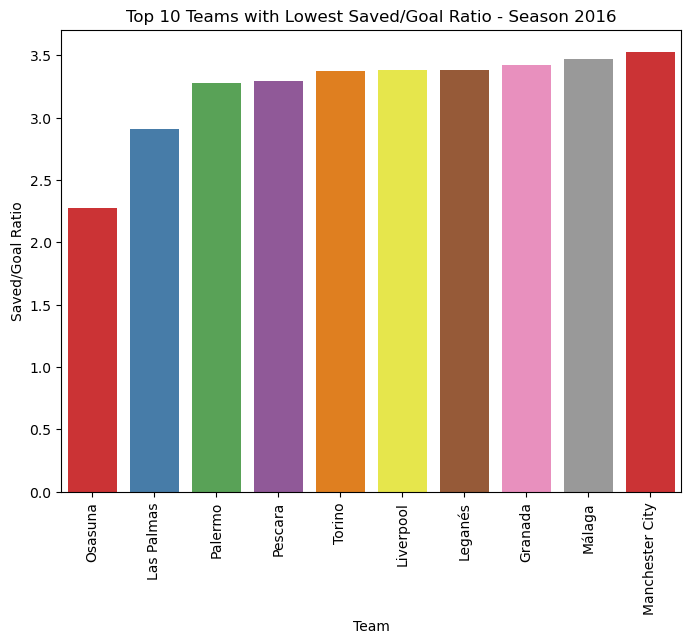

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




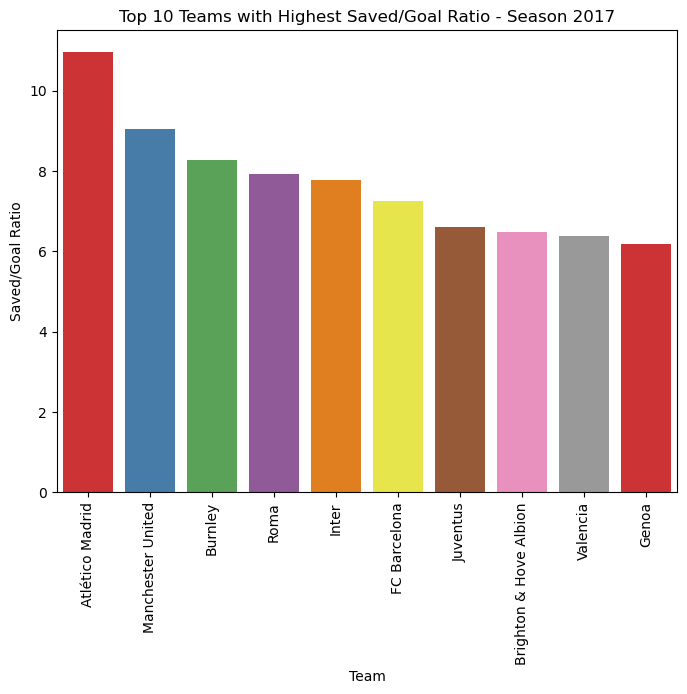

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




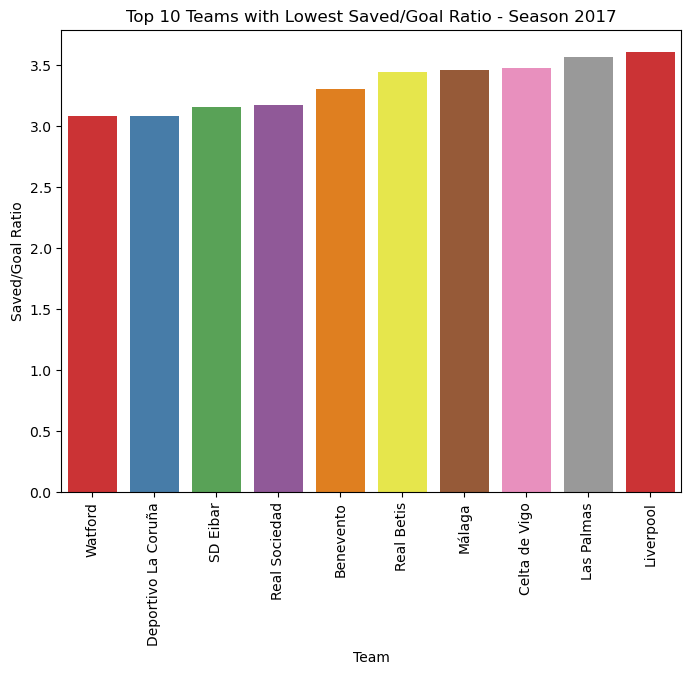

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




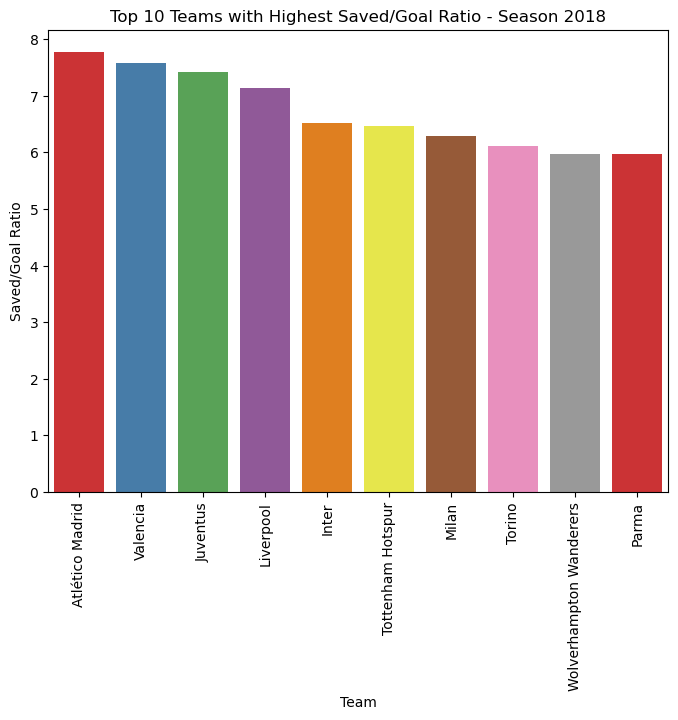

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




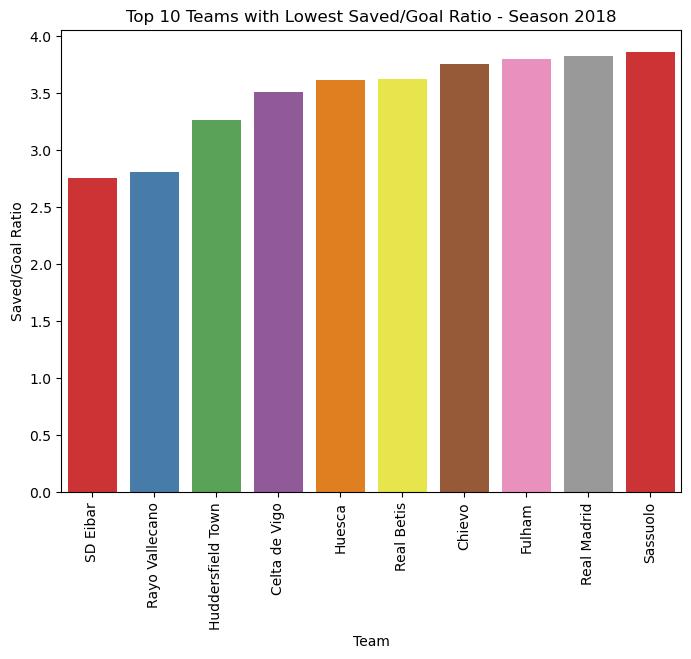

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




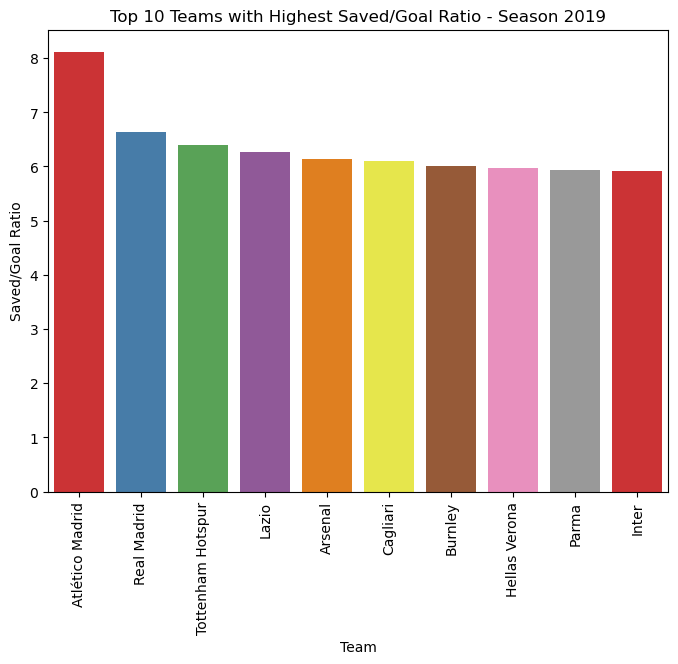

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




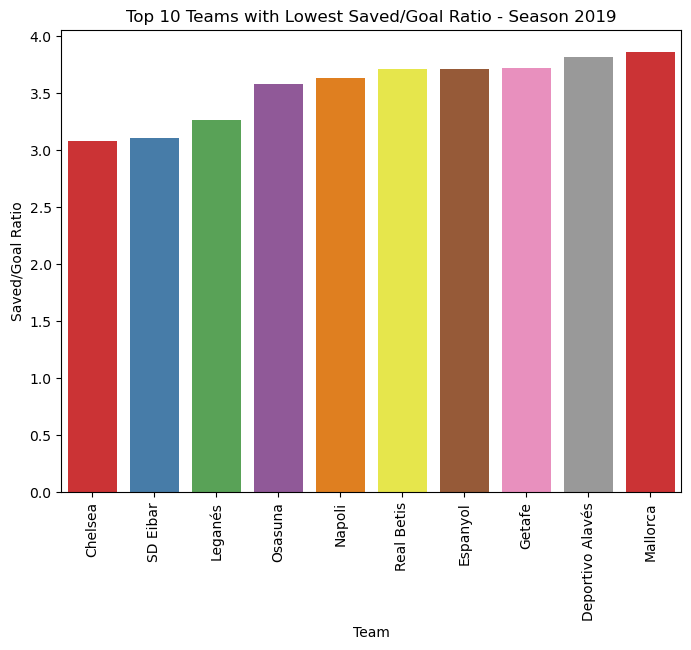

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




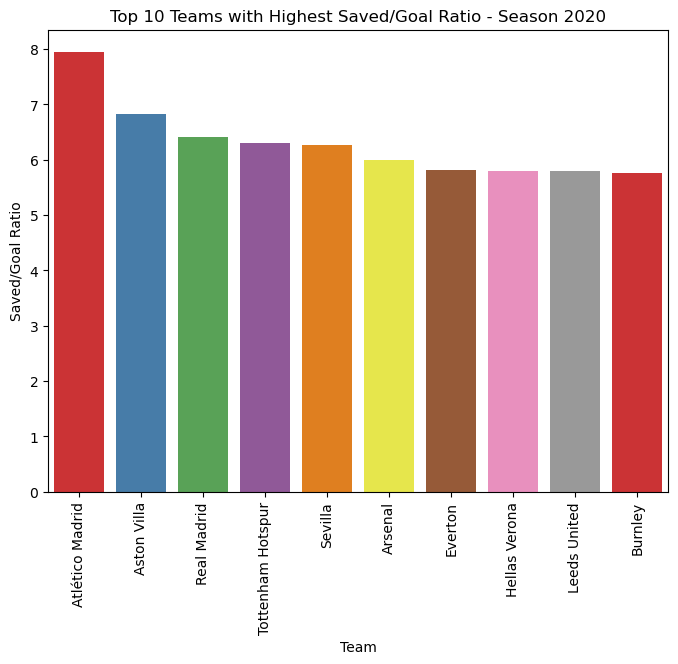

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




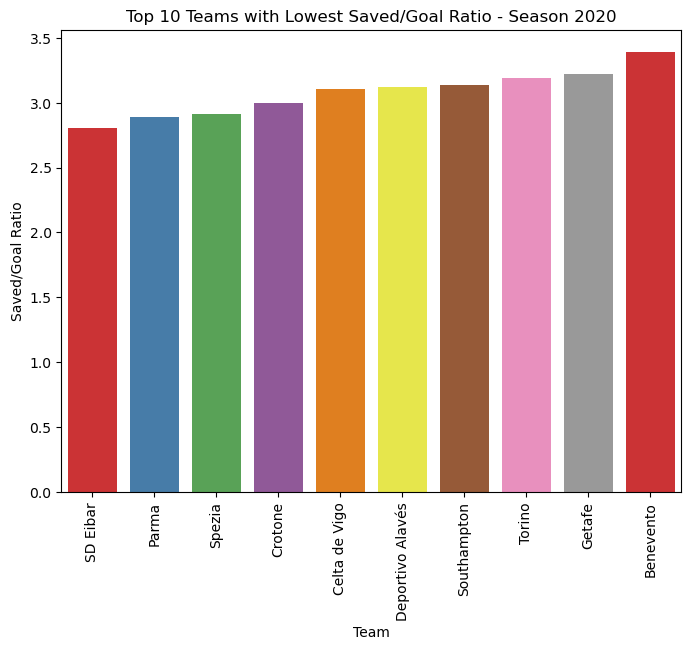

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




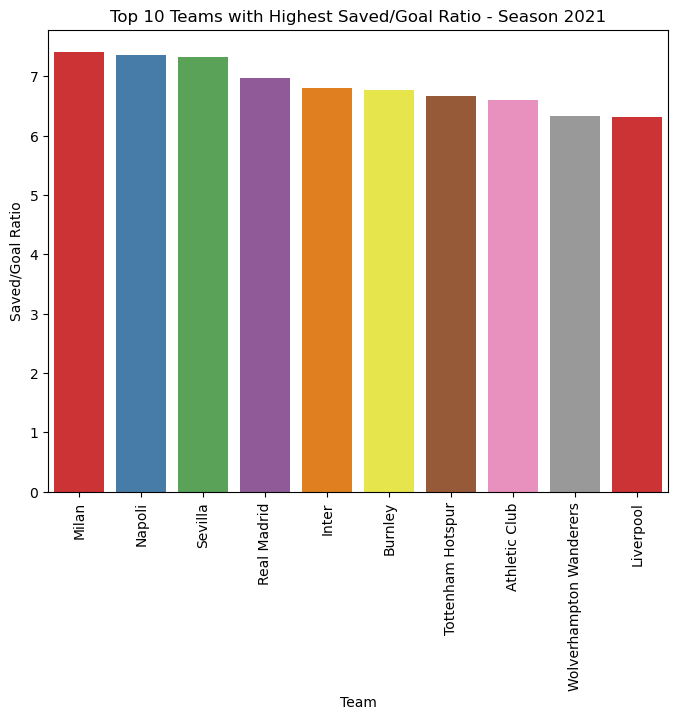

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




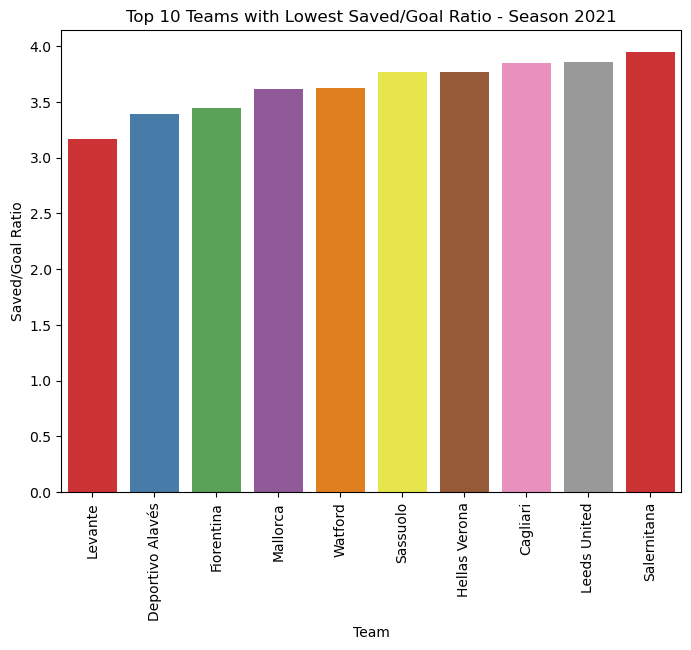

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




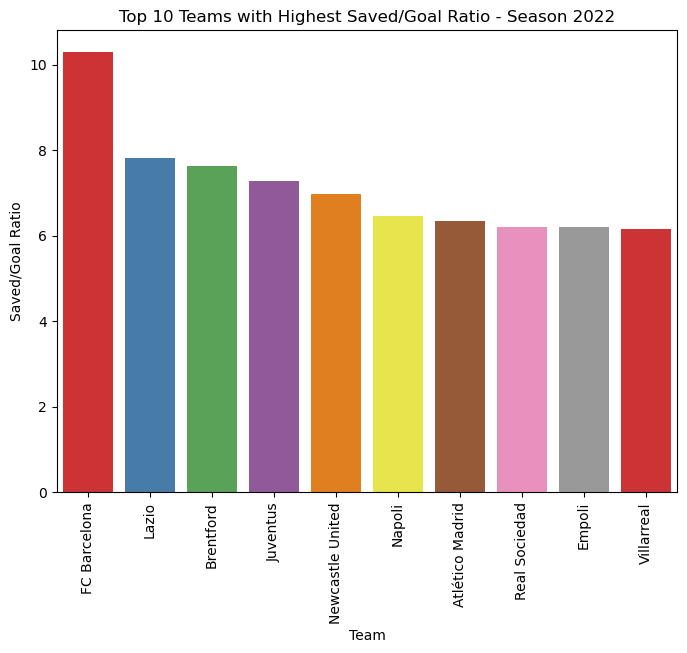

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




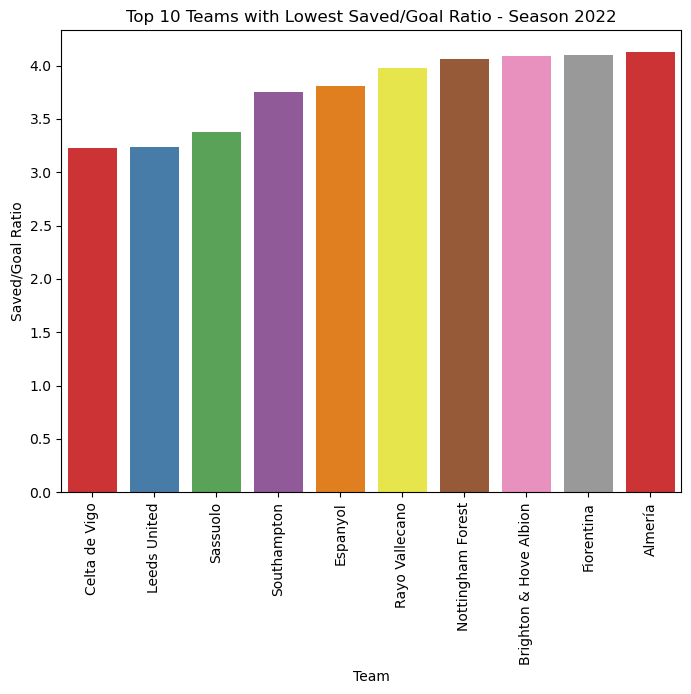

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




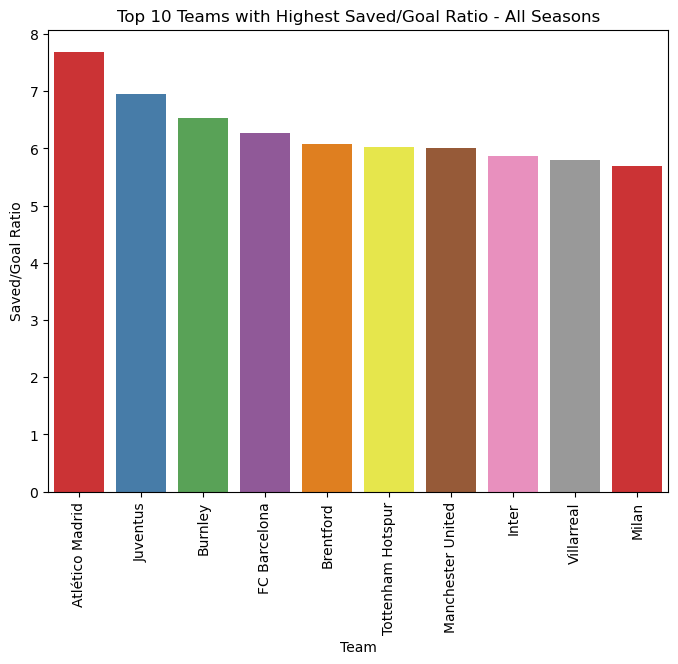

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/653977570.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




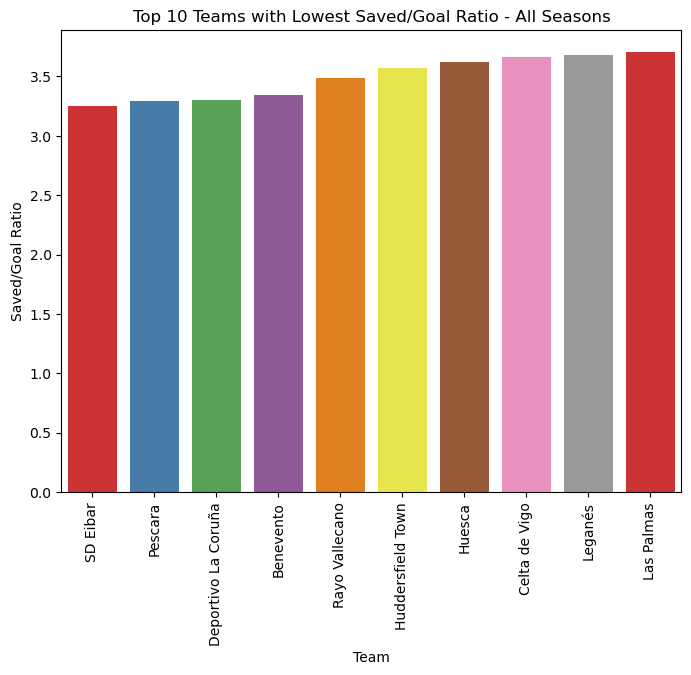

In [76]:
# Generate the plots for each season
for season in top_saved_goal_ratio['season'].unique():
    season_top_data = top_saved_goal_ratio[top_saved_goal_ratio['season'] == season]
    create_bar_plot(season_top_data, 'opponentTeam', 'saved_goal_ratio', f'Top 10 Teams with Highest Saved/Goal Ratio - Season {season}', 'Team', 'Saved/Goal Ratio', 'Set1')

    season_bottom_data = bottom_saved_goal_ratio[bottom_saved_goal_ratio['season'] == season]
    create_bar_plot(season_bottom_data, 'opponentTeam', 'saved_goal_ratio', f'Top 10 Teams with Lowest Saved/Goal Ratio - Season {season}', 'Team', 'Saved/Goal Ratio', 'Set1')

# Summary of top and bottom saved/goal ratio for all seasons
total_saved_goal_ratio = team_metrics.groupby('opponentTeam')['saved_goal_ratio'].mean().reset_index()
top_total_saved_goal_ratio = total_saved_goal_ratio.nlargest(10, 'saved_goal_ratio')
bottom_total_saved_goal_ratio = total_saved_goal_ratio.nsmallest(10, 'saved_goal_ratio')

# Plot overall top and bottom saved/goal ratio
create_bar_plot(top_total_saved_goal_ratio, 'opponentTeam', 'saved_goal_ratio', 'Top 10 Teams with Highest Saved/Goal Ratio - All Seasons', 'Team', 'Saved/Goal Ratio', 'Set1')
create_bar_plot(bottom_total_saved_goal_ratio, 'opponentTeam', 'saved_goal_ratio', 'Top 10 Teams with Lowest Saved/Goal Ratio - All Seasons', 'Team', 'Saved/Goal Ratio', 'Set1')

In [24]:
# Remove duplicate entries to get unique players by considering only unique combinations of player_id and season.
# Filter out the players who are under 20 years old from the unique players DataFrame.
unique_players = shots.drop_duplicates(subset=['player_id_striker', 'season'])
under_20_players = unique_players[unique_players['age_striker'] < 20.0]

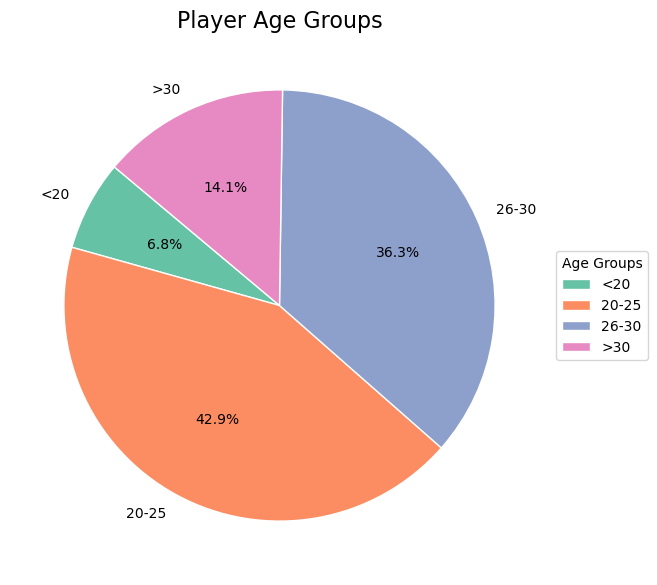

In [25]:
# Segment the players into different age groups for analysis.
under_20 = unique_players[unique_players['age_striker'] < 20.0]
age20_25 = unique_players[(unique_players['age_striker'] >= 20.0) & (unique_players['age_striker'] <= 25.0)]
age26_30 = unique_players[(unique_players['age_striker'] > 25.0) & (unique_players['age_striker'] <= 30.0)]
above_30 = unique_players[unique_players['age_striker'] > 30.0]

# Prepare the data for the pie chart by counting the number of players in each age group.
age_counts = [under_20['player_striker'].count(), age20_25['player_striker'].count(), age26_30['player_striker'].count(), above_30['player_striker'].count()]
age_labels = ['<20', '20-25', '26-30', '>30']

# Define the color palette
colors = sns.color_palette('Set2', len(age_labels))

# Create and display the pie chart showing the distribution of players across different age groups.
plt.figure(figsize=(10, 7))
plt.pie(age_counts, labels=age_labels, autopct='%.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='w'))

# Add a title
plt.title('Player Age Groups', fontsize=16)

# Add a legend
plt.legend(age_labels, title="Age Groups", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Display the chart
plt.show()

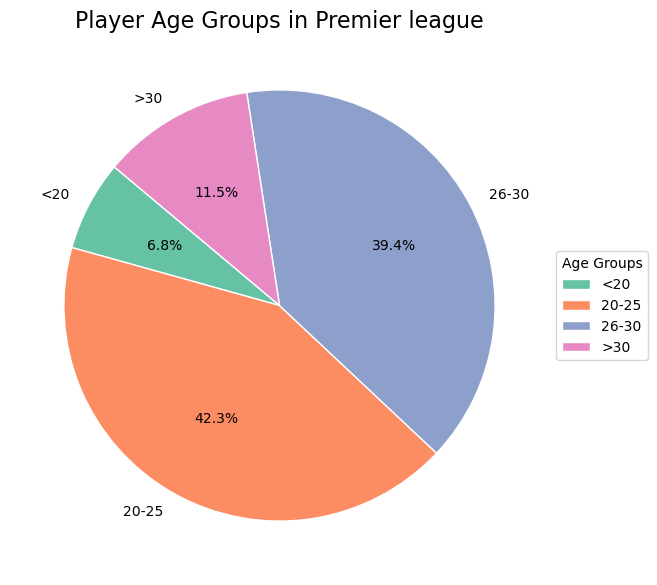

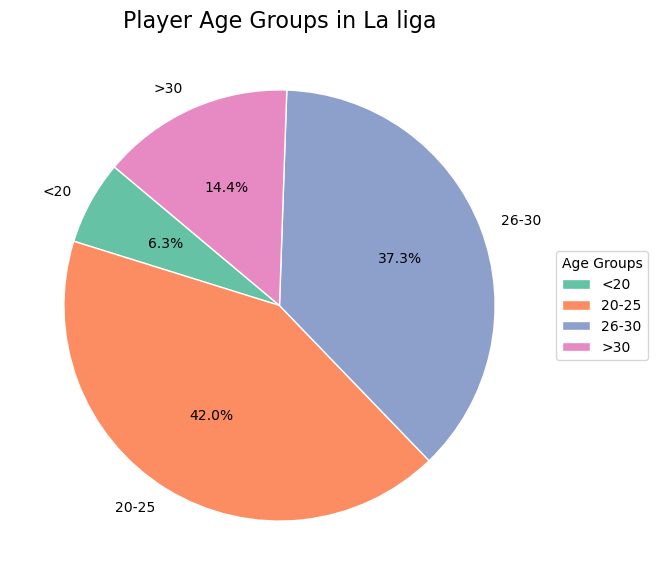

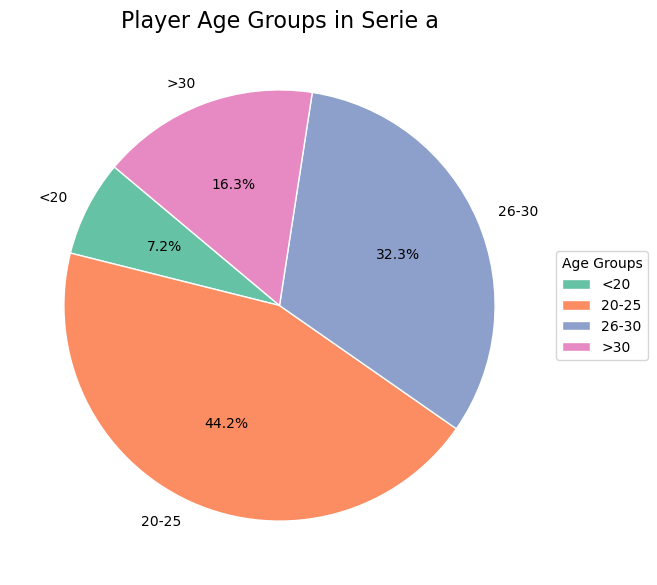

In [26]:
# Iterate over each unique league in the dataset to segment players by age within each league.
leagues = unique_players['league_name_striker'].unique()

for league in leagues:
    league_data = unique_players[unique_players['league_name_striker'] == league]
    
    # Define age groups
    under_20 = league_data[league_data['age_striker'] < 20.0]
    age20_25 = league_data[(league_data['age_striker'] >= 20.0) & (league_data['age_striker'] <= 25.0)]
    age26_30 = league_data[(league_data['age_striker'] > 25.0) & (league_data['age_striker'] <= 30.0)]
    above_30 = league_data[league_data['age_striker'] > 30.0]

    # Data for the pie chart
    age_counts = [under_20['player_striker'].count(), age20_25['player_striker'].count(), age26_30['player_striker'].count(), above_30['player_striker'].count()]
    age_labels = ['<20', '20-25', '26-30', '>30']

    # Define the color palette
    colors = sns.color_palette('Set2', len(age_labels))

    # Create the pie chart
    plt.figure(figsize=(10, 7))
    plt.pie(age_counts, labels=age_labels, autopct='%.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='w'))

    # Add a title
    plt.title(f'Player Age Groups in {league.capitalize()}', fontsize=16)

    # Add a legend
    plt.legend(age_labels, title="Age Groups", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Display the chart
    plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4173245489.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




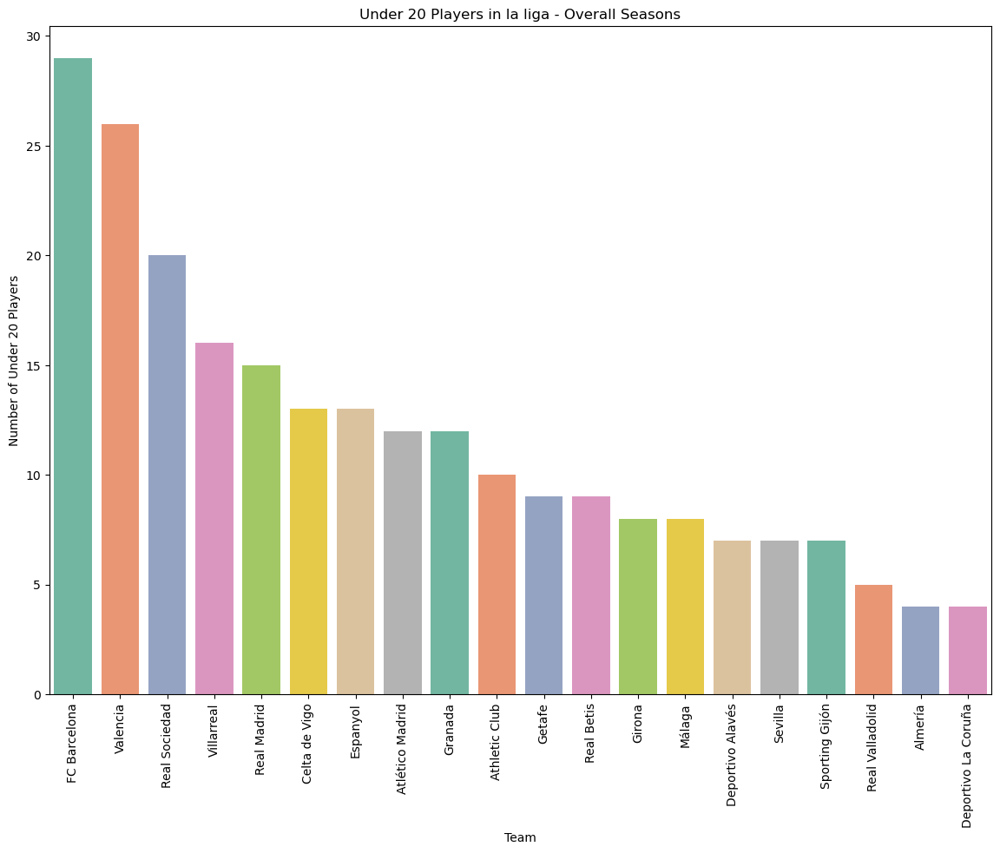

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4173245489.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




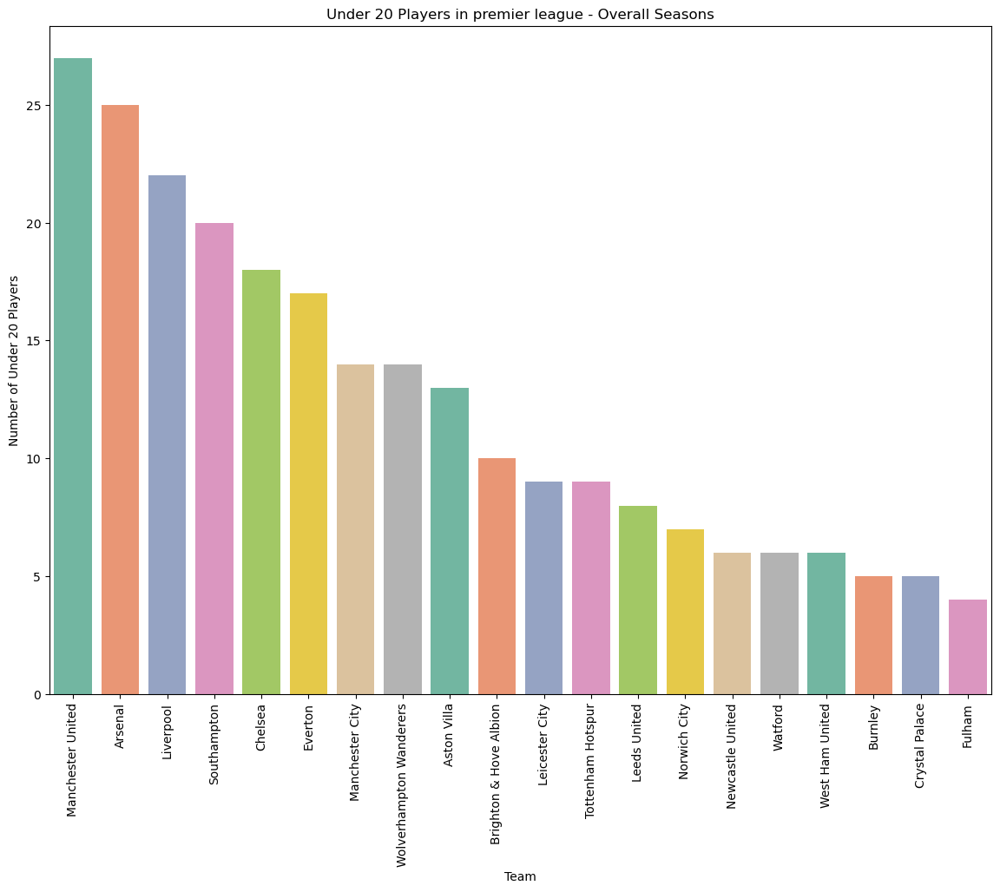

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/4173245489.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




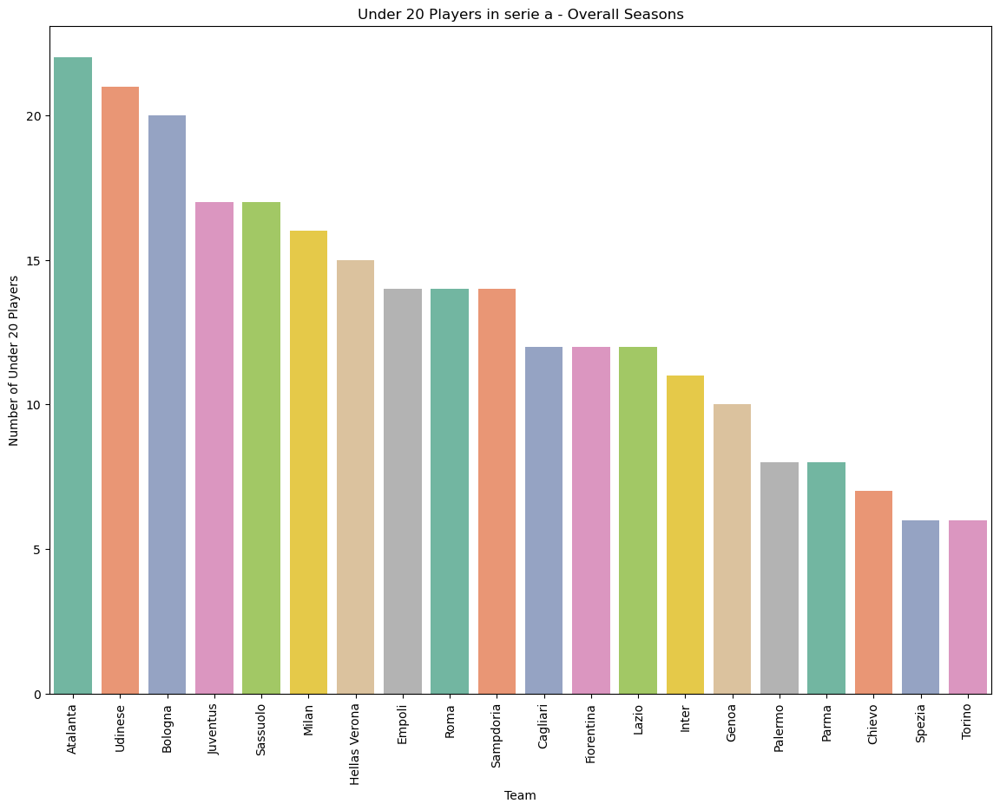

In [27]:
# Filter players under the age of 20 and group them by league and team to count the number of players per team.
under_20_players = unique_players[unique_players['age_striker'] < 20.0]

# Group by league and team, and count the number of players
overall_under_20_counts = under_20_players.groupby(['league_name_striker', 'playerTeam']).size().reset_index(name='under_20_player_count')

# Function to create bar plot
def create_bar_plot(df, x, y, title, xlabel, ylabel, palette):
    plt.figure(figsize=(14, 10))
    sns.barplot(data=df, x=x, y=y, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Iterate over each league to create plots
leagues = overall_under_20_counts['league_name_striker'].unique()
for league in leagues:
    league_data = overall_under_20_counts[overall_under_20_counts['league_name_striker'] == league]
    top_teams = league_data.nlargest(20, 'under_20_player_count')  # Select top 20 teams
    create_bar_plot(top_teams, 'playerTeam', 'under_20_player_count', 
                    f'Under 20 Players in {league} - Overall Seasons', 
                    'Team', 'Number of Under 20 Players', 'Set2')

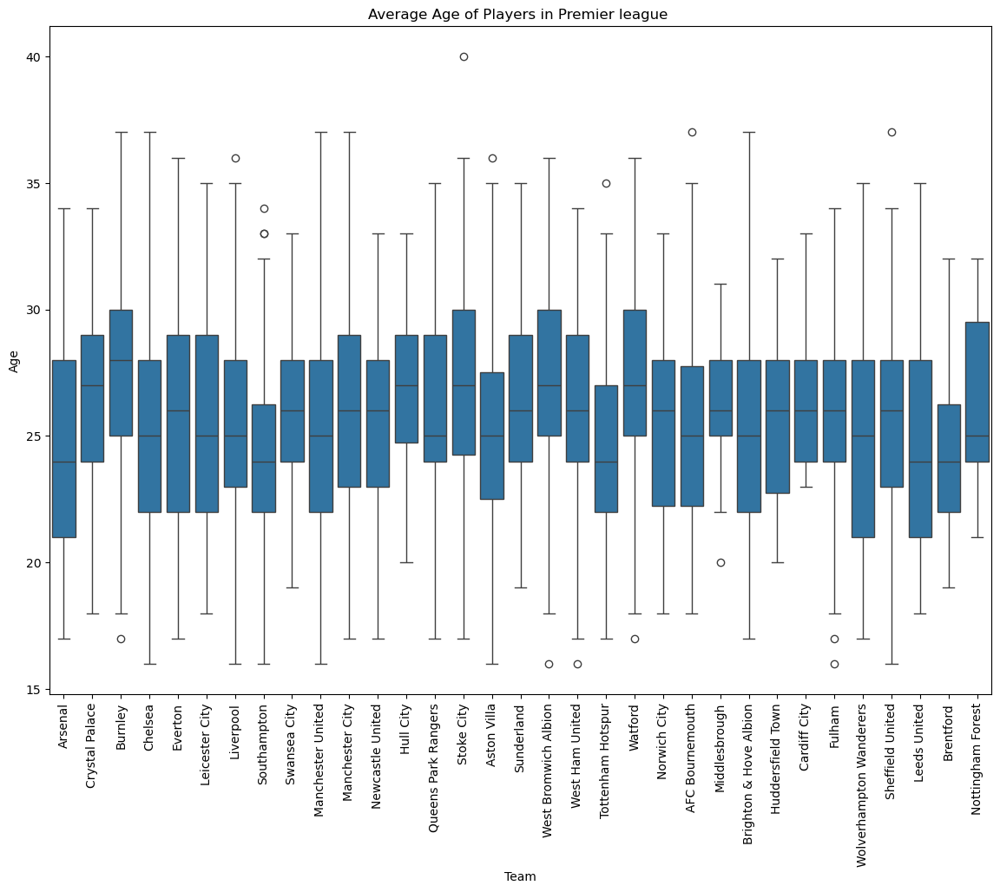

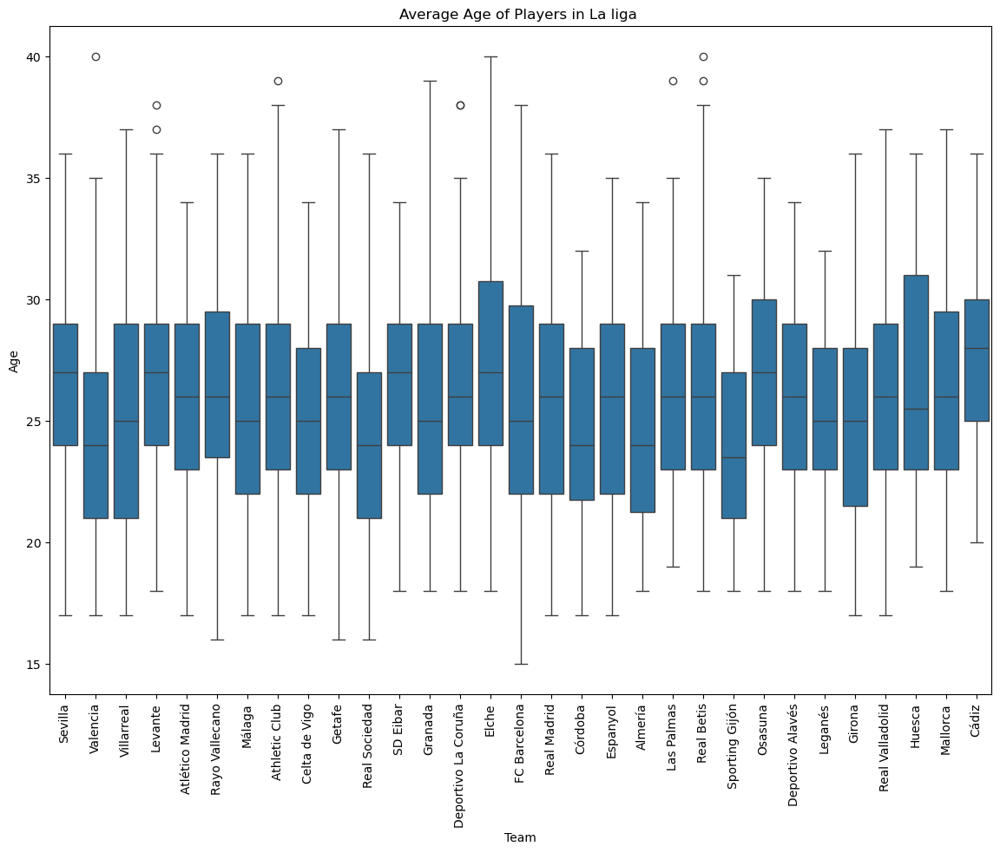

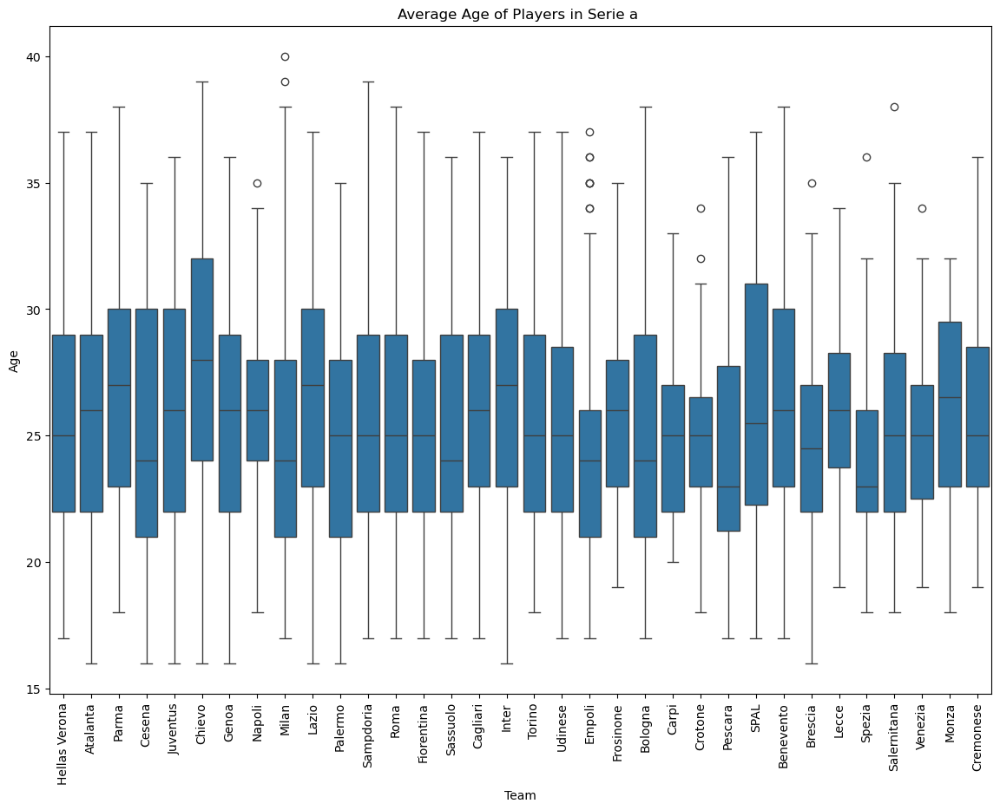

In [28]:
# Function to create a box plot to visualize the distribution of player ages per team.
# This will help to see the spread and average age of players for each team.
def create_violin_plot(df, x, y, title, xlabel, ylabel):
    plt.figure(figsize=(14, 10))
    sns.boxplot(x=x, y=y, data=df)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Iterate over each league to create plots
leagues = unique_players['league_name_striker'].unique()
for league in leagues:
    league_data = unique_players[unique_players['league_name_striker'] == league]
    create_violin_plot(league_data, 'playerTeam', 'age_striker', 
                       f'Average Age of Players in {league.capitalize()} ', 
                       'Team', 'Age')

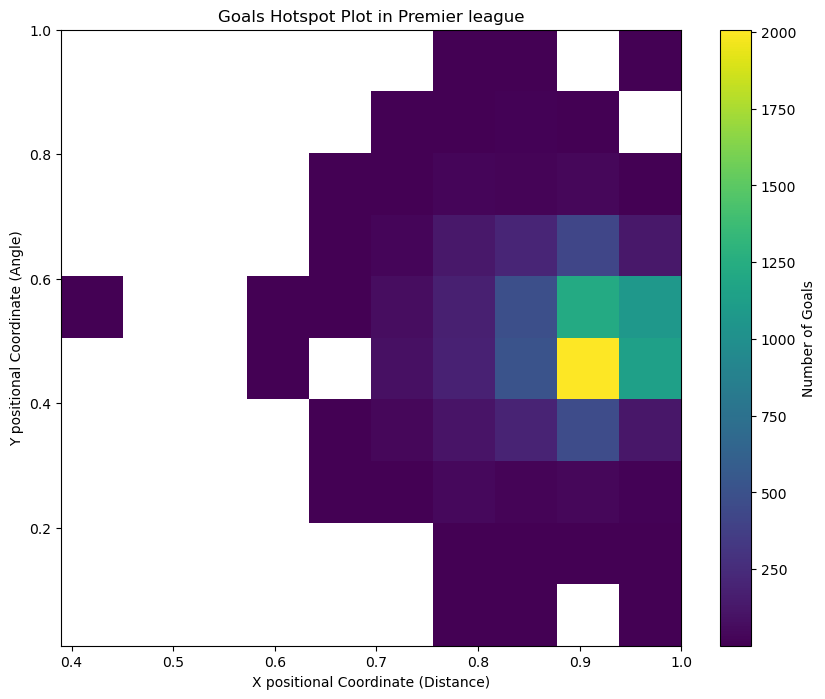

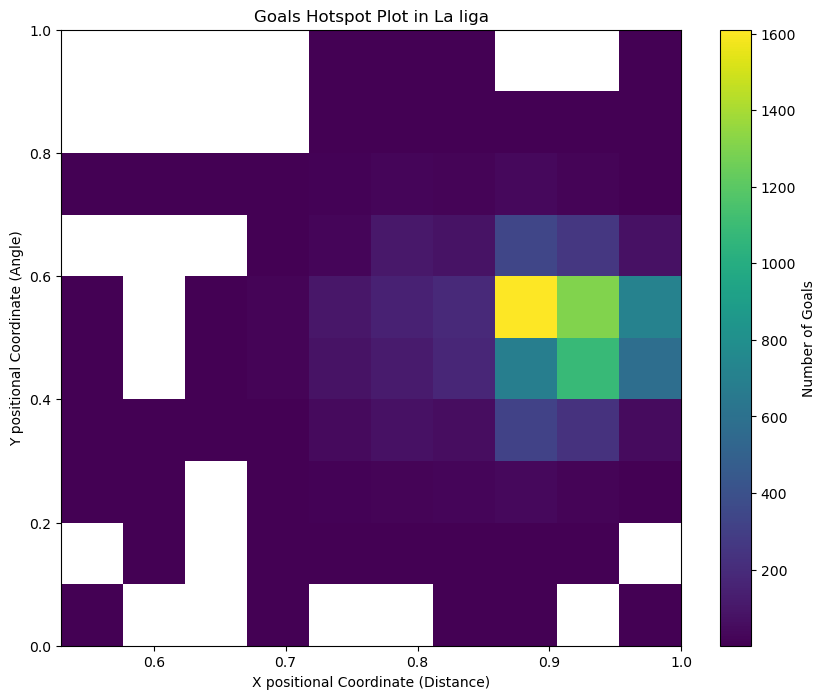

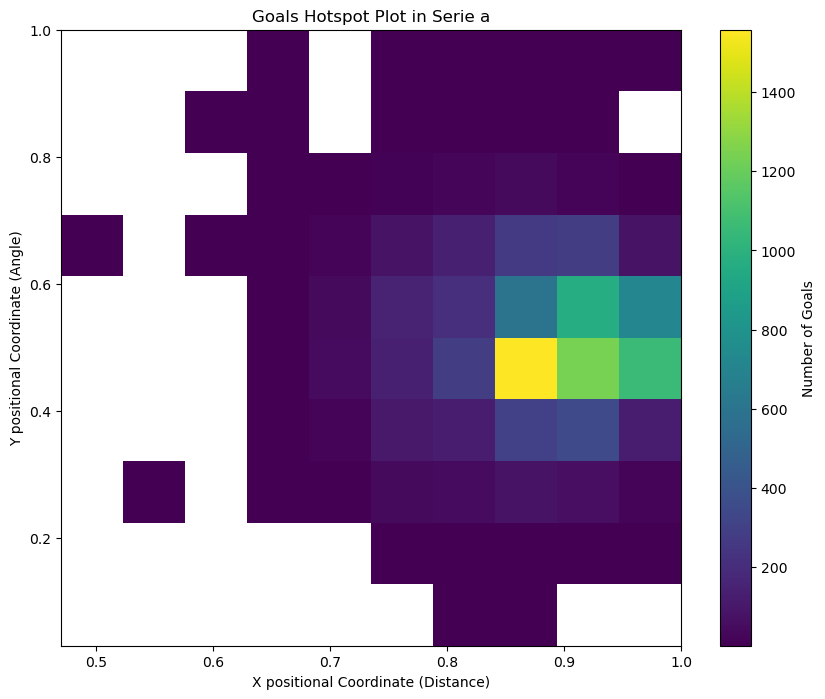

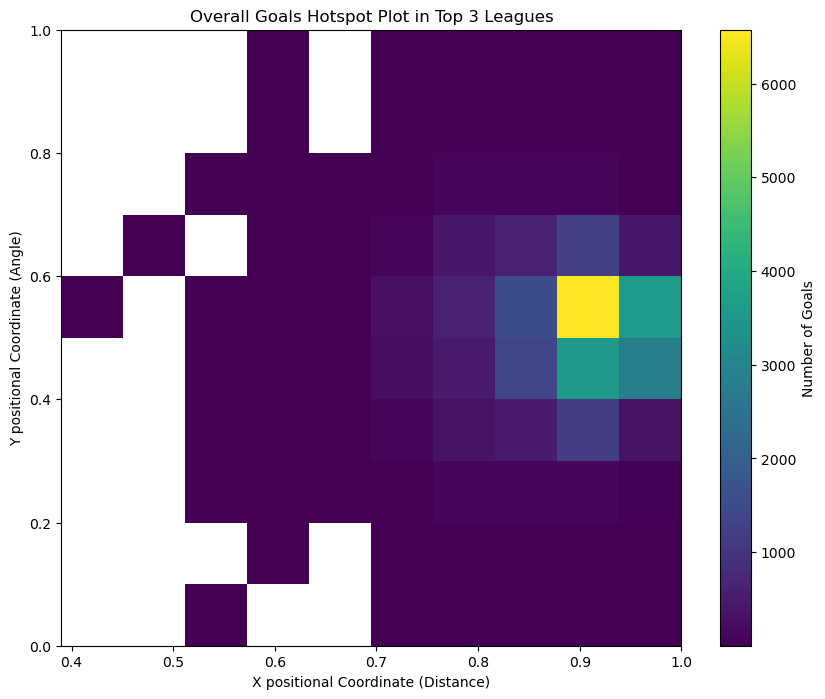

In [29]:
# Function to create a hotspot plot (2D histogram) showing the density of goals scored based on positional coordinates (X, Y).
# The plot visualizes where goals are most frequently scored on the pitch, highlighting high-density areas (hotspots).
def create_hotspot_plot(df, title):
    plt.figure(figsize=(10, 8))
    plt.hist2d(df["X"], df["Y"], bins=(10, 10), cmap="viridis", cmin=1)
    plt.colorbar(label="Number of Goals")
    plt.title(title)
    plt.xlabel("X positional Coordinate (Distance)")
    plt.ylabel("Y positional Coordinate (Angle)")
    plt.show()

# Filter goals data
hotspot_data_all_goals = shots[shots['is_goal'] == 1]

# Iterate over each league to create plots
leagues = hotspot_data_all_goals['league_name_striker'].unique()
for league in leagues:
    league_data = hotspot_data_all_goals[hotspot_data_all_goals['league_name_striker'] == league]
    create_hotspot_plot(league_data, f"Goals Hotspot Plot in {league.capitalize()}")

# Create overall hotspot plot
create_hotspot_plot(hotspot_data_all_goals, "Overall Goals Hotspot Plot in Top 3 Leagues")

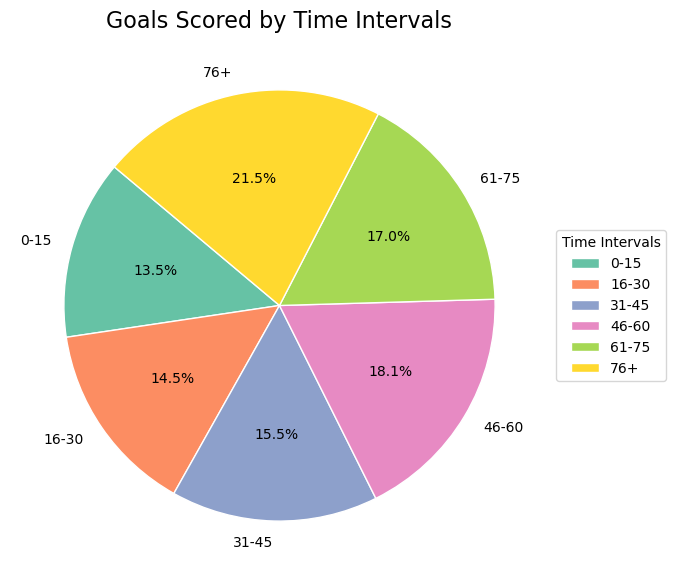

In [31]:
# Function to categorize minutes into different time intervals of a football match.
# The time intervals correspond to segments of the match such as '0-15', '16-30', etc.
def categorize_time(minute):
    if minute <= 15:
        return '0-15'
    elif minute <= 30:
        return '16-30'
    elif minute <= 45:
        return '31-45'
    elif minute <= 60:
        return '46-60'
    elif minute <= 75:
        return '61-75'
    else:
        return '76+'

# Filter goals and categorize the time intervals directly
# Count the number of goals in each time interval using the categorize_time function.
goal_counts = shots[shots['is_goal'] == 1]['minute'].apply(categorize_time).value_counts().sort_index()

# Data for the pie chart
labels = goal_counts.index
sizes = goal_counts.values
colors = sns.color_palette('Set2', len(labels))

# Create the pie chart
plt.figure(figsize=(10, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='w'))
plt.title('Goals Scored by Time Intervals', fontsize=16)
plt.legend(labels, title="Time Intervals", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Display the chart
plt.show()

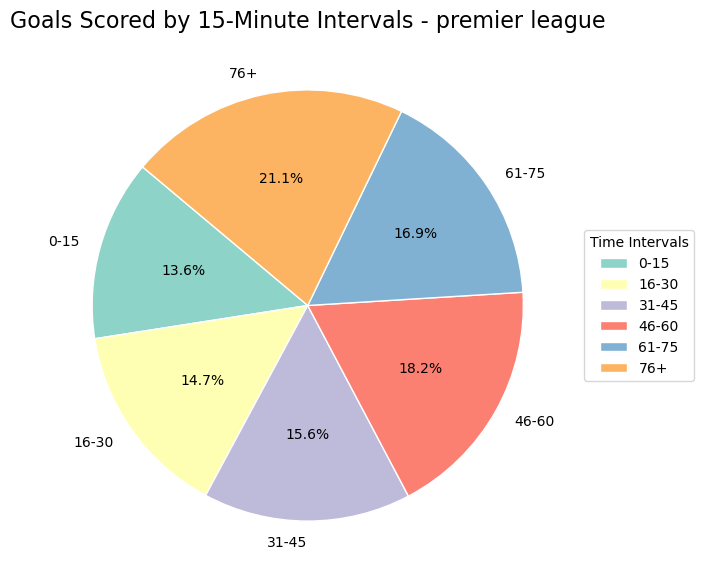

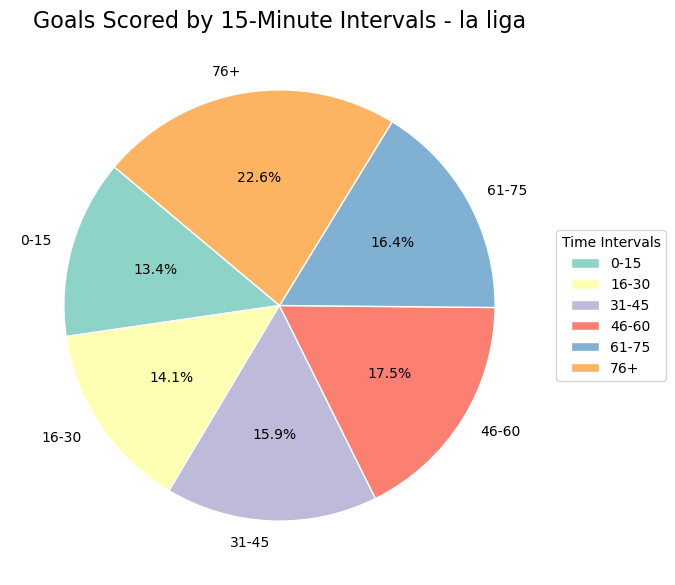

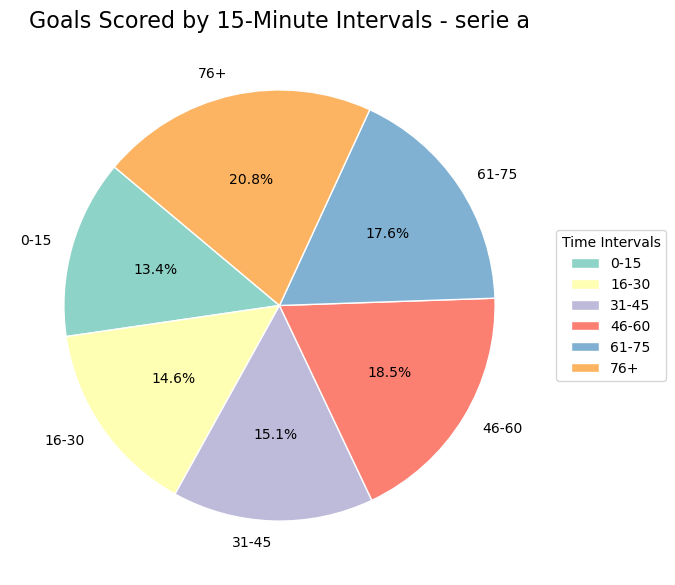

In [32]:
# Function to plot goals by 10-minute intervals for a given league
def plot_goals_by_intervals_for_league(shots, league):
    league_data = shots[(shots['is_goal'] == 1) & (shots['league_name_striker'] == league)]
    goal_counts = league_data['minute'].apply(categorize_time).value_counts().sort_index()

    # Data for the pie chart
    labels = goal_counts.index
    sizes = goal_counts.values
    colors = sns.color_palette('Set3', len(labels))

    # Create the pie chart
    plt.figure(figsize=(10, 7))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='w'))
    plt.title(f'Goals Scored by 15-Minute Intervals - {league}', fontsize=16)
    plt.legend(labels, title="Time Intervals", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Display the chart
    plt.show()

# Get the list of unique leagues
leagues = shots['league_name_striker'].unique()

# Plot for each league
for league in leagues:
    plot_goals_by_intervals_for_league(shots, league)

In [33]:
# Find the maximum minute recorded in the 'minute' column, representing the latest time a shot (or goal) was attempted in the dataset.
shots['minute'].max()

105

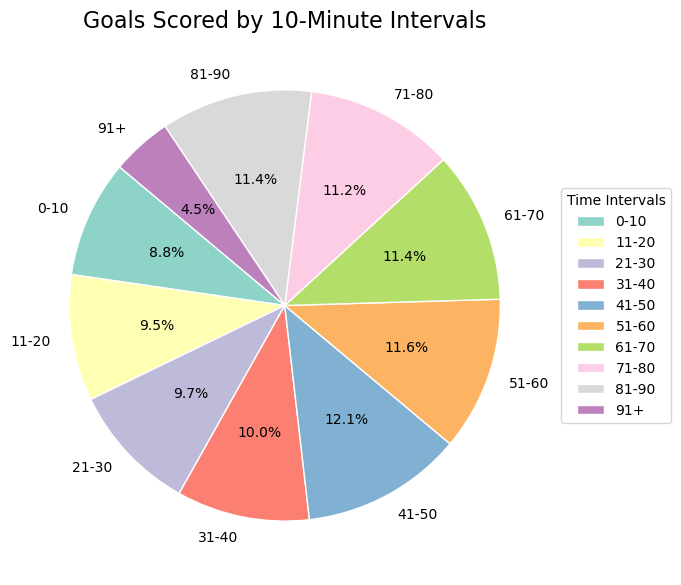

In [34]:
# Function to categorize minutes into different time intervals of a football match.
# The time intervals correspond to segments of the match such as '0-10', '11-20', etc.
def categorize_time(minute):
    if minute <= 10:
        return '0-10'
    elif minute <= 20:
        return '11-20'
    elif minute <= 30:
        return '21-30'
    elif minute <= 40:
        return '31-40'
    elif minute <= 50:
        return '41-50'
    elif minute <= 60:
        return '51-60'
    elif minute <= 70:
        return '61-70'
    elif minute <= 80:
        return '71-80'
    elif minute <= 90:
        return '81-90'
    else:
        return '91+'

# Filter goals and categorize the time intervals directly
goal_counts = shots[shots['is_goal'] == 1]['minute'].apply(categorize_time).value_counts().sort_index()

# Data for the pie chart
labels = goal_counts.index
sizes = goal_counts.values
colors = sns.color_palette('Set3', len(labels))

# Create the pie chart
plt.figure(figsize=(10, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='w'))
plt.title('Goals Scored by 10-Minute Intervals', fontsize=16)
plt.legend(labels, title="Time Intervals", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Display the chart
plt.show()

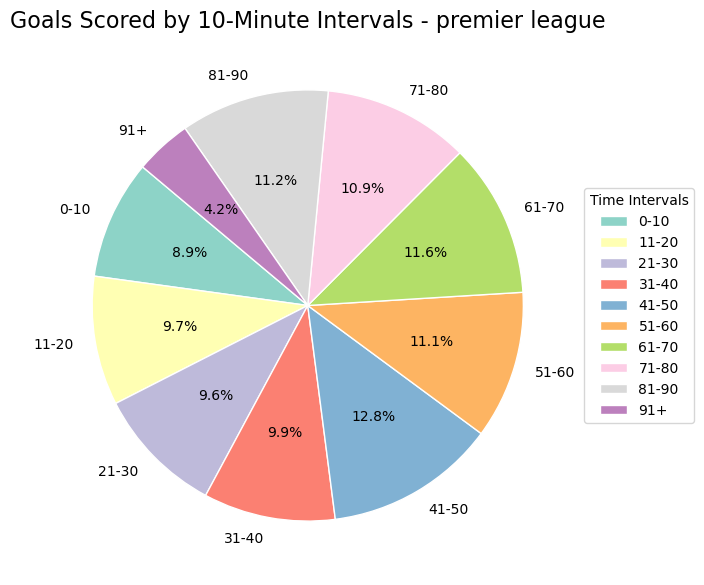

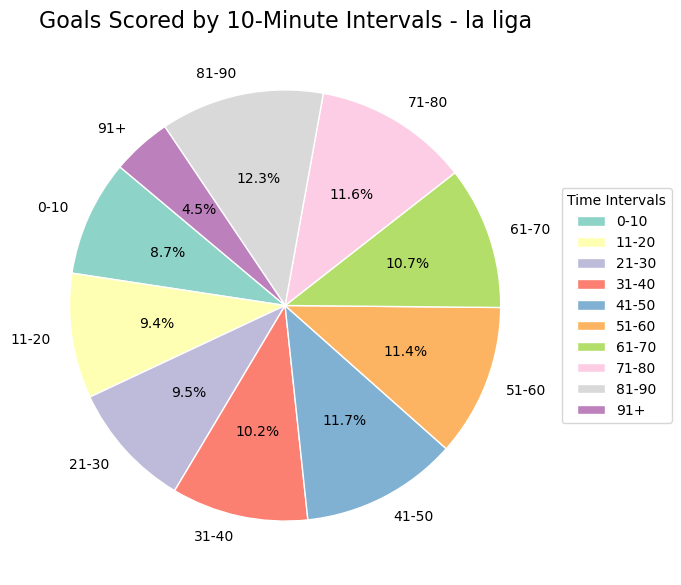

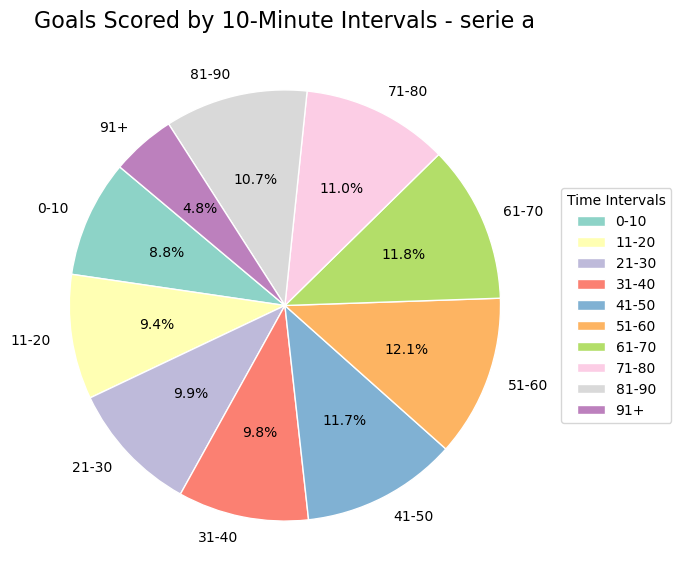

In [35]:
# Function to plot goals by 10-minute intervals for a given league
def plot_goals_by_intervals_for_league(shots, league):
    league_data = shots[(shots['is_goal'] == 1) & (shots['league_name_striker'] == league)]
    goal_counts = league_data['minute'].apply(categorize_time).value_counts().sort_index()

    # Data for the pie chart
    labels = goal_counts.index
    sizes = goal_counts.values
    colors = sns.color_palette('Set3', len(labels))

    # Create the pie chart
    plt.figure(figsize=(10, 7))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='w'))
    plt.title(f'Goals Scored by 10-Minute Intervals - {league}', fontsize=16)
    plt.legend(labels, title="Time Intervals", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Display the chart
    plt.show()

# Get the list of unique leagues
leagues = shots['league_name_striker'].unique()

# Plot for each league
for league in leagues:
    plot_goals_by_intervals_for_league(shots, league)

In [36]:
shots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257800 entries, 0 to 257799
Data columns (total 87 columns):
 #   Column                                Non-Null Count   Dtype         
---  ------                                --------------   -----         
 0   id                                    257800 non-null  int64         
 1   minute                                257800 non-null  int64         
 2   result                                257800 non-null  object        
 3   X                                     257800 non-null  float64       
 4   Y                                     257800 non-null  float64       
 5   xG                                    257800 non-null  float64       
 6   player_striker                        257800 non-null  object        
 7   h_a                                   257800 non-null  object        
 8   player_id_striker                     257800 non-null  int64         
 9   situation                             257800 non-null  obje

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1808284571.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




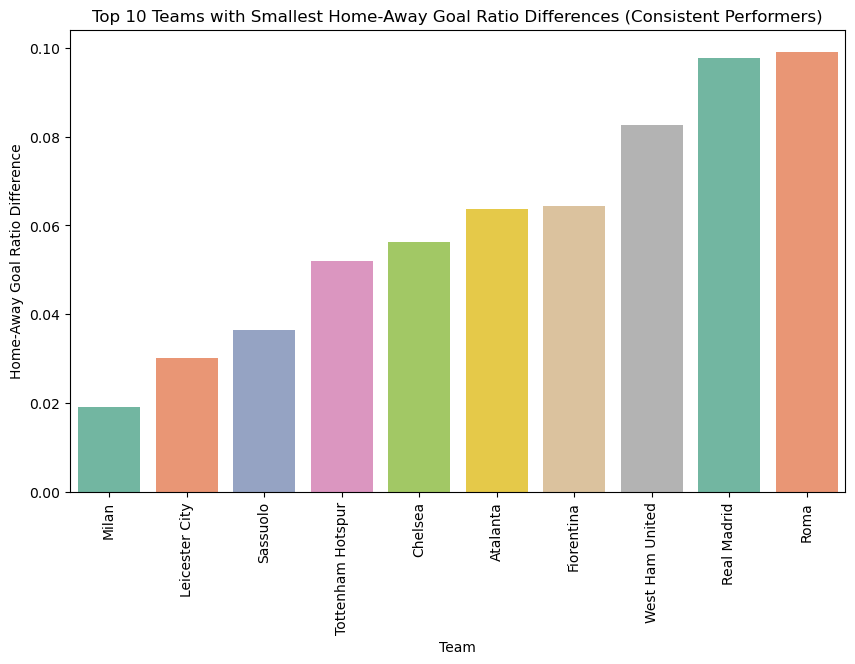

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1808284571.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




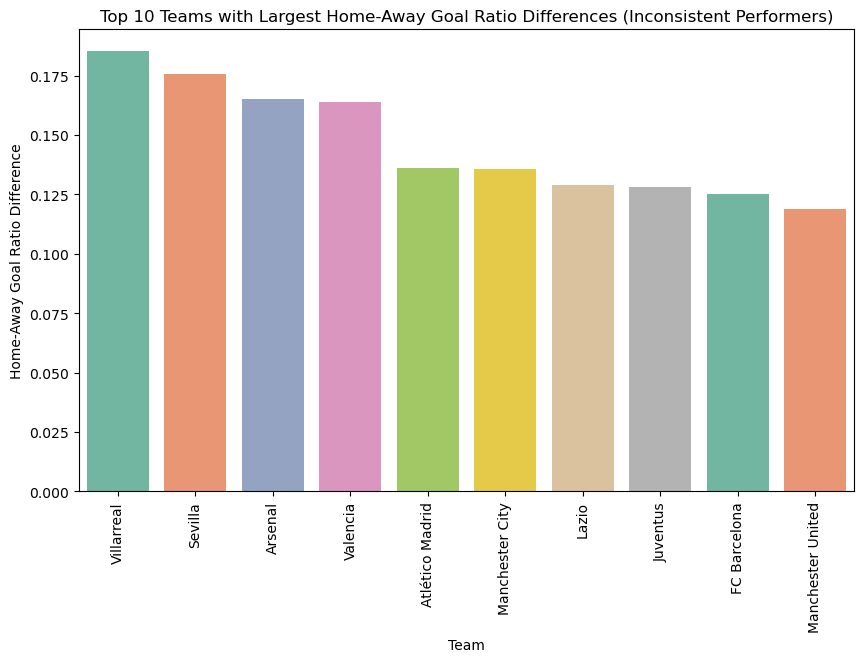

Teams with smallest home-away goal ratio differences (with more than 500 total goals):
                 team  home_goals  away_goals  total_goals  home_goal_ratio  \
57              Milan         266         256          522         0.509579   
50     Leicester City         257         242          499         0.515030   
79           Sassuolo         242         225          467         0.518201   
89  Tottenham Hotspur         314         283          597         0.525963   
18            Chelsea         300         268          568         0.528169   
4            Atalanta         309         272          581         0.531842   
32         Fiorentina         256         225          481         0.532225   
96    West Ham United         249         211          460         0.541304   
71        Real Madrid         421         346          767         0.548892   
74               Roma         327         268          595         0.549580   

    away_goal_ratio  goal_ratio_difference 

In [37]:
""""# Calculate the number of home and away goals for each team by grouping the data by 'playerTeam' 
# and summing the goals based on whether the team was playing at home or away.
def calculate_home_away_goals(shots):
    home_goals = shots[shots['is_home'] == 1].groupby(['playerTeam'])['is_goal'].sum().reset_index()
    away_goals = shots[shots['is_home'] == 0].groupby(['playerTeam'])['is_goal'].sum().reset_index()

    home_goals.columns = ['team', 'home_goals']
    away_goals.columns = ['team', 'away_goals']

    team_goals = pd.merge(home_goals, away_goals, on='team')
    team_goals['total_goals'] = team_goals['home_goals'] + team_goals['away_goals']

    return team_goals

# Calculate the ratio of home goals and away goals to total goals for each team.
# Also calculate the absolute difference between home and away goal ratios to measure consistency.
def calculate_goal_ratios(team_goals):
    team_goals['home_goal_ratio'] = team_goals['home_goals'] / team_goals['total_goals']
    team_goals['away_goal_ratio'] = team_goals['away_goals'] / team_goals['total_goals']
    team_goals['goal_ratio_difference'] = abs(team_goals['home_goal_ratio'] - team_goals['away_goal_ratio'])
    return team_goals

# Identify the top 10 teams with the smallest (most consistent) and largest (most inconsistent) 
# home-away goal ratio differences for teams with more than 450 total goals.
def identify_consistent_teams(team_goals, top_n=10):
    filtered_teams = team_goals[team_goals['total_goals'] > 450]
    consistent_teams = filtered_teams.nsmallest(top_n, 'goal_ratio_difference')
    inconsistent_teams = filtered_teams.nlargest(top_n, 'goal_ratio_difference')
    return consistent_teams, inconsistent_teams

# Plotting function
def create_bar_plot(df, x, y, title, xlabel, ylabel, palette):
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x=x, y=y, palette='Set2')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Calculate home and away goals
team_goals = calculate_home_away_goals(shots)

# Calculate the home and away goal ratios and the difference between them for each team.
team_goals_with_ratios = calculate_goal_ratios(team_goals)

# Identify the top 10 most consistent and inconsistent teams based on home-away goal ratio differences.
consistent_teams, inconsistent_teams = identify_consistent_teams(team_goals_with_ratios, top_n=10)

# Plot top 10 consistent teams
create_bar_plot(consistent_teams, 'team', 'goal_ratio_difference', 
                'Top 10 Teams with Smallest Home-Away Goal Ratio Differences (Consistent Performers)', 
                'Team', 'Home-Away Goal Ratio Difference', 'Blues_d')

# Plot top 10 inconsistent teams
create_bar_plot(inconsistent_teams, 'team', 'goal_ratio_difference', 
                'Top 10 Teams with Largest Home-Away Goal Ratio Differences (Inconsistent Performers)', 
                'Team', 'Home-Away Goal Ratio Difference', 'Reds_d')

# Display teams with smallest home-away goal ratio differences
print("Teams with smallest home-away goal ratio differences (with more than 500 total goals):")
print(consistent_teams)

# Display teams with largest home-away goal ratio differences
print("Teams with largest home-away goal ratio differences (with more than 500 total goals):")
print(inconsistent_teams)""""

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




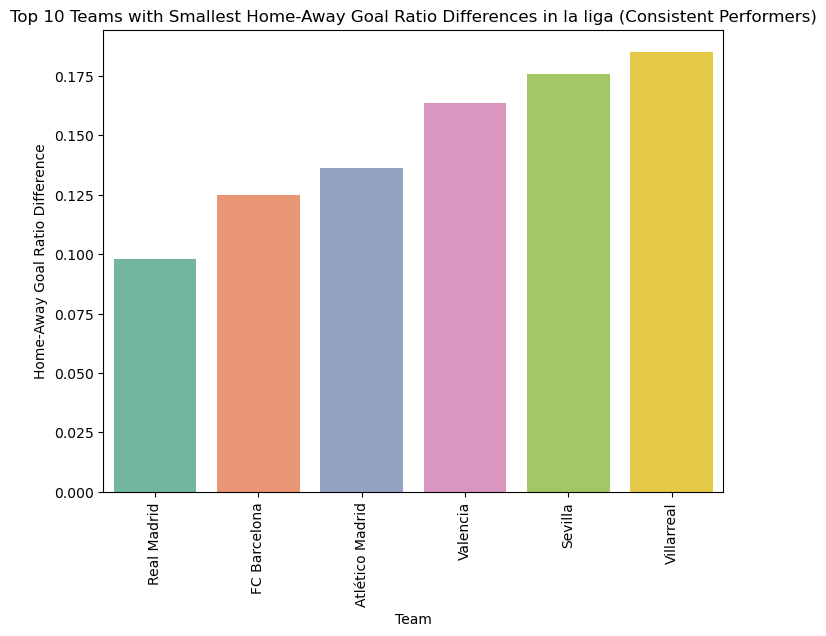

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




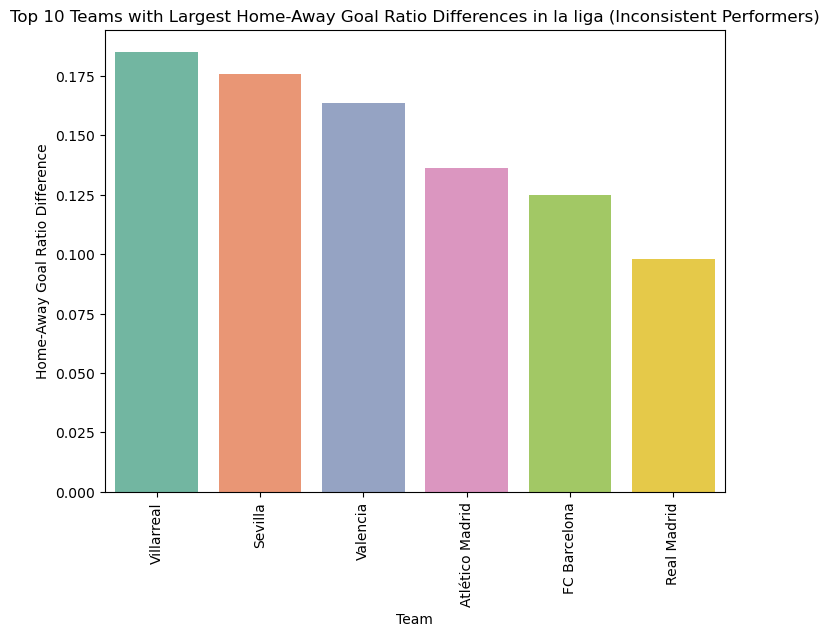

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Teams with smallest home-away goal ratio differences in la liga (with more than 500 total goals):
     league             team  home_goals  away_goals  total_goals  \
23  la liga      Real Madrid         421         346          767   
10  la liga     FC Barcelona         459         357          816   
2   la liga  Atlético Madrid         313         238          551   
29  la liga         Valencia         263         189          452   
27  la liga          Sevilla         291         204          495   
30  la liga       Villarreal         288         198          486   

    home_goal_ratio  away_goal_ratio  goal_ratio_difference  
23         0.548892         0.451108               0.097784  
10         0.562500         0.437500               0.125000  
2          0.568058         0.431942               0.136116  
29         0.581858         0.418142               0.163717  
27         0.587879         0.412121               0.175758  
30         0.592593         0.407407          

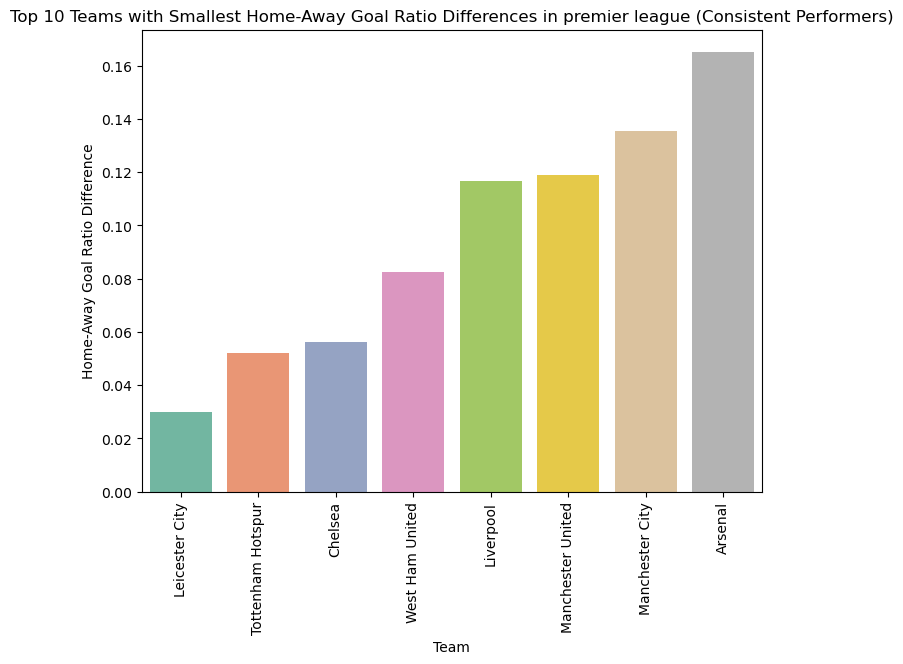

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




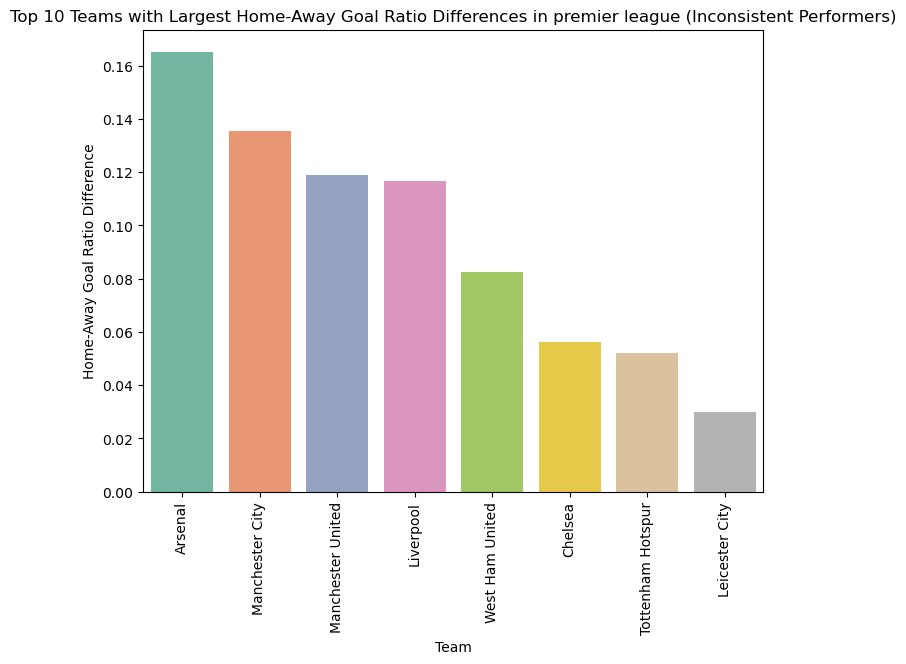

Teams with smallest home-away goal ratio differences in premier league (with more than 500 total goals):
            league               team  home_goals  away_goals  total_goals  \
45  premier league     Leicester City         257         242          499   
59  premier league  Tottenham Hotspur         314         283          597   
38  premier league            Chelsea         300         268          568   
62  premier league    West Ham United         249         211          460   
46  premier league          Liverpool         373         295          668   
48  premier league  Manchester United         301         237          538   
47  premier league    Manchester City         448         341          789   
32  premier league            Arsenal         349         250          599   

    home_goal_ratio  away_goal_ratio  goal_ratio_difference  
45         0.515030         0.484970               0.030060  
59         0.525963         0.474037               0.051926  
38    

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




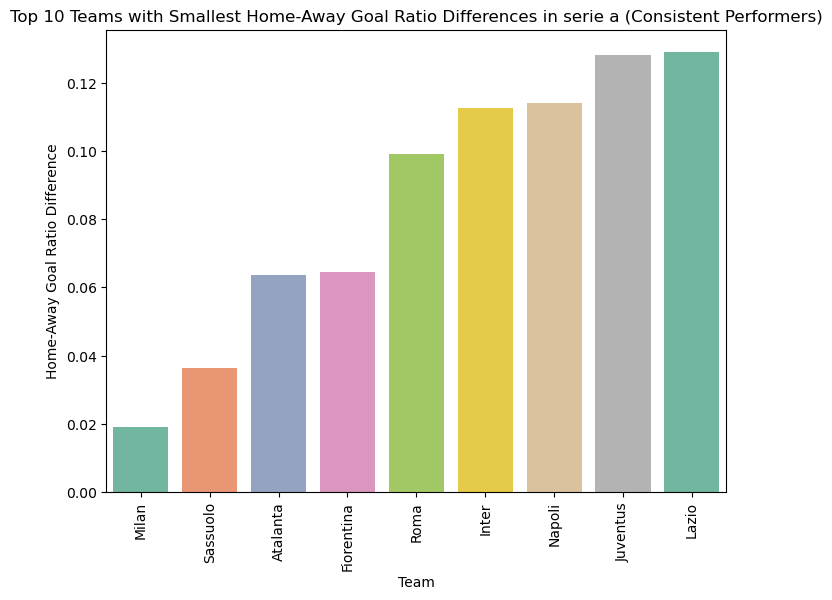

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




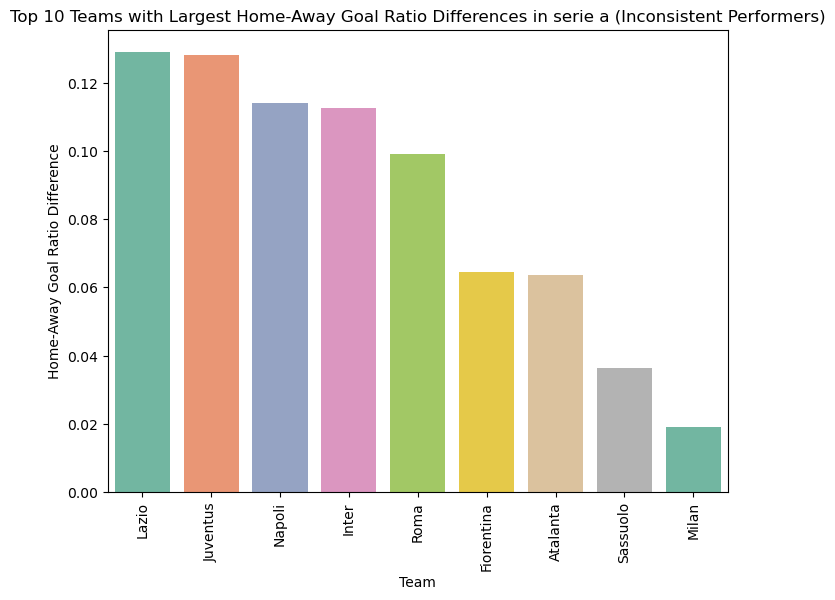

Teams with smallest home-away goal ratio differences in serie a (with more than 500 total goals):
     league        team  home_goals  away_goals  total_goals  home_goal_ratio  \
83  serie a       Milan         266         256          522         0.509579   
93  serie a    Sassuolo         242         225          467         0.518201   
64  serie a    Atalanta         309         272          581         0.531842   
75  serie a  Fiorentina         256         225          481         0.532225   
89  serie a        Roma         327         268          595         0.549580   
79  serie a       Inter         341         272          613         0.556281   
85  serie a      Napoli         376         299          675         0.557037   
80  serie a    Juventus         352         272          624         0.564103   
81  serie a       Lazio         341         263          604         0.564570   

    away_goal_ratio  goal_ratio_difference  
83         0.490421               0.019157  
9

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




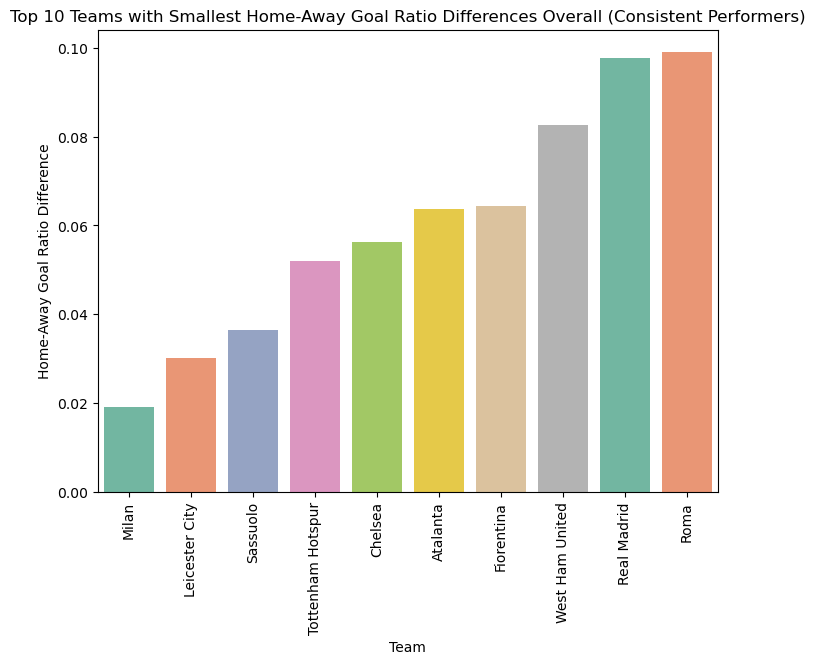

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/1967916167.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




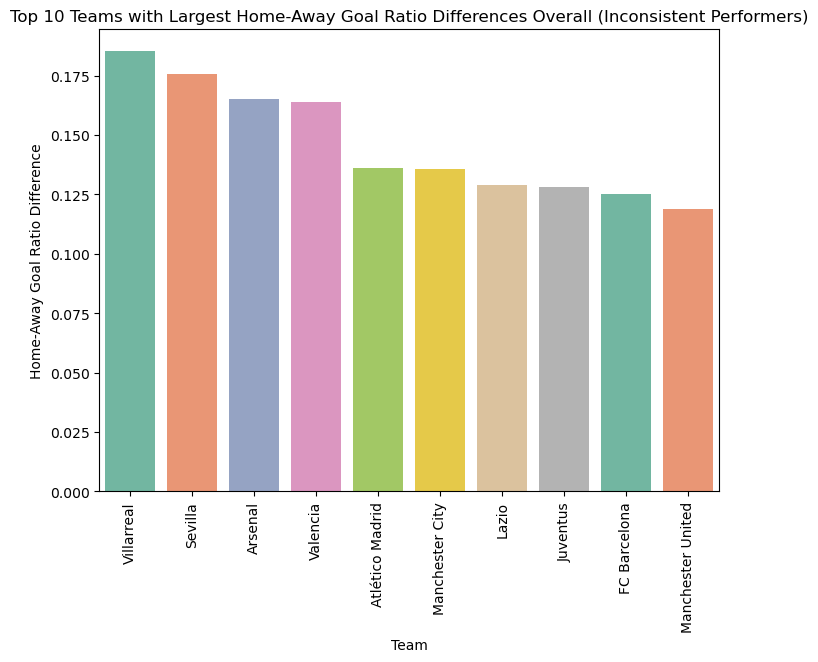

Teams with smallest home-away goal ratio differences overall (with more than 500 total goals):
                 team  home_goals  away_goals  total_goals  home_goal_ratio  \
57              Milan         266         256          522         0.509579   
50     Leicester City         257         242          499         0.515030   
79           Sassuolo         242         225          467         0.518201   
89  Tottenham Hotspur         314         283          597         0.525963   
18            Chelsea         300         268          568         0.528169   
4            Atalanta         309         272          581         0.531842   
32         Fiorentina         256         225          481         0.532225   
96    West Ham United         249         211          460         0.541304   
71        Real Madrid         421         346          767         0.548892   
74               Roma         327         268          595         0.549580   

    away_goal_ratio  goal_ratio_dif

In [38]:
# Calculate home and away goals for each team in each league.
# Groups the data by league and team, summing the goals for both home and away games.
def calculate_home_away_goals(shots):
    home_goals = shots[shots['is_home'] == 1].groupby(['league_name_striker', 'playerTeam'])['is_goal'].sum().reset_index()
    away_goals = shots[shots['is_home'] == 0].groupby(['league_name_striker', 'playerTeam'])['is_goal'].sum().reset_index()

    home_goals.columns = ['league', 'team', 'home_goals']
    away_goals.columns = ['league', 'team', 'away_goals']

    team_goals = pd.merge(home_goals, away_goals, on=['league', 'team'])
    team_goals['total_goals'] = team_goals['home_goals'] + team_goals['away_goals']

    return team_goals


# Calculate the home and away goal ratios as well as the difference between them for each team.
# This helps measure how balanced teams are in scoring goals at home and away.
def calculate_goal_ratios(team_goals):
    team_goals['home_goal_ratio'] = team_goals['home_goals'] / team_goals['total_goals']
    team_goals['away_goal_ratio'] = team_goals['away_goals'] / team_goals['total_goals']
    team_goals['goal_ratio_difference'] = abs(team_goals['home_goal_ratio'] - team_goals['away_goal_ratio'])
    return team_goals

# Identify the most consistent (smallest goal ratio difference) and inconsistent (largest goal ratio difference) teams.
# Only considers teams with more than 450 total goals.
def identify_consistent_teams(team_goals, top_n=10):
    filtered_teams = team_goals[team_goals['total_goals'] > 450]
    consistent_teams = filtered_teams.nsmallest(top_n, 'goal_ratio_difference')
    inconsistent_teams = filtered_teams.nlargest(top_n, 'goal_ratio_difference')
    return consistent_teams, inconsistent_teams

# Plotting function
def create_bar_plot(df, x, y, title, xlabel, ylabel):
    plt.figure(figsize=(8, 6))
    sns.barplot(data=df, x=x, y=y, palette='Set2')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Calculate home and away goals
team_goals = calculate_home_away_goals(shots)

# Calculate the goal ratios and differences for each team.
team_goals_with_ratios = calculate_goal_ratios(team_goals)

# Plot for each league
leagues = team_goals_with_ratios['league'].unique()
for league in leagues:
    league_team_goals = team_goals_with_ratios[team_goals_with_ratios['league'] == league]

    # Identify teams with smallest home-away goal ratio differences and more than 500 total goals
    consistent_teams, inconsistent_teams = identify_consistent_teams(league_team_goals, top_n=10)

    # Plot top 10 consistent teams
    create_bar_plot(consistent_teams, 'team', 'goal_ratio_difference', 
                    f'Top 10 Teams with Smallest Home-Away Goal Ratio Differences in {league} (Consistent Performers)', 
                    'Team', 'Home-Away Goal Ratio Difference')

    # Plot top 10 inconsistent teams
    create_bar_plot(inconsistent_teams, 'team', 'goal_ratio_difference', 
                    f'Top 10 Teams with Largest Home-Away Goal Ratio Differences in {league} (Inconsistent Performers)', 
                    'Team', 'Home-Away Goal Ratio Difference')

    # Display teams with smallest home-away goal ratio differences
    print(f"Teams with smallest home-away goal ratio differences in {league} (with more than 500 total goals):")
    print(consistent_teams)

    # Display teams with largest home-away goal ratio differences
    print(f"Teams with largest home-away goal ratio differences in {league} (with more than 500 total goals):")
    print(inconsistent_teams)

# Overall analysis: Calculate the total home, away, and overall goals across all leagues for each team.
overall_team_goals = team_goals_with_ratios.groupby('team').agg({
    'home_goals': 'sum',
    'away_goals': 'sum',
    'total_goals': 'sum'
}).reset_index()

# Calculate overall home and away goal ratios and differences for each team.
overall_team_goals['home_goal_ratio'] = overall_team_goals['home_goals'] / overall_team_goals['total_goals']
overall_team_goals['away_goal_ratio'] = overall_team_goals['away_goals'] / overall_team_goals['total_goals']
overall_team_goals['goal_ratio_difference'] = abs(overall_team_goals['home_goal_ratio'] - overall_team_goals['away_goal_ratio'])

# Identify and plot the most consistent and inconsistent teams overall across all leagues.
consistent_teams_overall, inconsistent_teams_overall = identify_consistent_teams(overall_team_goals, top_n=10)

create_bar_plot(consistent_teams_overall, 'team', 'goal_ratio_difference', 
                'Top 10 Teams with Smallest Home-Away Goal Ratio Differences Overall (Consistent Performers)', 
                'Team', 'Home-Away Goal Ratio Difference')

create_bar_plot(inconsistent_teams_overall, 'team', 'goal_ratio_difference', 
                'Top 10 Teams with Largest Home-Away Goal Ratio Differences Overall (Inconsistent Performers)', 
                'Team', 'Home-Away Goal Ratio Difference')

# Display teams with smallest home-away goal ratio differences overall
print("Teams with smallest home-away goal ratio differences overall (with more than 500 total goals):")
print(consistent_teams_overall)

# Display teams with largest home-away goal ratio differences overall
print("Teams with largest home-away goal ratio differences overall (with more than 500 total goals):")
print(inconsistent_teams_overall)

Overall Best Teams:
         playerTeam  goals_hit  goals_defended  goal_ratio
54  Manchester City        789            1287    0.383161
31     FC Barcelona        816            1605    0.336018
52        Liverpool        668            1486    0.312055
71      Real Madrid        767            1756    0.300772
60           Napoli        675            1632    0.294582
44         Juventus        624            1815    0.260446
18          Chelsea        568            1687    0.256620
43            Inter        613            1862    0.247094
6   Atlético Madrid        551            1761    0.240968
4          Atalanta        581            1852    0.240751

Best Teams per League:
   league_name_striker         playerTeam  goals_hit  goals_defended  \
0              la liga       FC Barcelona        816            1605   
1              la liga        Real Madrid        767            1756   
2              la liga    Atlético Madrid        551            1761   
3              la l

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/3784693773.py:35: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/3784693773.py:46: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




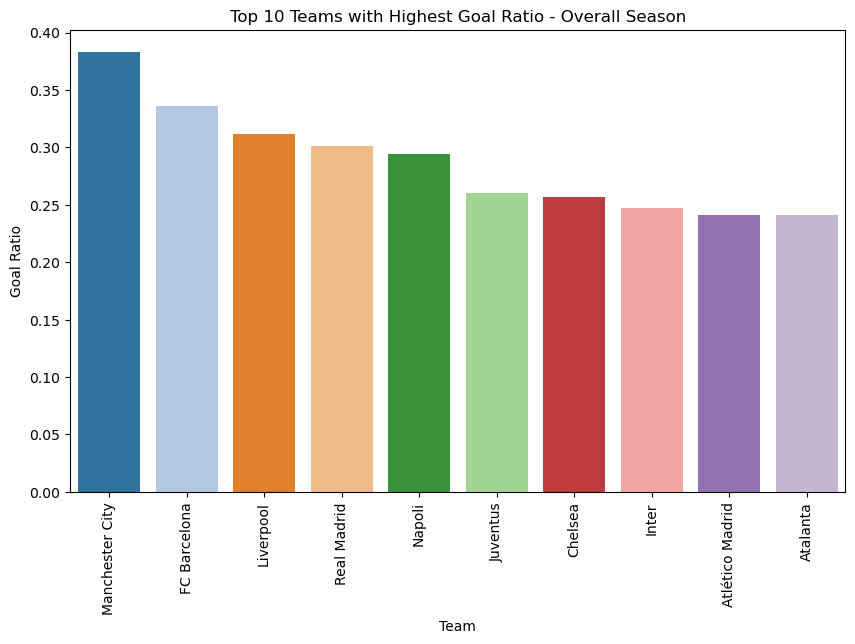

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/3784693773.py:46: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




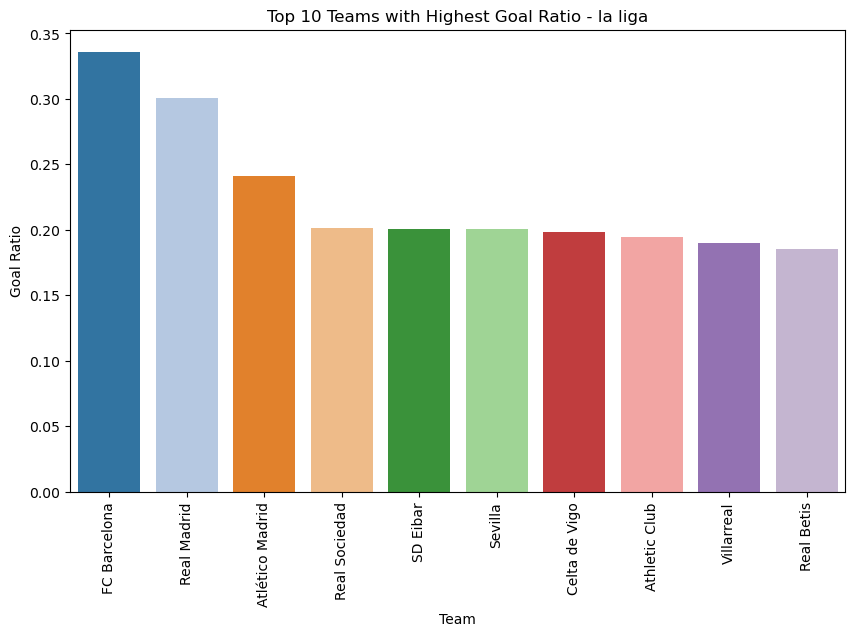

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/3784693773.py:46: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




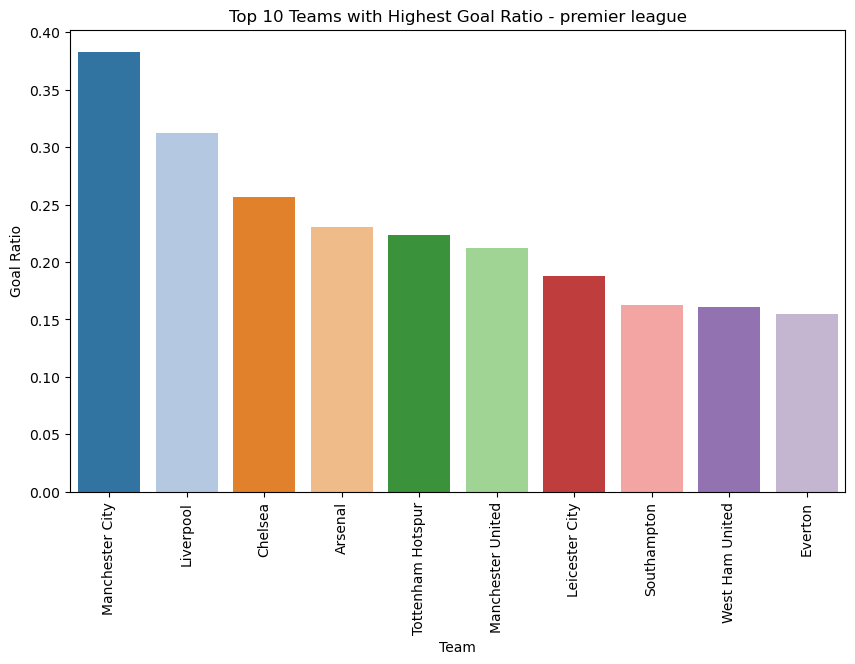

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/3784693773.py:46: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




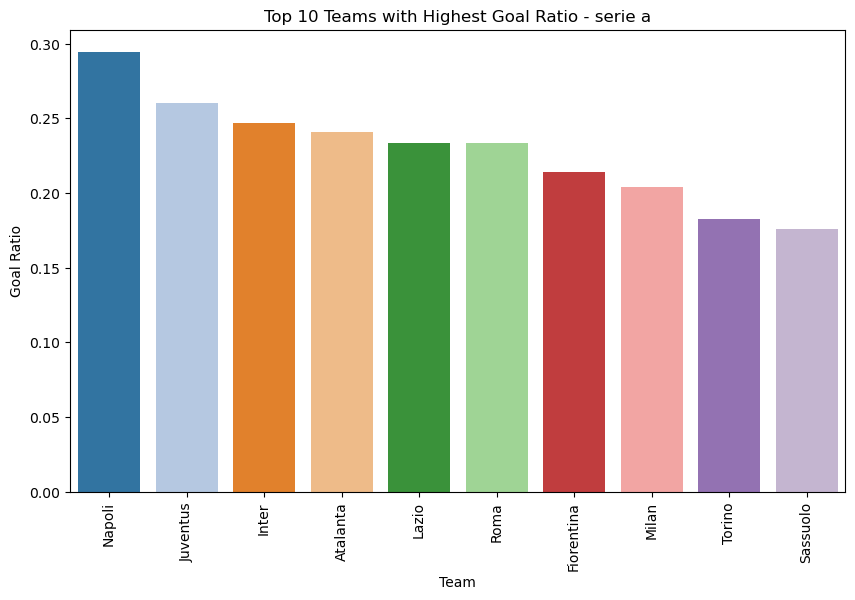

In [86]:
# Calculate goals hit and defended for each team per season and league.
# 'goals_hit' counts the goals scored by a team, and 'goals_defended' counts the defended shots (blocked/saved) by their opponent.
# The goal ratio is calculated as goals hit divided by the total number of goals hit and defended.
def calculate_goals_metrics(shots):
    goals_hit = shots[shots['is_goal'] == 1].groupby(['season', 'league_name_striker', 'playerTeam']).size().reset_index(name='goals_hit')
    goals_defended = shots[(shots['result'] == 'BlockedShot') | (shots['result'] == 'SavedShot')].groupby(['season', 'league_name_striker', 'opponentTeam']).size().reset_index(name='goals_defended')
    
    goals_metrics = pd.merge(goals_hit, goals_defended, left_on=['season', 'league_name_striker', 'playerTeam'], right_on=['season', 'league_name_striker', 'opponentTeam'], how='outer').fillna(0)
    goals_metrics['goal_ratio'] = goals_metrics['goals_hit'] / (goals_metrics['goals_defended'] + goals_metrics['goals_hit'])
    
    return goals_metrics

# Calculate aggregated metrics such as total goals hit, defended, and the goal ratio for each team over the entire season.
goals_metrics = calculate_goals_metrics(shots)

# Group by team to get the overall metrics and by league to analyze team performance within each league.
overall_metrics = goals_metrics.groupby('playerTeam').agg({
    'goals_hit': 'sum',
    'goals_defended': 'sum',
    'goal_ratio': 'mean'
}).reset_index()

league_metrics = goals_metrics.groupby(['league_name_striker', 'playerTeam']).agg({
    'goals_hit': 'sum',
    'goals_defended': 'sum',
    'goal_ratio': 'mean'
}).reset_index()

# Filter out teams with fewer than 450 total goals hit and defended combined, focusing on teams with significant performance data.
overall_metrics = overall_metrics[(overall_metrics['goals_hit'] + overall_metrics['goals_defended']) > 450]
league_metrics = league_metrics[(league_metrics['goals_hit'] + league_metrics['goals_defended']) > 450]

# Sort teams by goal ratio in descending order to identify the top-performing teams overall and within each league.
overall_best_teams = overall_metrics.sort_values(by='goal_ratio', ascending=False).head(10)
league_best_teams = league_metrics.groupby('league_name_striker').apply(lambda x: x.sort_values(by='goal_ratio', ascending=False).head(10)).reset_index(drop=True)

# Display the metrics
print("Overall Best Teams:")
print(overall_best_teams)
print("\nBest Teams per League:")
print(league_best_teams)

# Plotting functions
def create_bar_plot(df, x, y, hue, title, xlabel, ylabel, palette):
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x=x, y=y, hue=hue, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Plot overall best teams
create_bar_plot(overall_best_teams, 'playerTeam', 'goal_ratio', None, 
                'Top 10 Teams with Highest Goal Ratio - Overall Season', 'Team', 'Goal Ratio', 'tab20')

# Plot best teams per league
for league in league_best_teams['league_name_striker'].unique():
    league_data = league_best_teams[league_best_teams['league_name_striker'] == league]
    create_bar_plot(league_data, 'playerTeam', 'goal_ratio', None, 
                    f'Top 10 Teams with Highest Goal Ratio - {league}', 'Team', 'Goal Ratio', 'tab20')

In [40]:
# Calculate the total number of assists made by each player (whether the assist resulted in a goal or not).
overall_assists = shots.groupby('player_assisted')['is_goal'].count().reset_index(name='total_assists')

# Calculate the total number of assists that directly resulted in a goal (successful assists).
overall_assists_ending_in_goal = shots[shots['is_goal'] == 1].groupby('player_assisted')['is_goal'].count().reset_index(name='assists_ending_in_goal')

# Merge the two metrics: total assists and assists that ended in a goal, aligning by the player who assisted.
overall_assist_metrics = pd.merge(overall_assists, overall_assists_ending_in_goal, on='player_assisted', how='left').fillna(0)

# Sort to find top players
top_overall_assists = overall_assist_metrics.nlargest(10, 'total_assists')
top_overall_assists_ending_in_goal = overall_assist_metrics.nlargest(10, 'assists_ending_in_goal')

# Display results
print("Top 10 Players with Most Assists Overall:")
print(top_overall_assists)

print("Top 10 Players with Most Assists Ending in a Goal Overall:")
print(top_overall_assists_ending_in_goal)

Top 10 Players with Most Assists Overall:
        player_assisted  total_assists  assists_ending_in_goal
2082    Kevin De Bruyne            718                   101.0
646   Christian Eriksen            615                    68.0
2231       Lionel Messi            585                    97.0
3709         Toni Kroos            561                    61.0
128     Alejandro Gomez            557                    61.0
2317       Luis Alberto            547                    63.0
2247    Lorenzo Insigne            541                    61.0
2744      Mohamed Salah            529                    76.0
853         David Silva            517                    67.0
781       Daniel Parejo            514                    53.0
Top 10 Players with Most Assists Ending in a Goal Overall:
        player_assisted  total_assists  assists_ending_in_goal
2082    Kevin De Bruyne            718                   101.0
2231       Lionel Messi            585                    97.0
2331        Luis 

In [41]:
# Function to compute assist metrics for a specific league.
# Calculates total assists and assists ending in a goal for each player in the specified league.
def compute_league_assist_metrics(league_name):
    # Filter shots data for the specific league.
    league_shots = shots[shots['league_name_striker'] == league_name]
    
    # Compute total assists for each player in the league.
    league_assists = league_shots.groupby('player_assisted')['is_goal'].count().reset_index(name='total_assists')
    
    # Compute assists that ended in a goal for each player in the league.
    league_assists_ending_in_goal = league_shots[league_shots['is_goal'] == 1].groupby('player_assisted')['is_goal'].count().reset_index(name='assists_ending_in_goal')
    
    league_assist_metrics = pd.merge(league_assists, league_assists_ending_in_goal, on='player_assisted', how='left').fillna(0)
    
    top_league_assists = league_assist_metrics.nlargest(10, 'total_assists')
    top_league_assists_ending_in_goal = league_assist_metrics.nlargest(10, 'assists_ending_in_goal')
    
    return top_league_assists, top_league_assists_ending_in_goal

# Compute metrics for each league
leagues = shots['league_name_striker'].unique()

for league in leagues:
    top_league_assists, top_league_assists_ending_in_goal = compute_league_assist_metrics(league)
    
    print(f"Top 10 Players with Most Assists in {league}:")
    print(top_league_assists)
    
    print(f"Top 10 Players with Most Assists Ending in a Goal in {league}:")
    print(top_league_assists_ending_in_goal)

Top 10 Players with Most Assists in premier league:
        player_assisted  total_assists  assists_ending_in_goal
760     Kevin De Bruyne            718                   101.0
231   Christian Eriksen            563                    66.0
950          Mesut Özil            480                    45.0
1389            Willian            478                    41.0
586   James Ward-Prowse            454                    36.0
1108    Raheem Sterling            439                    52.0
1139       Riyad Mahrez            435                    60.0
361         Eden Hazard            433                    36.0
309         David Silva            418                    53.0
498    Gylfi Sigurdsson            411                    43.0
Top 10 Players with Most Assists Ending in a Goal in premier league:
             player_assisted  total_assists  assists_ending_in_goal
760          Kevin De Bruyne            718                   101.0
231        Christian Eriksen            563       

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




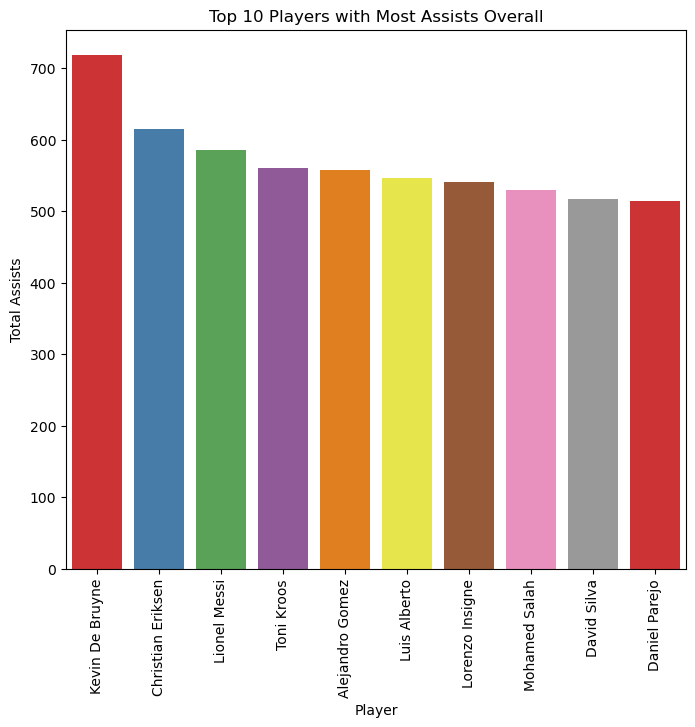

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




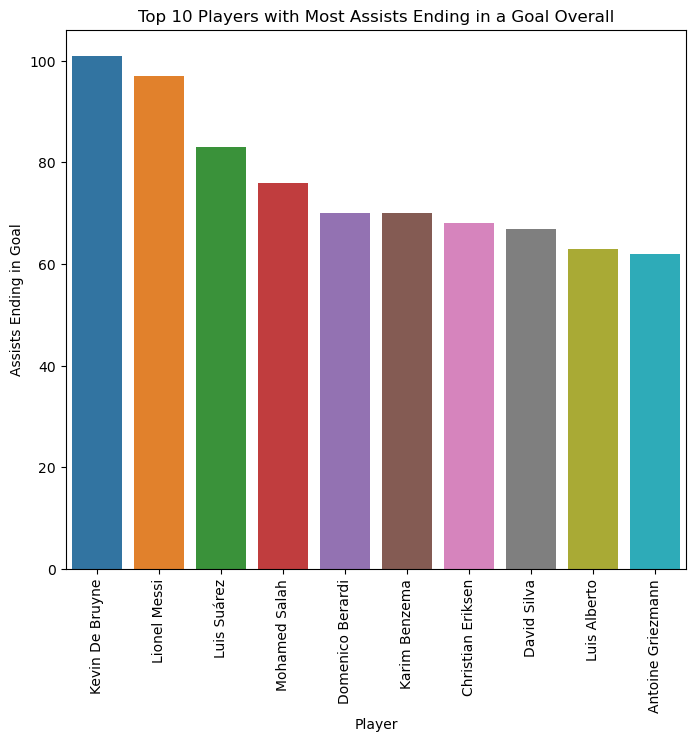

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




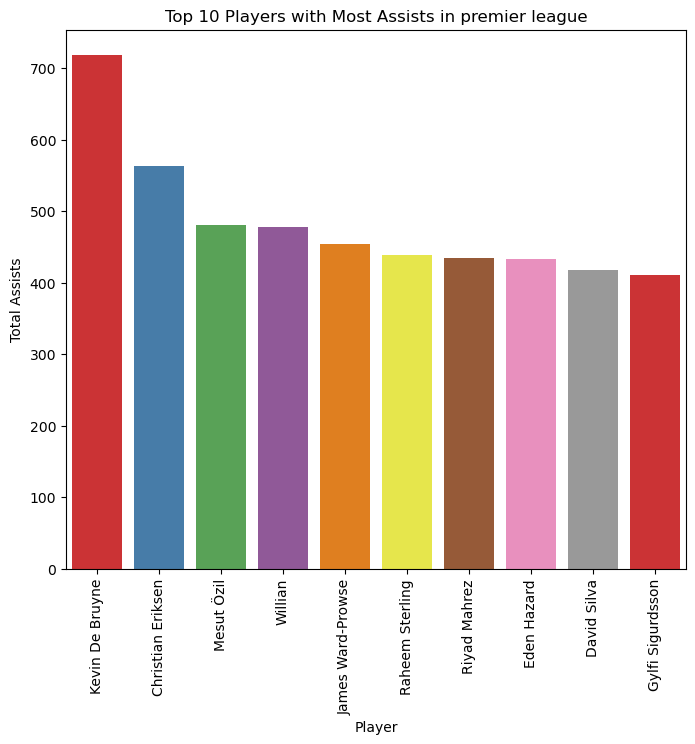

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




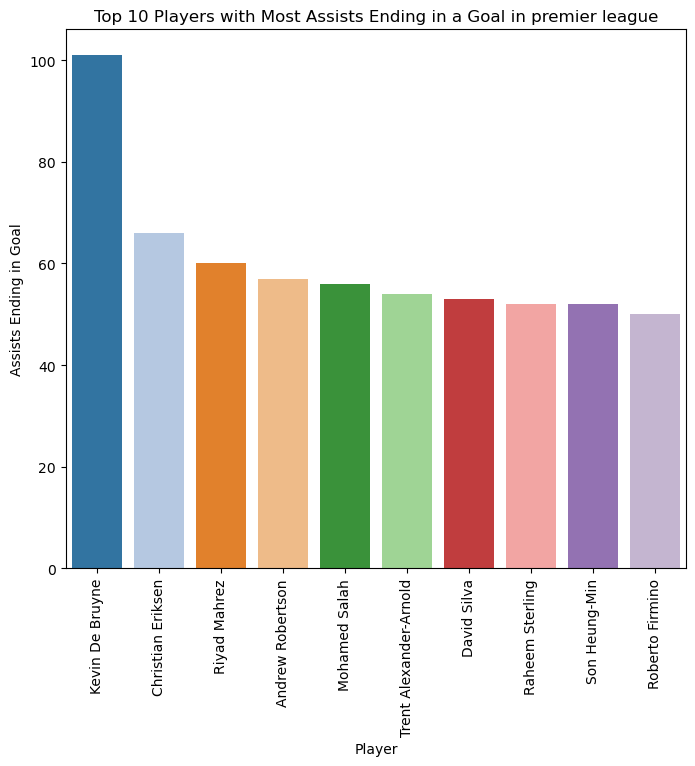

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




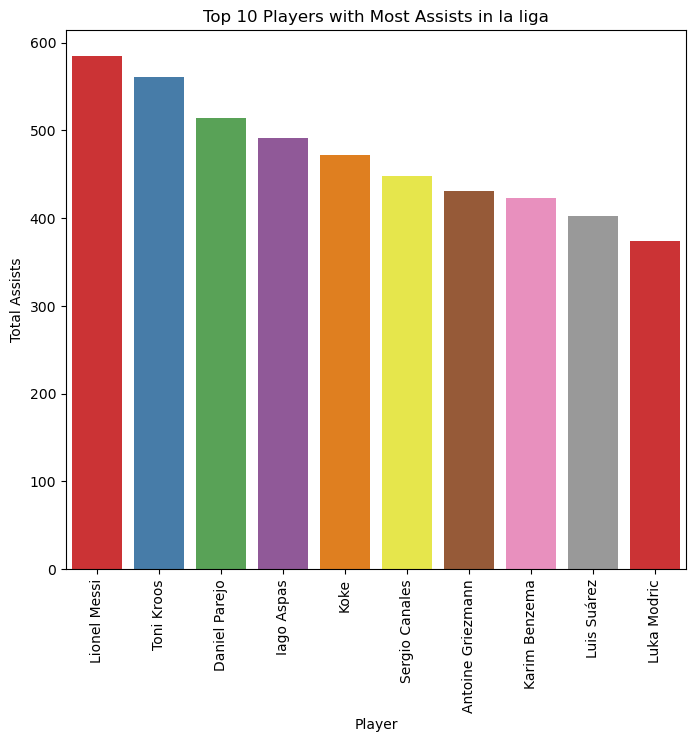

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




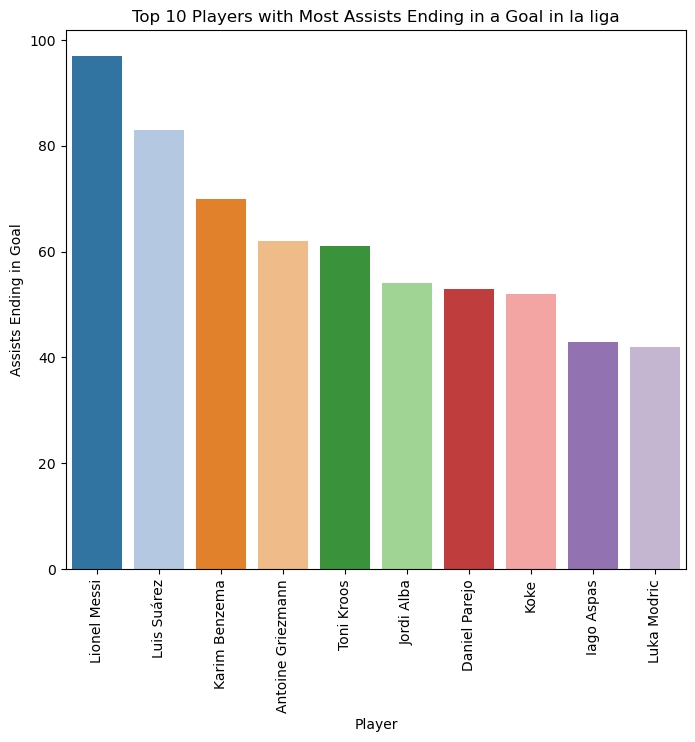

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




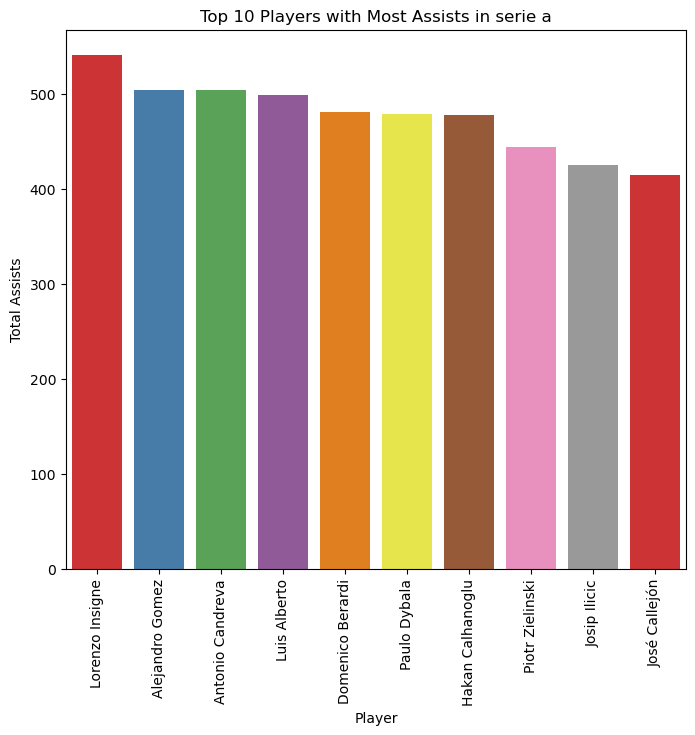

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/609563870.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




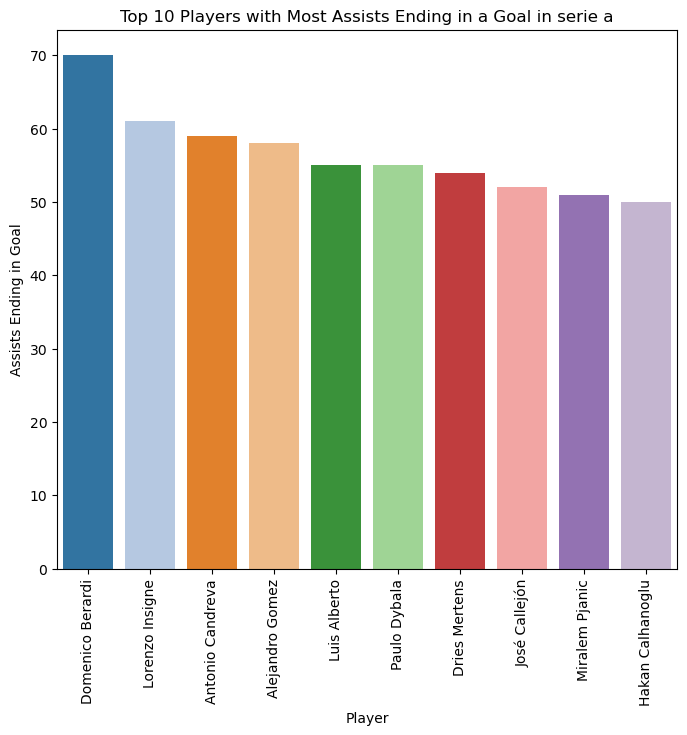

In [42]:
def create_bar_plot(df, x, y, title, xlabel, ylabel, palette):
    plt.figure(figsize=(8, 7))
    sns.barplot(data=df, x=x, y=y, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Plot overall metrics: top 10 players with the most assists and top 10 players with the most assists ending in a goal.
create_bar_plot(top_overall_assists, 'player_assisted', 'total_assists', 
                'Top 10 Players with Most Assists Overall', 'Player', 'Total Assists', 'Set1')

create_bar_plot(top_overall_assists_ending_in_goal, 'player_assisted', 'assists_ending_in_goal', 
                'Top 10 Players with Most Assists Ending in a Goal Overall', 'Player', 'Assists Ending in Goal', 'tab10')

# Plot league-specific metrics
for league in leagues:
    top_league_assists, top_league_assists_ending_in_goal = compute_league_assist_metrics(league)
    
    create_bar_plot(top_league_assists, 'player_assisted', 'total_assists', 
                    f'Top 10 Players with Most Assists in {league}', 'Player', 'Total Assists', 'Set1')
    
    create_bar_plot(top_league_assists_ending_in_goal, 'player_assisted', 'assists_ending_in_goal', 
                    f'Top 10 Players with Most Assists Ending in a Goal in {league}', 'Player', 'Assists Ending in Goal', 'tab20')

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




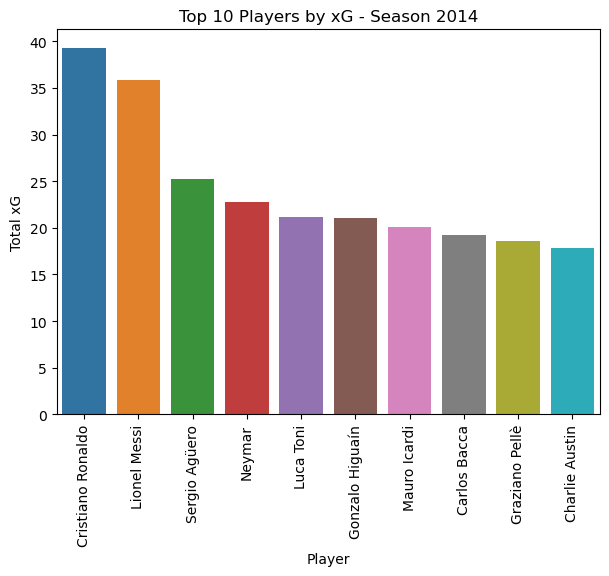

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




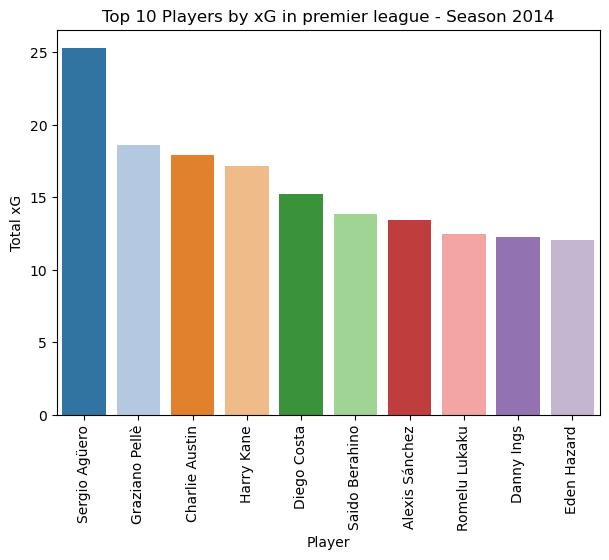

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




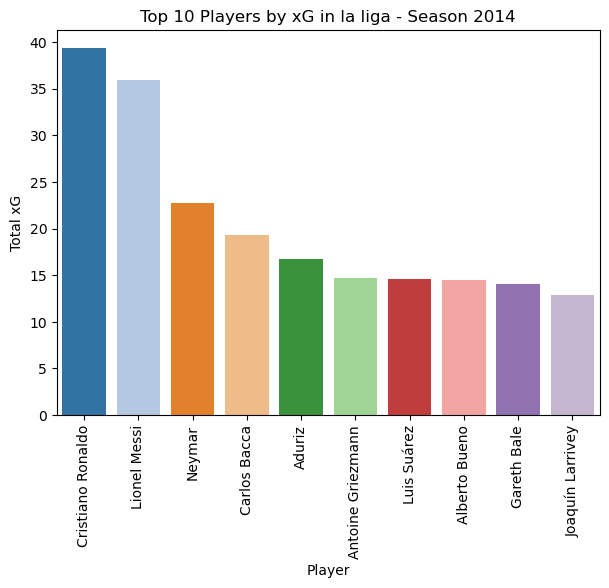

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




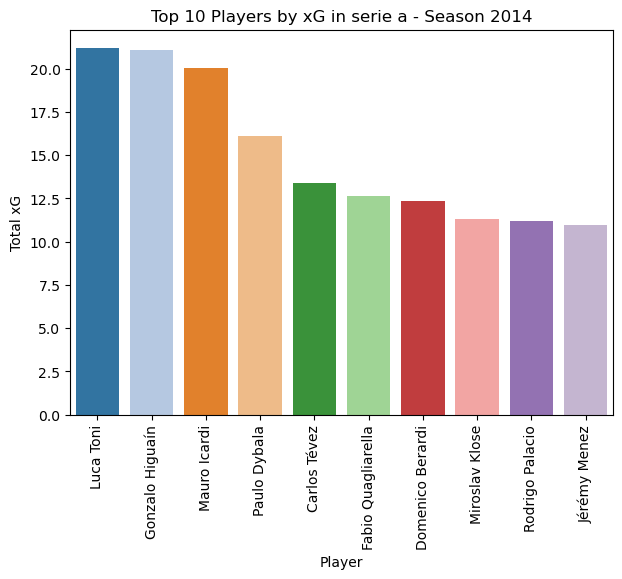

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




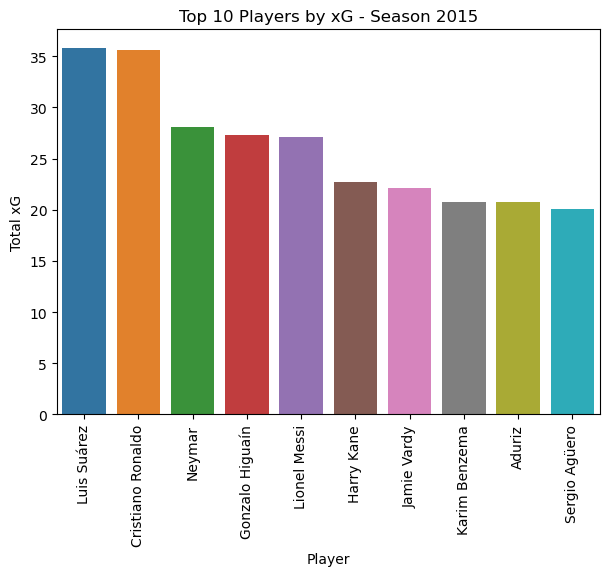

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




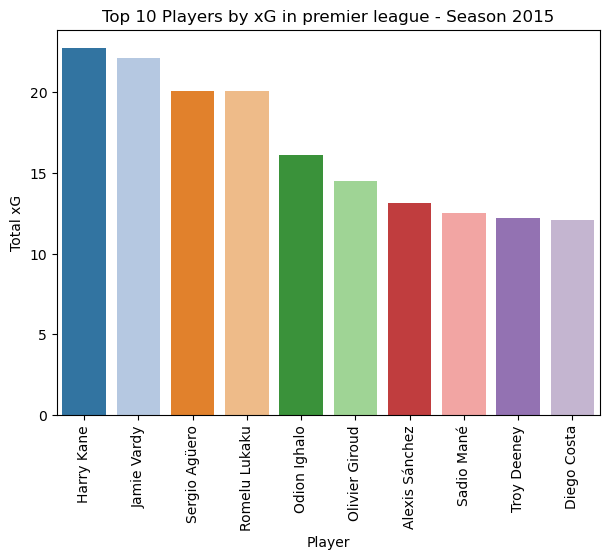

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




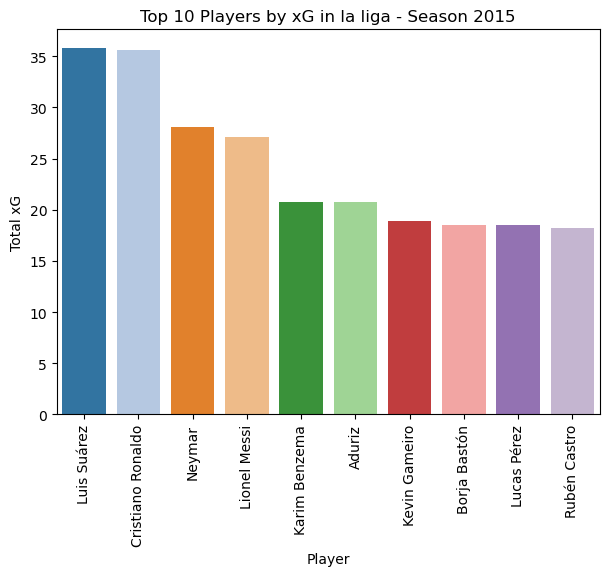

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




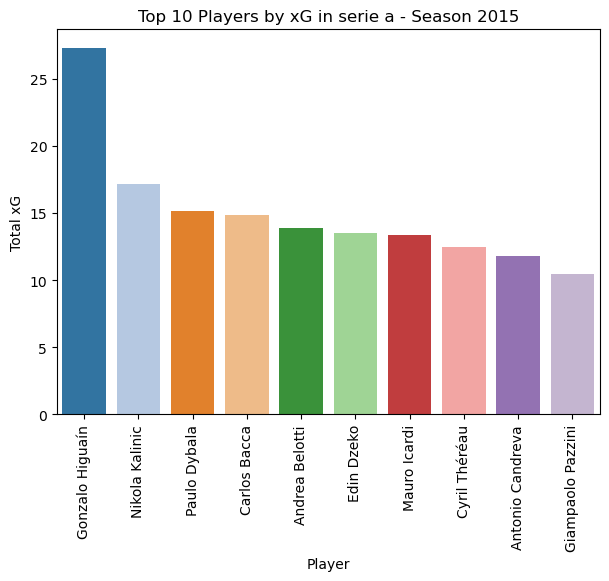

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




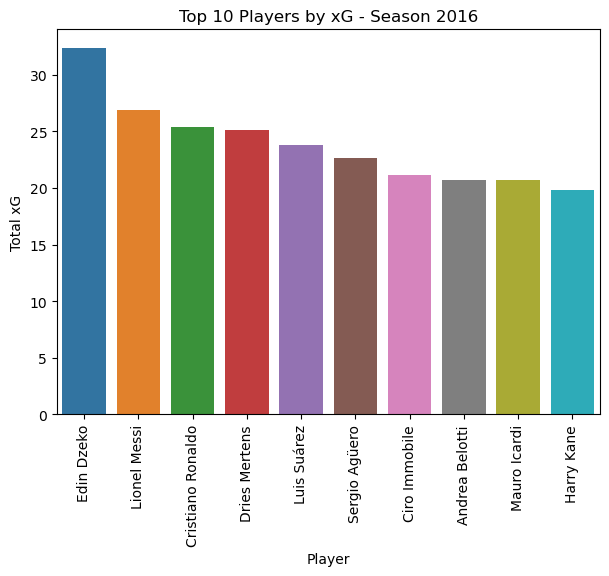

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




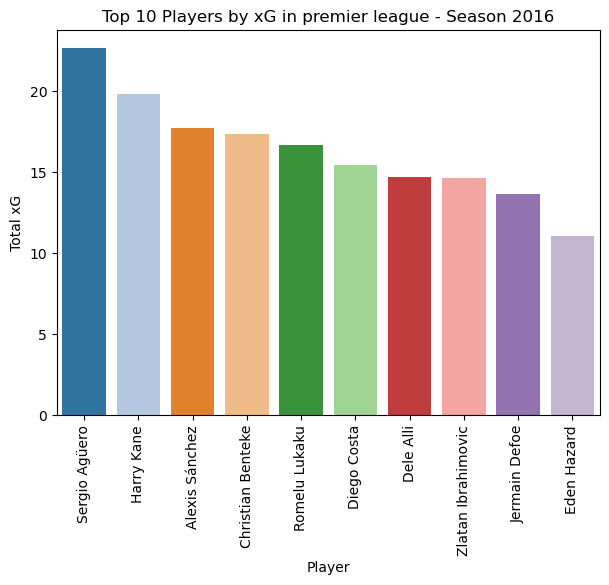

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




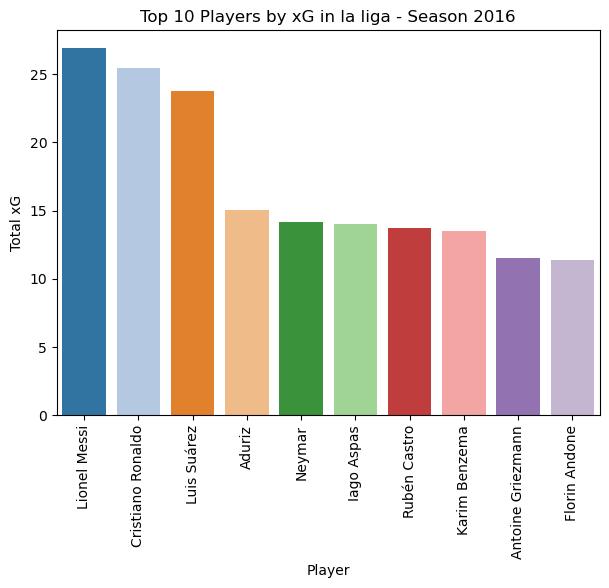

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




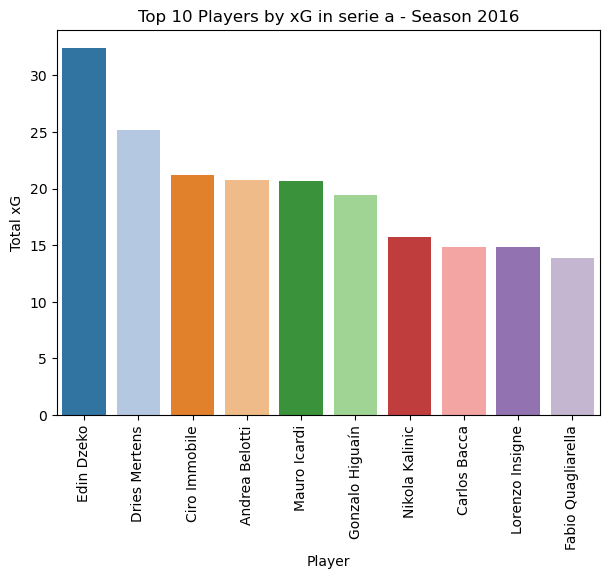

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




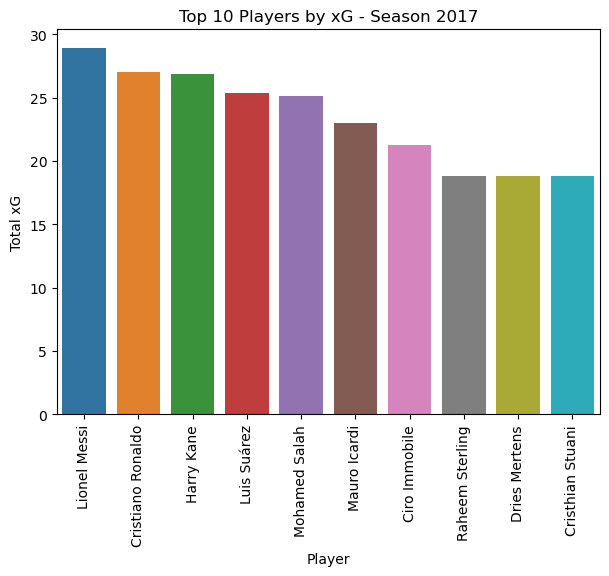

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




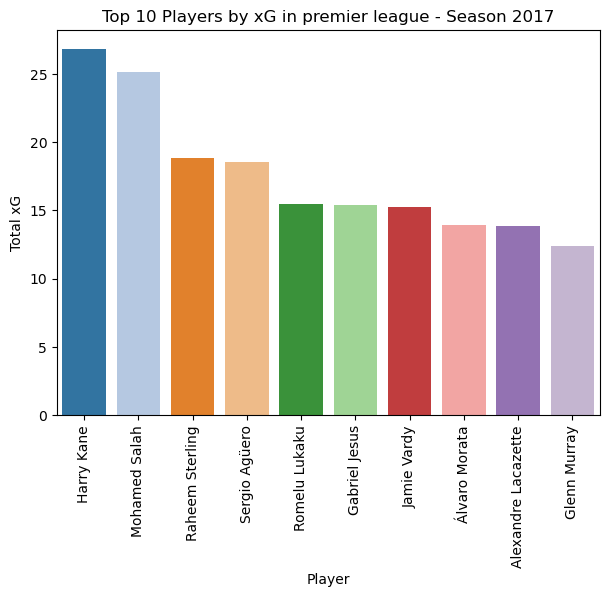

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




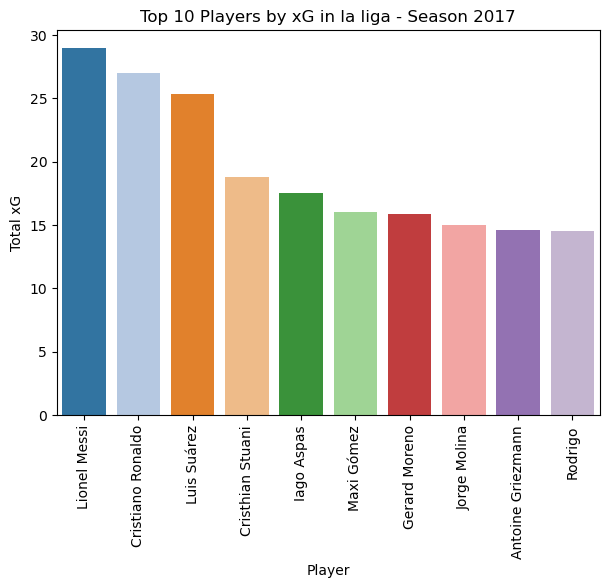

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




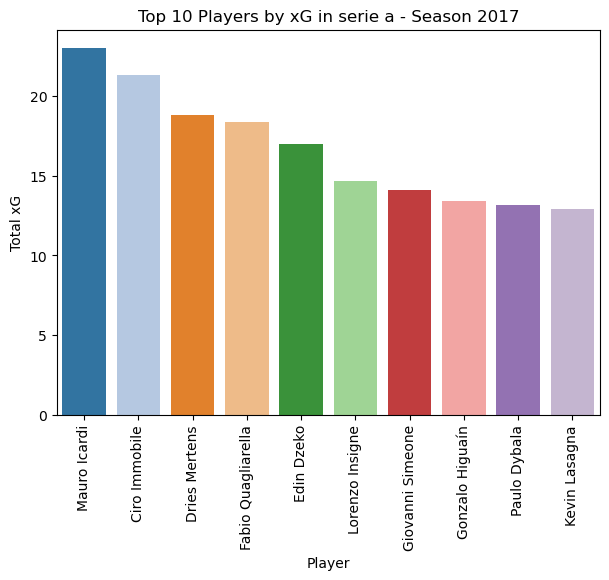

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




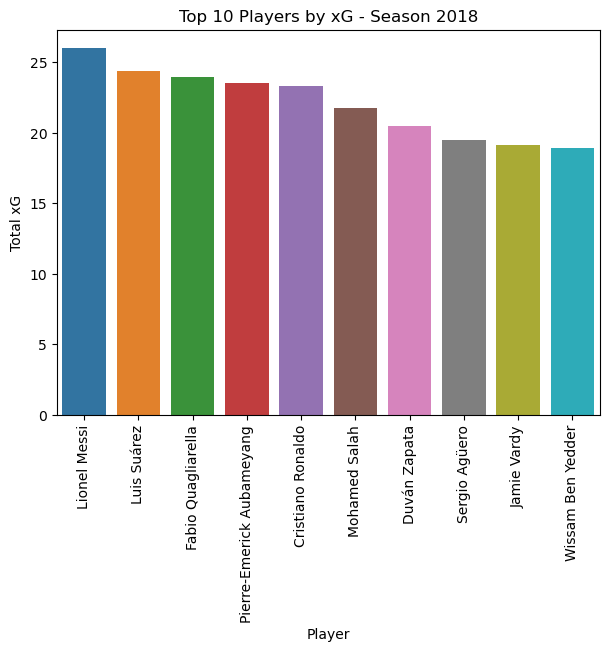

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




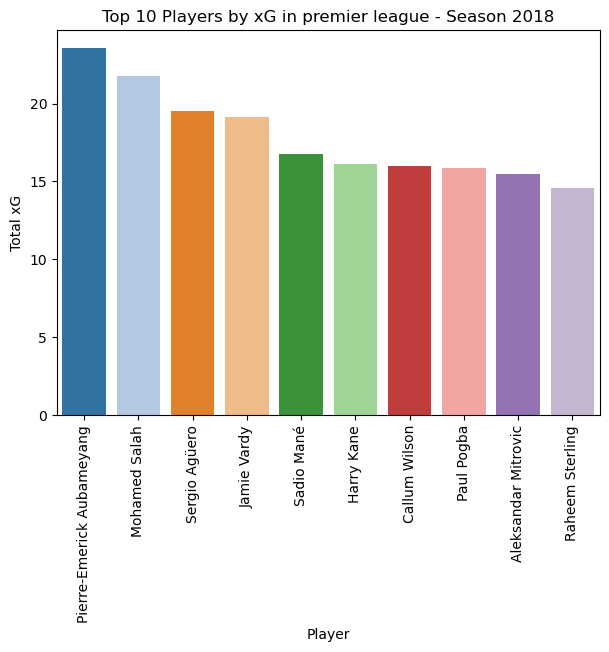

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




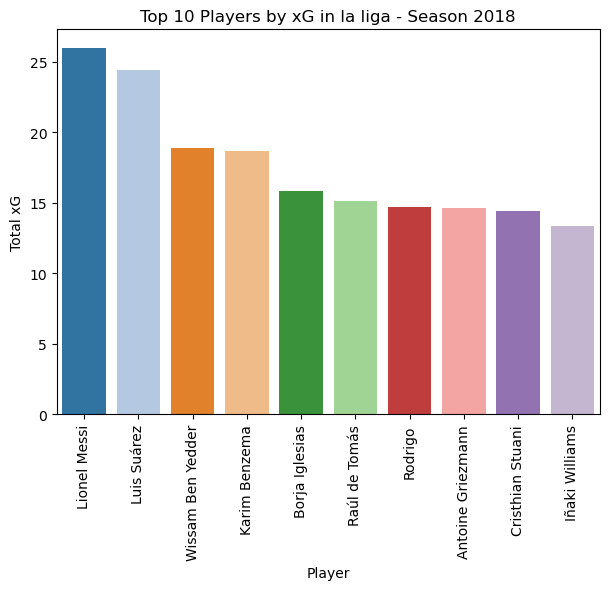

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




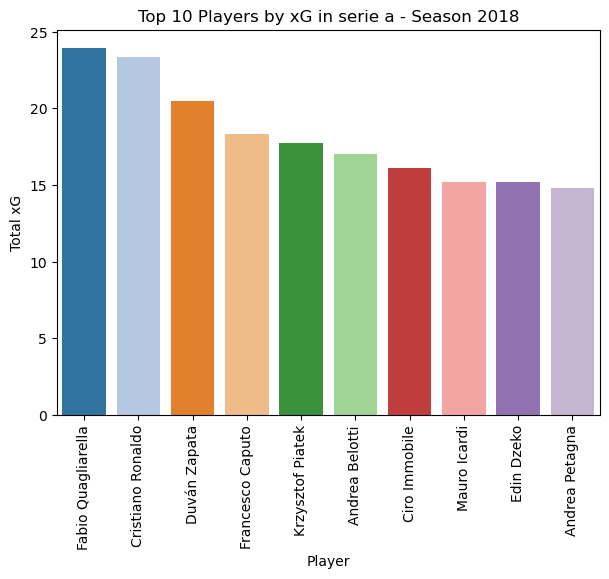

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




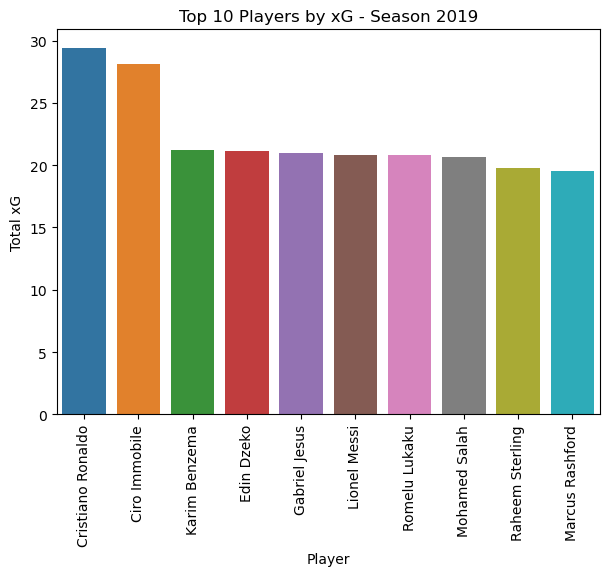

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




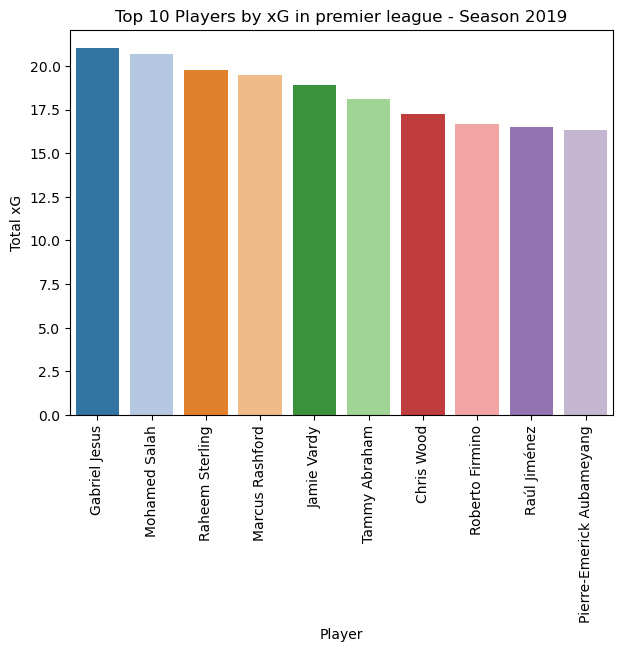

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




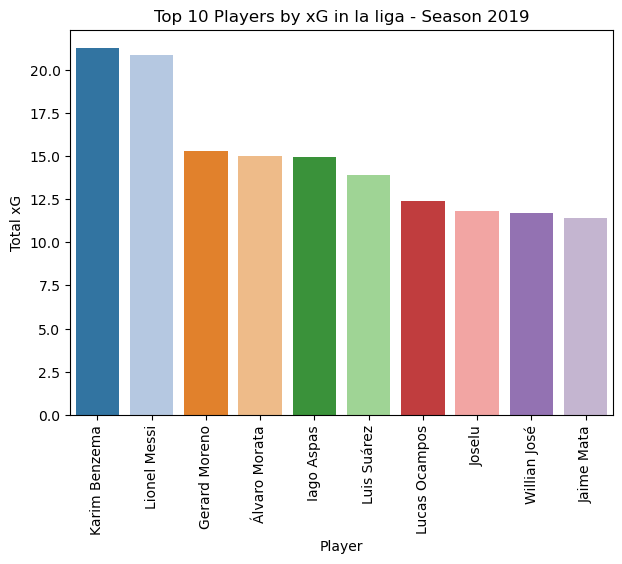

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




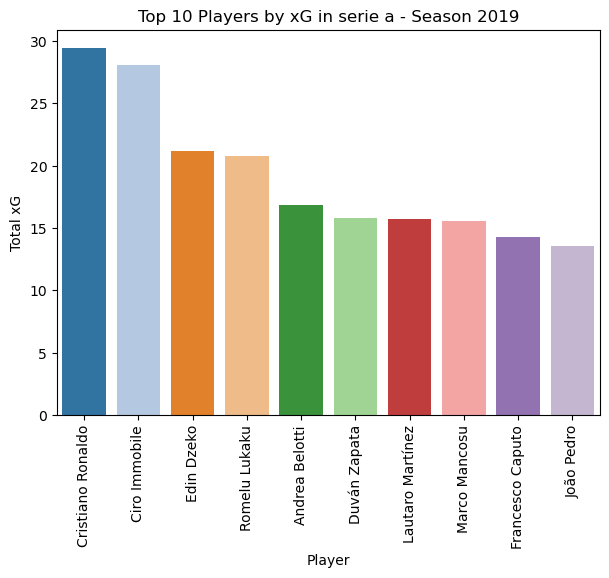

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




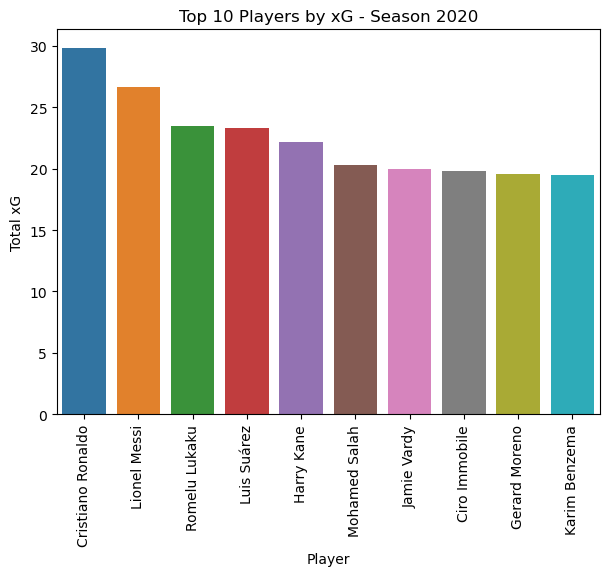

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




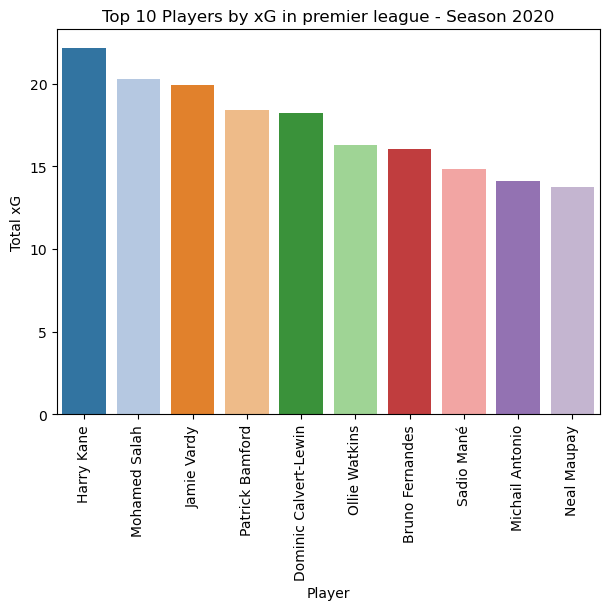

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




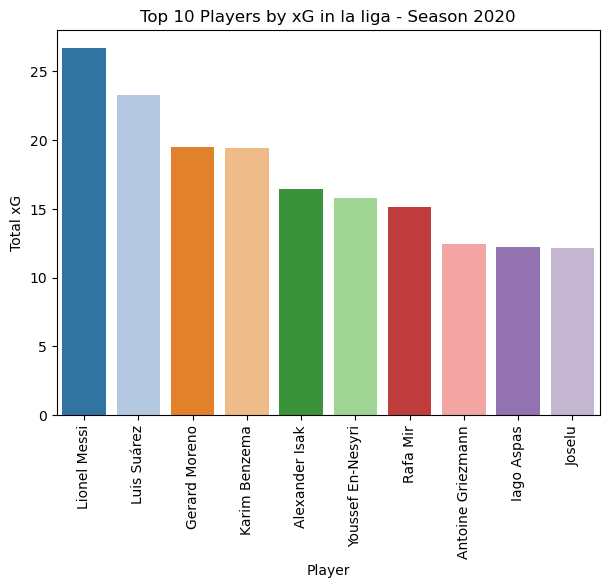

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




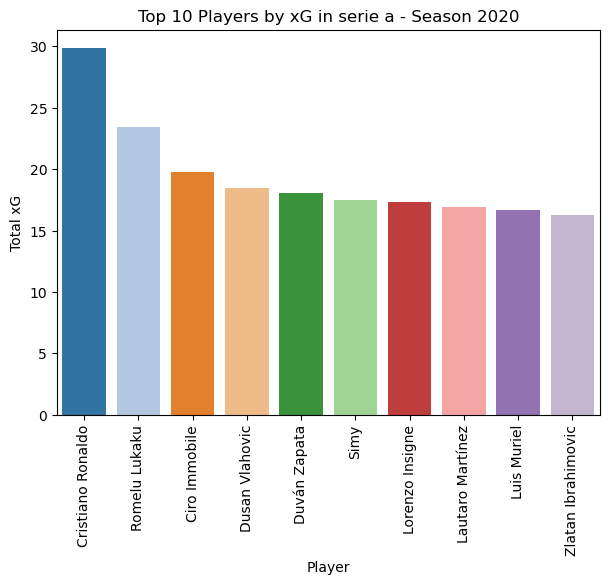

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




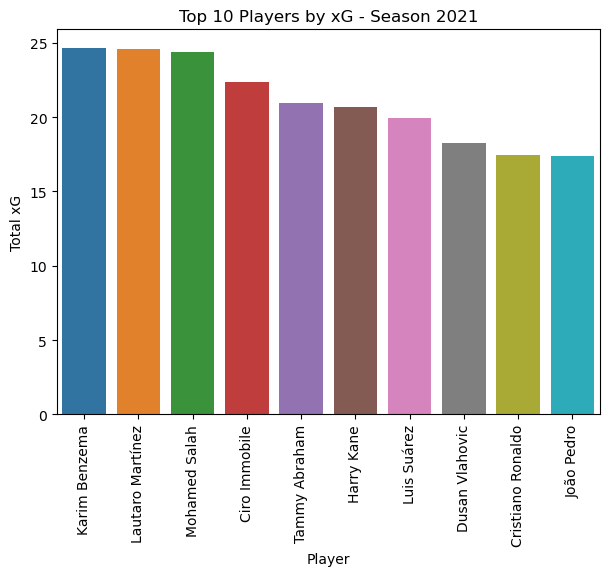

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




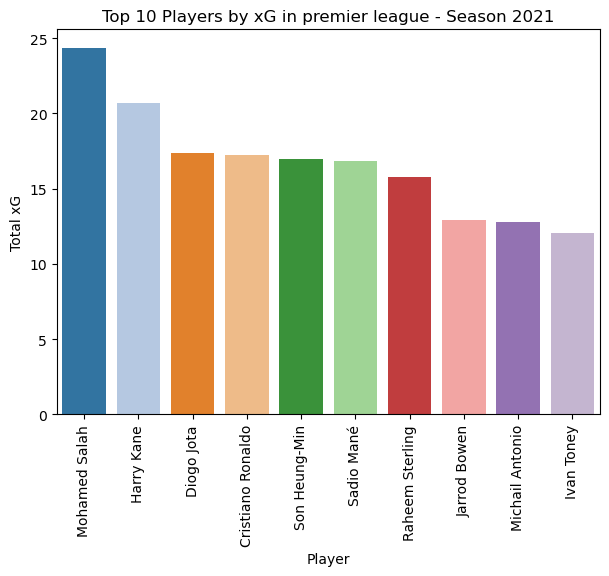

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




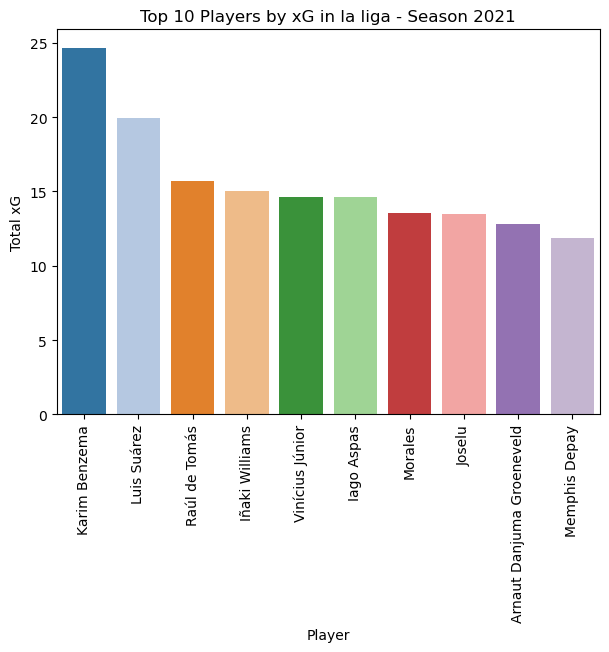

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




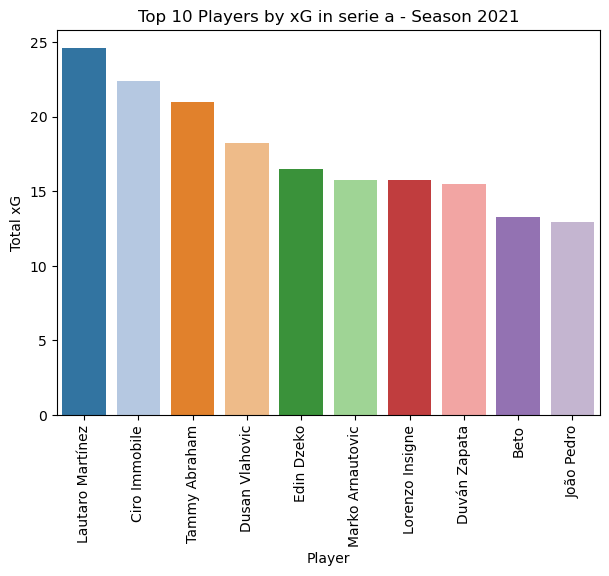

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




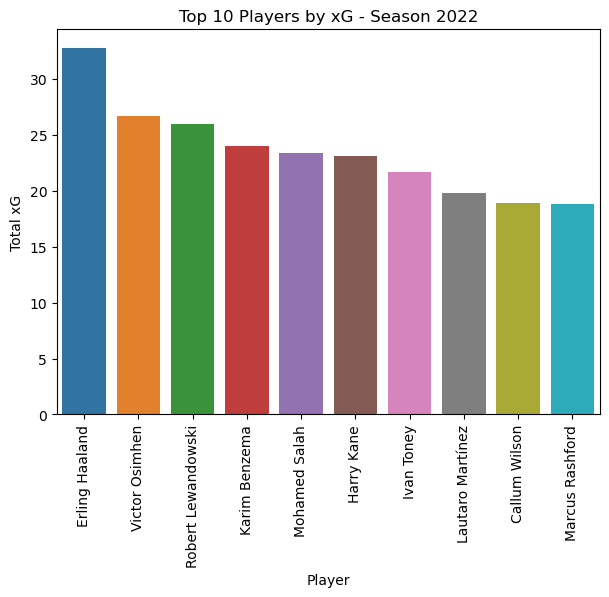

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




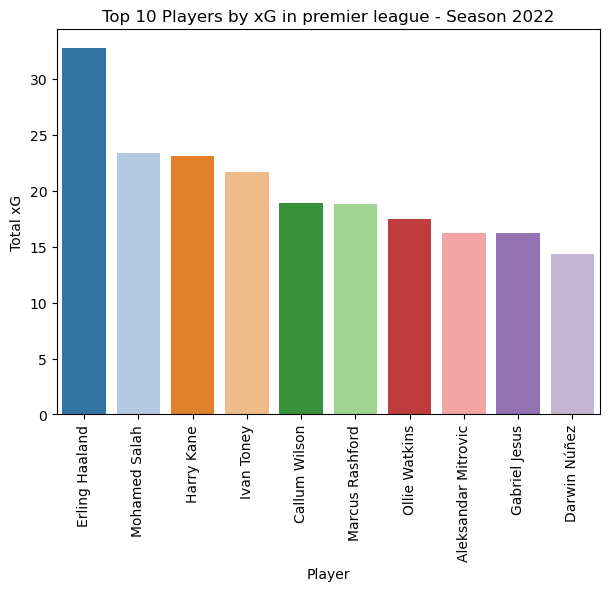

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




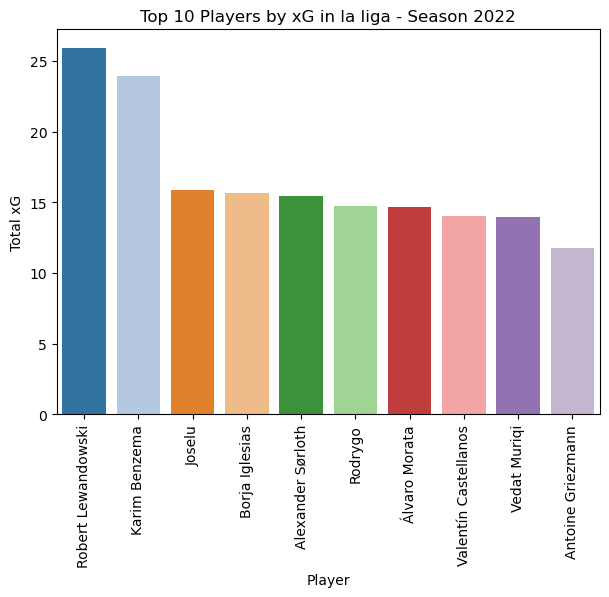

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




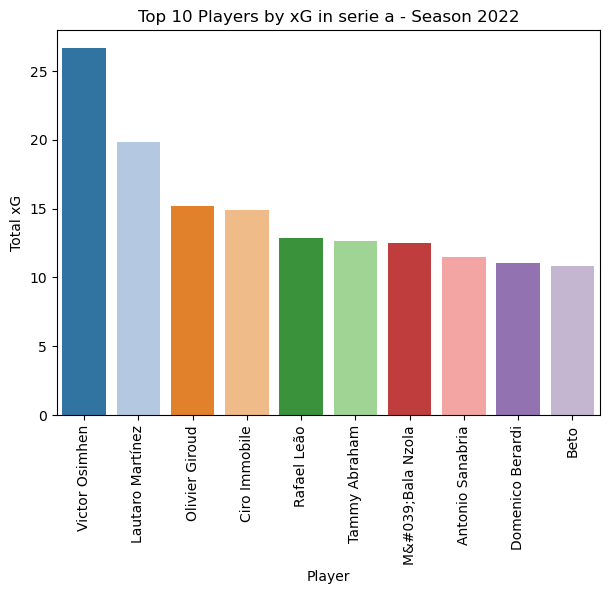

In [82]:
# Function to calculate the top players by expected goals (xG)
def calculate_top_xg_players(df, top_n=10):
    player_xg_sum = df.groupby('player_striker')['xG'].sum().reset_index()
    player_xg_sum.columns = ['Player name', 'Total xG']
    player_xg_sum = player_xg_sum.sort_values(by='Total xG', ascending=False)
    player_xg_sum = player_xg_sum[player_xg_sum['Player name'] != 'N/A']
    return player_xg_sum.head(top_n)

# Plotting function
def create_bar_plot(df, x, y, title, xlabel, ylabel, palette):
    plt.figure(figsize=(7,5))
    sns.barplot(data=df, x=x, y=y, palette=palette)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=90)
    plt.show()

# Calculate and plot top 10 players by xG for each year and each league within those years
years = shots['season'].unique()
leagues = shots['league_name_striker'].unique()

for year in years:
    year_shots = shots[shots['season'] == year]
    top_year_xg_players = calculate_top_xg_players(year_shots)
    create_bar_plot(top_year_xg_players, 'Player name', 'Total xG', 
                    f'Top 10 Players by xG - Season {year}', 'Player', 'Total xG', 'tab10')
    
    for league in leagues:
        league_year_shots = year_shots[year_shots['league_name_striker'] == league]
        if not league_year_shots.empty:
            top_league_year_xg_players = calculate_top_xg_players(league_year_shots)
            create_bar_plot(top_league_year_xg_players, 'Player name', 'Total xG', 
                            f'Top 10 Players by xG in {league} - Season {year}', 'Player', 'Total xG', 'tab20')

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_14587/533258763.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




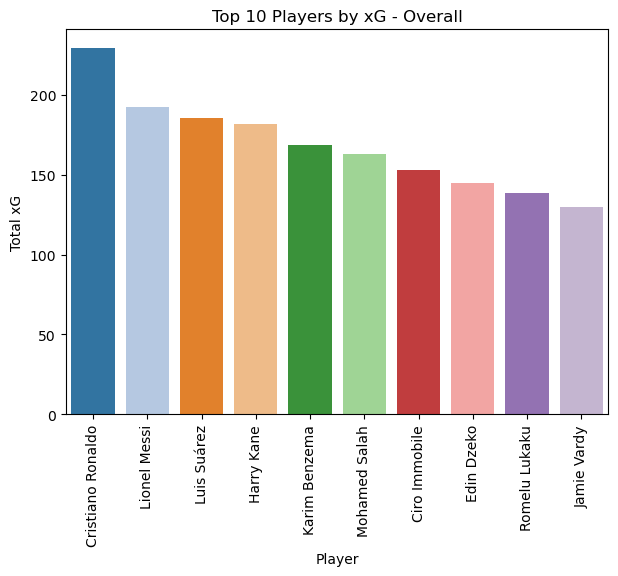

Top 10 Players by xG - Overall:
            Player name    Total xG
725   Cristiano Ronaldo  229.463137
2269       Lionel Messi  192.348808
2377        Luis Suárez  185.333688
1515         Harry Kane  181.913175
2085      Karim Benzema  168.632327
2801      Mohamed Salah  162.653405
672       Ciro Immobile  152.708031
1016         Edin Dzeko  144.535671
3345      Romelu Lukaku  138.775679
1729        Jamie Vardy  129.799697


In [85]:
def calculate_overall_top_xg_players(df, top_n=10):
    overall_player_xg_sum = df.groupby('player_striker')['xG'].sum().reset_index()
    overall_player_xg_sum.columns = ['Player name', 'Total xG']
    overall_player_xg_sum = overall_player_xg_sum.sort_values(by='Total xG', ascending=False)
    overall_player_xg_sum = overall_player_xg_sum[overall_player_xg_sum['Player name'] != 'N/A']
    return overall_player_xg_sum.head(top_n)

# Calculate overall top 10 players across all leagues and seasons
top_overall_xg_players = calculate_overall_top_xg_players(shots)

# Plot overall top 10 players by xG
create_bar_plot(top_overall_xg_players, 'Player name', 'Total xG', 
                'Top 10 Players by xG - Overall', 'Player', 'Total xG', 'tab20')

# Display the result
print("Top 10 Players by xG - Overall:")
print(top_overall_xg_players)